# Uncovering March Madness® Cinderella Stories
## Google Cloud & NCAA® March Madness Analytics 2020


Kaggle Analytics Prediction Competition
<br>April 30, 2020

### CONTENTS OF THIS FILE

- **[I. Definition](#I.-Definition)**
    - [1.1. Project Overview](#1.1.-Project-Overview)
    - [1.2. Problem Statement](#1.2.-Problem-Statement)
    - [1.3. Methodology](#1.3.-Methodology)
- **[II. Implementation](#II.-Implementation)**
    - [2.1. The Basics, 1985-2020](#2.1.-The-Basics,-1985-2020)
    - [2.2. Geography, 2010-2020](#2.2.-Geography,-2010-2020)
    - [2.3. Team Box Scores, 2003-2019](#2.3.-Team-Box-Scores,-2003-2019)
    - [2.4. Play-by-play, 2015-2020](#2.4.-Play-by-play,-2015-2020)
    - [2.5. Individual Statistics, 2015-2020](#2.5.-Individual-Statistics,-2015-2020)
    - [2.6. Public Rankings, 2003-2020](#2.6.-Public-Rankings,-2003-2020)
    - [2.7. Prediction Experiment](#2.7.-Prediction-Experiment)
- **[III. Results](#III.-Results)**
    - [3.1. General Findings](#3.1.-General-Findings)
    - [3.2. Uncovering Cinderellaness](#3.2.-Uncovering-Cinderellaness)
    - [3.3. Predicting Cinderellas](#3.3.-Predicting-Cinderellas)
- [References](#References)


---
#### A Note to the Reader

Editorial "we" is used in place of "I" and in the meaning of "the author and the reader". I recommend reading the [I. Definition](#I.-Definition) and [III. Results](#III.-Results) sections before the [II. Implementation](#II.-Implementation).

---
### ABSTRACT

Our analysis aimed to define common features and specific trends among "Cinderella" teams in NCAA® men's basketball. In this context, Cinderella was defined as any basketball team seeded 10th or worse that has advanced to the Round 3 in NCAA® tournament. We have divided all the remaining teams into two more categories - Top and Ordinary.

We explored, filtered and analyzed NCAA® data across different dimensions and used descriptive statistics and exploratory visualizations to summarize main characteristics about the data in general, and in particular about "Cinderellaness" as our target of interest.

Our analysis demonstrated that a typical Cinderella team is ranked between 20 and 65 in a pre-tournament rankings of a popular ranking systems. Cinderellas are good at shooting 2-pointers in the regular season, but not so much in the tournaments. The opposite is true for the three-point goals - Cinderellas have the highest three-point field goal ratio in NCAA® tournaments of all team categories. Cinderellas are successful in defensive rebounding and will likely have a positive Rebound Margin in the regular season games. They typically win with a high scoring margin in Round 2 of NCAA® tournament, but it is harder for them to keep it as high in the later rounds.

For this research, we have trained eXtreme Gradient Boosting (XGBoost) machine learning algorithm to predict which team had the best potential to become a Cinderella before the March Madness was canceled. Our model predicted that ETSU (East Tennessee State University) was the most likely candidate for a Cinderella team of the 2020 season.

---

# I. Definition

## 1.1. Project Overview

**Project Origin**

Each season there are thousands of men's and women's NCAA® basketball games played between Division I teams, culminating in March Madness®, the national championship tournaments that start in the middle of March [[1]](#References). The men's and women's NCAA basketball tournaments are beloved American sports traditions. These are single-elimination tournaments, which means that the championship team has to win at least six games in a row to claim the title. This high-stakes environment — plus the chance to witness a crazy "Cinderella-story" upset, gives the tournament its March Madness® nickname [[4]](#References).

The challenge of the "Google Cloud & NCAA® March Madness Analytics" competition, sponsored by [Google Cloud](https://cloud.google.com/) and hosted by [Kaggle](https://www.kaggle.com/), is to present an **exploratory analysis** of the March Madness® using a Kaggle Notebook.

**Prerequisite Knowledge**

In this study, we assume that the reader is familiar with the basic [NCAA® men's basketball rules](http://www.ncaa.org/playing-rules/mens-basketball-rules-game) and terminology. For those new to basketball, we recommend [[4]](#References) and [[26]](#References) for a quick introduction.

**Input Data**

The input NCAA® data is provided for this competition and is available from the competition website. The data is about college basketball games and teams and is divided into 6 sections - The Basics, Team Box Scores, Geography, Public Rankings, Play-by-play and Supplements. Please refer to the Data [[1]](#References) section at the bottom of this notebook for a full description of each file. On March 12, 2020, NCAA® canceled the Division I men's and women's 2020 basketball tournaments, as well as all remaining winter and spring NCAA® championships based on the evolving COVID-19 public health threat [[2]](#References), so the 2020 data is incomplete and does not have an information about 2020 NCAA® tournament bracket.


## 1.2. Problem Statement

The goal of our project is to use data analysis to explain "cinderellaness" - **define common features and specific trends among "Cinderella" teams in NCAA® men's basketball**.

The intended solution is to:

1. Define and filter out our target of interest - "Cinderella" teams
2. Preprocess, filter and analyze input data
3. Build visualizations to provide insights into the data & metrics
4. Use machine learning to predict which team had the potential to become a Cinderella in a 2020 season
5. Communicate the results of the analysis

## 1.3. Methodology

**Data Exploration and Preprocessing**

Scientific computing and analysis packages such as NumPy and Pandas will be used to **explore and preprocess the data**. Data cleaning will be performed where necessary. We will filter data across different categories, such as regular season vs. NCAA® tournament, all games vs. games won, team segment vs. metric vs. season.

### <span style="color:DarkRed"><b>Data Segmentation</b></span><a class="anchor-link" href="#Data-Segmentation" target="_self">¶</a>

The essential part of our analysis is to divide men's NCAA® basketball teams into 3 groups - **Cinderella**, **Top** and **Ordinary**.

A March Madness Cinderella is a team that greatly exceeds its NCAA® tournament expectations. They are generally afterthoughts on the Selection Sunday bracket, but wind up becoming one of the biggest stories of the tournament [[3]](#References). In NCAA®, the field of teams is divided into four geographical regions. Each region has between 16 and 18 teams, which are assigned a seed number of one through 18, with the best team in the region awarded the No. 1 seed. Traditionally, the highest seeds (Nos. 1 through 8) have enjoyed more success than the lower seeds (Nos. 9 through 16). The lower seeds represent potential Cinderellas of the tournament. A Cinderella team is one that unexpectedly achieves success in the tournament. Traditionally, Cinderella's chariot turns back into a pumpkin before getting to the Final Four [[4]](#References) (also see Figure 1).

Considering the above definition, we decided to use the following segmentation as the foundation for our discussion and analysis:

1. <span style="color:DarkRed"><b>CINDERELLA</b></span> - any basketball team **seeded 10th or worse that has advanced to the Round 3** in NCAA® tournament. This group is our target of interest.
2. <span style="color:DarkRed"><b>TOP</b></span> - **top-seeded (Nos. 1 through 4**) teams who have advanced to the Round 3 in NCAA® tournament. This group will represent the most competitive teams - teams that match expectations.
3. <span style="color:DarkRed"><b>ORDINARY</b></span> - all the other NCAA® tournament teams not falling under two previous categories, for example seeded No 2. but lost in the first-round game. Note that all seed Nos. 5 through 9 will always fall under this category.

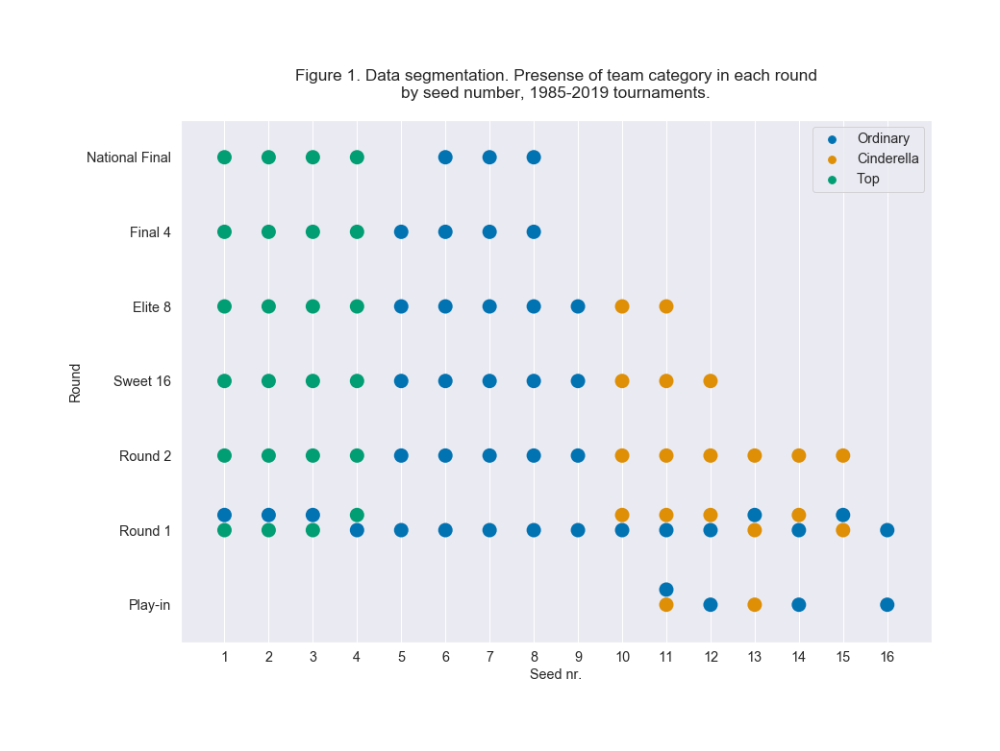

In [250]:
display_img("06.png")


---

Here is the example segmentation result based on season 2019 data:

**CINDERELLA TEAM OF 2018-19** 

Twelfth-seeded Oregon Ducks defeated Wisconsin 72-54 in a first-round game and beated UC Irvine 73-54 in a second-round game to advance to Sweet 16, where they lost 49-53 to a No. 1 seed Virginia, making this a classical example of a March Madness Cinderella story.

<div style="width:200px;height:60px;background-color:#173F35;text-align: center;font-size:12pt;color:#fff;"><br>DUCKS</div>

<br />

**TOP TEAMS OF 2018-19** 

Notice how 16 teams were seeded Nos. 1 through 4, but only 14 are included in our TOP category, because 2 of the top-seeded teams (Kansas State Wildcats and Kansas Jayhawks) have not 
advanced to the Round 3. 

<div style="width:200px;height:60px;background-color:#002D72;text-align: center;font-size:12pt;color:#fff;display: inline-block;">
	<br>BLUE DEVILS</div><div style="width:200px;height:60px;background-color:#782F40;text-align: center;font-size:12pt;color:#fff;display: inline-block;">
	<br>SEMINOLES</div><div style="width:200px;height:60px;background-color:#041E42;text-align: center;font-size:12pt;color:#fff;display: inline-block;">
	<br>BULLDOGS</div><div style="width:200px;height:60px;background-color:#C8102E;text-align: center;font-size:12pt;color:#fff;display: inline-block;">
	<br>COUGARS</div><br />
    
<div style="width:200px;height:60px;background-color:#0032A0;text-align: center;font-size:12pt;color:#fff;display: inline-block;">
	<br>WILDCATS</div><div style="width:200px;height:60px;background-color:#582C83;text-align: center;font-size:12pt;color:#fff;display: inline-block;">
	<br>FIGHTING TIGERS</div><div style="width:200px;height:60px;background-color:#DA291C;text-align: center;font-size:12pt;color:#fff;display: inline-block;">
	<br>RED RAIDERS</div><div style="width:200px;height:60px;background-color:#173F35;text-align: center;font-size:12pt;color:#fff;display: inline-block;">
	<br>SPARTANS</div><br />
    
<div style="width:200px;height:60px;background-color:#7BAFD4;text-align: center;font-size:12pt;color:#fff;display: inline-block;">
	<br>TAR HEELS</div><div style="width:200px;height:60px;background-color:#010101;text-align: center;font-size:12pt;color:#fff;display: inline-block;">
	<br>BOILERMAKERS</div><div style="width:200px;height:60px;background-color:#FF8200;text-align: center;font-size:12pt;color:#fff;display: inline-block;">
	<br>VOLUNTEERS</div><div style="width:200px;height:60px;background-color:#041E42;text-align: center;font-size:12pt;color:#fff;display: inline-block;">
	<br>WOLVERINES</div><br />
    
<div style="width:200px;height:60px;background-color:#232D4B;text-align: center;font-size:12pt;color:#fff;display: inline-block;">
	<br>CAVALIERS</div><div style="width:200px;height:60px;background-color:#861F41;text-align: center;font-size:12pt;color:#fff;display: inline-block;">
	<br>HOKIES</div>

---

**Exploratory Visualizations**

Data visualization libraries such as **Matplotlib, Seaborn and Plotly** will be used to create the exploratory visualizations. We will utilize different types of graphs, including but not limited to box plots, scatter plots and bar plots, to compare the features across different dimensions and see how features are distributed. Image graphs are called "**Figure** ..." and interactive graphs (that are responsive to mouse-over events) are called "... **Interactive graph**" for readers' convenience. 

**Statistical Analysis**

We will use descriptive statistics and measures of central tendency, such as **mean** (the average) and **median** (the middle value), to quantitatively describe and summarize our features of interest. Considering that Top category teams are expected to outperform two other categories in most cases, we want to focus more on **comparing Cinderella teams to Ordinary teams**, for example analyze some metric for Cinderellas vs. median value of the same metric for Ordinary teams.

**Machine Learning**

We will use machine learning techniques to speculate which teams could become Cinderellas in season 2020 if the tournament would not be canceled. Our intention is to try out different classifiers and choose whichever performs best. While machine learning is not the main focus of our study, we might also want to apply some model refinement techniques to meet a certain threshold. We will use **Scikit-learn, XGBoost and Imbalanced-learn** modules to implement model training, evaluation and improvement.

---
<span style="font-size:14pt;">🏀 CLICK <a href="#III.-Results" target="_self">HERE</a> TO SKIP TO THE RESULTS 🏀</span>

---
# II. Implementation

## Exploratory Data Analysis
This section contains all the source code used in the analysis, including the code to create figures, interactive graphs and descriptive numbers.

In [2]:
%matplotlib inline

# Import packages:

import numpy as np 
import pandas as pd 
pd.set_option('mode.chained_assignment', None)

import matplotlib.pyplot as plt
import matplotlib.pylab as pylab

import seaborn as sns

from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Define default seaborn plot params:
sns.set(rc={'figure.figsize':(14,10)})
sns.set_palette("colorblind")

# Define default matplotlib plot params:
params = {'figure.figsize':(14,10),
          'figure.titlesize':16,
          'axes.titlesize':'x-large',
          'axes.labelsize':'large',
          'xtick.labelsize':'large',
          'ytick.labelsize':'large',
          'legend.fontsize':'large'}
pylab.rcParams.update(params)

# Define default plotly plot params:
plotly_width = 880

import warnings
warnings.filterwarnings("ignore")

In [3]:
file_nr = 1

def save_plot():
    '''Save plot into a ##.png file'''
    global file_nr
    if sys.executable != '/opt/conda/bin/python': # if running this notebook locally
        plt.savefig('kaggle/working/' + (str(file_nr).zfill(2)) + '.png', bbox_inches='tight', pad_inches=1)
    else:
        plt.savefig((str(file_nr).zfill(2)) + '.png', bbox_inches='tight', pad_inches=0.5)
    print("File nr. {}".format(file_nr))
    file_nr +=1

In [4]:
import sys

men_dir = "/kaggle/input/march-madness-analytics-2020/MDataFiles_Stage2/"

if sys.executable != '/opt/conda/bin/python':
    # remove the forward slash if running this notebook locally:
    men_dir = men_dir[1:]
    
def load_file(df, name):
    '''Load in the file and show basic info'''
    print("File: {}".format(name))
    df = pd.read_csv(men_dir + name + '.csv')
    print("Num rows: {}".format(len(df)))
    print("NaN values: {}".format(df.isna().sum().sum()))
    print("Duplicated rows: {}".format(df.duplicated().sum()))
    print(pd.concat([df.head(3), df.tail(2)]))
    return(df)

## 2.1. The Basics, 1985-2020

**Data Section 1 file: MRegularSeasonCompactResults.csv** - this file identifies the game-by-game results for many seasons of historical data, starting with the 1985 season (the first year the NCAA® had a 64-team tournament) [[1]](#References).

We will check each file that we load for a data quality issues like Null values and duplicate rows.

In [5]:
MRegularSeasonCompactResults = None
MRegularSeasonCompactResults = load_file(MRegularSeasonCompactResults, "MRegularSeasonCompactResults")

File: MRegularSeasonCompactResults
Num rows: 166880
NaN values: 0
Duplicated rows: 0
        Season  DayNum  WTeamID  WScore  LTeamID  LScore WLoc  NumOT
0         1985      20     1228      81     1328      64    N      0
1         1985      25     1106      77     1354      70    H      0
2         1985      25     1112      63     1223      56    H      0
166878    2020     128     1393      81     1314      53    N      0
166879    2020     128     1389      56     1233      54    N      0


**Data Section 1 file: MNCAATourneyCompactResults.csv** - this file identifies the game-by-game NCAA® tournament results for all seasons of historical data [[1]](#References).

In [6]:
MNCAATourneyCompactResults = None
MNCAATourneyCompactResults = load_file(MNCAATourneyCompactResults, "MNCAATourneyCompactResults")

File: MNCAATourneyCompactResults
Num rows: 2251
NaN values: 0
Duplicated rows: 0
      Season  DayNum  WTeamID  WScore  LTeamID  LScore WLoc  NumOT
0       1985     136     1116      63     1234      54    N      0
1       1985     136     1120      59     1345      58    N      0
2       1985     136     1207      68     1250      43    N      0
2249    2019     152     1438      63     1120      62    N      0
2250    2019     154     1438      85     1403      77    N      1


**Calculate scoring margin** (a difference between the number of points scored by the winning team and the number of points scored by the losing team) for both dataframes:

In [7]:
for df in [MRegularSeasonCompactResults, MNCAATourneyCompactResults]:
    df['Scoring margin'] = df['WScore'] - df['LScore']
    
MRegularSeasonCompactResults.sample(3)

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,Scoring margin
61093,2000,31,1320,48,1453,47,H,0,1
125045,2013,29,1350,80,1330,53,A,0,27
161740,2020,5,1253,74,1360,62,H,0,12


In [8]:
MNCAATourneyCompactResults.sample(3)

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,Scoring margin
1818,2013,138,1112,74,1217,51,N,0,23
266,1989,136,1438,100,1344,97,N,0,3
1990,2016,136,1181,93,1423,85,N,0,8


### Is it easier to win on the home court?

See how many games were won on each of the locations:

In [9]:
MRegularSeasonCompactResults.WLoc.value_counts()

H    99086
A    50934
N    16860
Name: WLoc, dtype: int64

Total regular season games that were not on the neutral court:

In [10]:
len(MRegularSeasonCompactResults[MRegularSeasonCompactResults.WLoc != "N"])

150020

Create a plot. Note that we have added all figure numbers later, after we knew their order in the [Results](#II.-Results) section.

1985-2020
File nr. 1


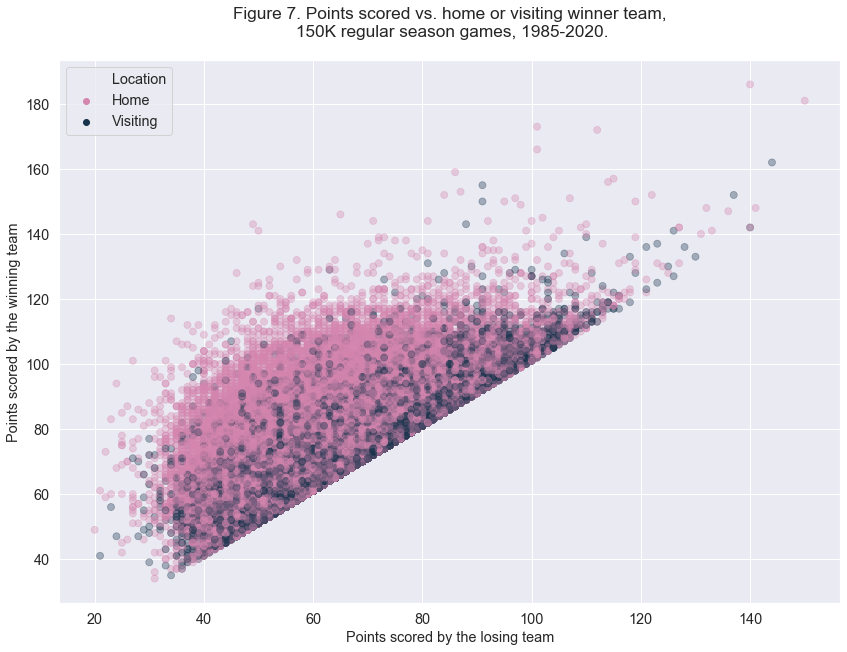

In [11]:
colors = [sns.color_palette("cubehelix", 10)[6], sns.color_palette("cubehelix", 10)[1], 'gold']

df = MRegularSeasonCompactResults[MRegularSeasonCompactResults.WLoc != "N"]
print(f'{df.Season.min()}-{df.Season.max()}')

sns.scatterplot(x="LScore", y="WScore", data=df,
                hue="WLoc", palette=colors[:-1], edgecolor=None, s=50, alpha=0.35)

plt.xlabel("Points scored by the losing team")
plt.ylabel("Points scored by the winning team")

ax = plt.gca()
legend = ax.legend()
legend.texts[0].set_text("Location")
legend.texts[1].set_text("Home")
legend.texts[2].set_text("Visiting")

plt.title('Figure 7. Points scored vs. home or visiting winner team,\n 150K regular season games, 1985-2020.\n')

save_plot()
plt.show()

Total regular season games in our data:

In [12]:
len(MRegularSeasonCompactResults)

166880

1985-2020
File nr. 2


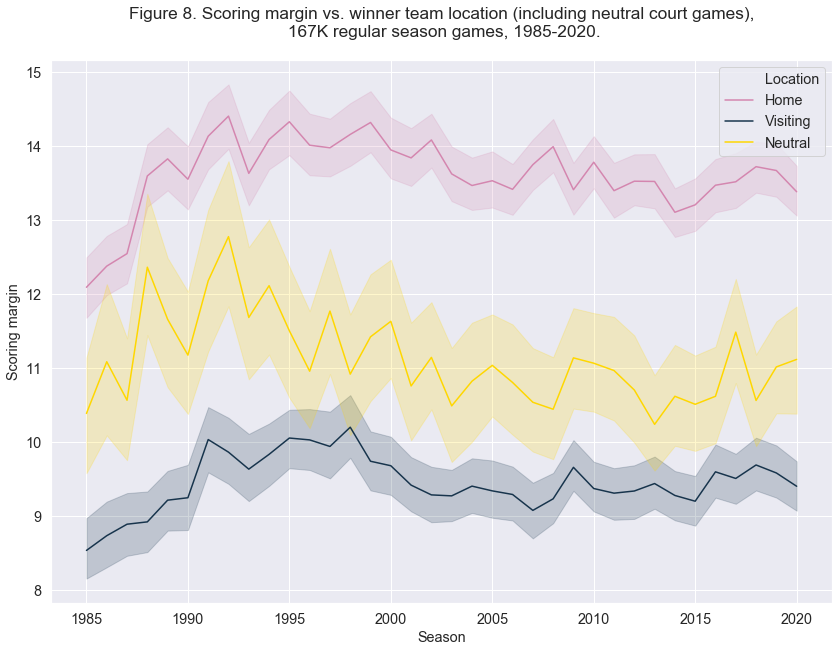

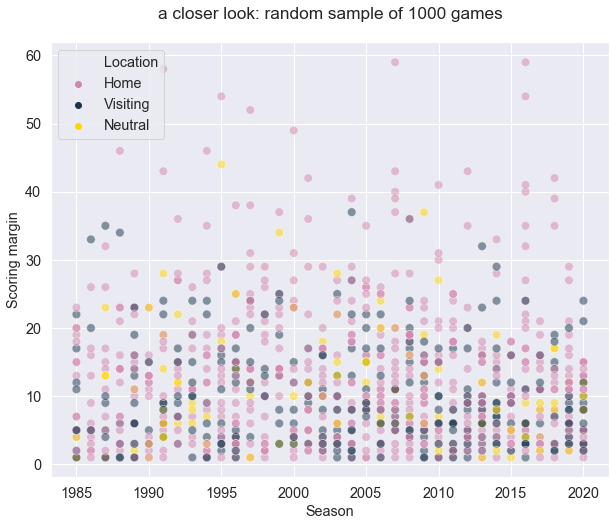

Descriptive statistics for file nr. 2:


Scoring margin                                                  
              count       mean        std  min  25%   50%   75%   max
WLoc                                                                 
A           50934.0   9.458456   7.347603  1.0  4.0   8.0  13.0  67.0
H           99086.0  13.626325  10.152739  1.0  6.0  12.0  19.0  94.0
N           16860.0  11.086536   8.424748  1.0  5.0   9.0  15.0  84.0

In [13]:
### Plot 1 ###

df = MRegularSeasonCompactResults
print(f'{df.Season.min()}-{df.Season.max()}')

sns.lineplot(x="Season", y="Scoring margin", data=df,
                hue="WLoc", hue_order=['H', 'A', 'N'],
                palette=colors)

plt.xlabel("Season")

ax = plt.gca()
legend = ax.legend()
legend.texts[0].set_text("Location")
legend.texts[1].set_text("Home")
legend.texts[2].set_text("Visiting")
legend.texts[3].set_text("Neutral")

plt.title('Figure 8. Scoring margin vs. winner team location (including neutral court games),\n 167K regular season games, 1985-2020.\n')

save_plot()
plt.show()


### Plot 2 ###

plt.figure(figsize=(10,8))

sns.scatterplot(x="Season", y="Scoring margin", data=MRegularSeasonCompactResults.sample(1000, random_state=0),
                hue="WLoc", edgecolor='w', alpha=0.5, s=75, hue_order=['H', 'A', 'N'],
                palette=colors)

plt.xlabel("Season")

ax = plt.gca()
legend = ax.legend()
legend.texts[0].set_text("Location")
legend.texts[1].set_text("Home")
legend.texts[2].set_text("Visiting")
legend.texts[3].set_text("Neutral")

plt.title('a closer look: random sample of 1000 games\n')

plt.show()


print("Descriptive statistics for file nr. {}:".format(str(file_nr-1)))
MRegularSeasonCompactResults[['WLoc', 'Scoring margin']].groupby('WLoc').describe()

The smaller plot ("a closer look") did not make it to the [Results](#III.-Results) section, but you can see how games on a visiting court almost never had a scoring margin above 30 (for a winning teams on this particular sample).
___

**Create a game round column for NCAA® tournaments** 

Because of the consistent structure of the tournament schedule, we can actually tell what round a game was, depending on the exact DayNum [[1]](#References). Thus:

- DayNum=134 or 135 (Tue/Wed) - play-in 
- DayNum=136 or 137 (Thu/Fri) - Round 1
- DayNum=138 or 139 (Sat/Sun) - Round 2
- DayNum=143 or 144 (Thu/Fri) - Round 3
- DayNum=145 or 146 (Sat/Sun) - Round 4
- DayNum=152 (Sat) - Round 5
- DayNum=154 (Mon) - Round 6 (national final) 

In [14]:
MNCAATourneyCompactResults['Round'] = MNCAATourneyCompactResults['DayNum'] # copy DayNum column
MNCAATourneyCompactResults['Round'].replace({134: "Play-in",
                                             135: "Play-in",
                                             136: "Round 1",
                                             137: "Round 1",
                                             138: "Round 2",
                                             139: "Round 2",
                                             143: "Sweet 16",
                                             144: "Sweet 16",
                                             145: "Elite 8",
                                             146: "Elite 8",
                                             152: "Final 4",
                                             154: "National Final"}, inplace=True) # replace values with round names

# Also add numerical round values for easier sorting:
MNCAATourneyCompactResults['NumRound'] = MNCAATourneyCompactResults['DayNum'] # copy DayNum column
MNCAATourneyCompactResults['NumRound'].replace({134: 0,
                                             135: 0,
                                             136: 1,
                                             137: 1,
                                             138: 2,
                                             139: 2,
                                             143: 3,
                                             144: 3,
                                             145: 4,
                                             146: 4,
                                             152: 5,
                                             154: 6}, inplace=True) # replace values with round names

MNCAATourneyCompactResults.sample(3)

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,Scoring margin,Round,NumRound
514,1993,136,1371,81,1398,59,N,0,22,Round 1,1
240,1988,143,1437,80,1246,74,N,0,6,Sweet 16,3
225,1988,138,1314,123,1258,97,N,0,26,Round 2,2


#### What is the importance of seeding in March Madness?

The men’s college basketball tournament is made up of 68 teams. On Selection Sunday, before any tournament game is played, those teams are ranked 1 through 68 by the Selection Committee, with the best team in college basketball — based on regular season and conference tournament performance — sitting at No. 1. Four of those teams are eliminated in the opening round of the tournament (known as the First Four), leaving us with a field of 64 for the first round. Those 64 teams are split into four regions of 16 teams each, with each team being ranked 1 through 16. That ranking is the team’s seed [[23]](#References).


In [15]:
MNCAATourneySeeds = pd.read_csv(men_dir + '/MNCAATourneySeeds.csv')
MNCAATourneySeeds.sample(5)

,Season,Seed,TeamID
1160,2003,W07,1386
1157,2003,W04,1257
1216,2003,Z14,1161
441,1991,Z10,1140
2119,2017,Y04,1345


### Data segmentation - Cinderella, Top, Ordinary

#### Create a numeric seed column

In [16]:
MNCAATourneySeeds['SeedNo'] = MNCAATourneySeeds.Seed.str.extract('(\d+)').astype(np.int64)
MNCAATourneySeeds.sample(5)

,Season,Seed,TeamID,SeedNo
1224,2004,W06,1314,6
1142,2002,Z05,1274,5
44,1985,Y13,1235,13
991,2000,X16,1354,16
1072,2001,Y16b,1457,16


#### Connect seed numbers with the NCAA® tournament data
Merge dataframes on season and winner team ID:

In [17]:
len(MNCAATourneyCompactResults)

2251

In [18]:
MNCAATourneyCompactResults = pd.merge(MNCAATourneyCompactResults,
                                          MNCAATourneySeeds,
                                          how='inner',
                                          left_on=['Season', 'WTeamID'],
                                          right_on=['Season', 'TeamID'])

MNCAATourneyCompactResults = MNCAATourneyCompactResults.drop('TeamID', 1)

MNCAATourneyCompactResults

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,Scoring margin,Round,NumRound,Seed,SeedNo
0,1985,136,1116,63,1234,54,N,0,9,Round 1,1,X09,9
1,1985,136,1120,59,1345,58,N,0,1,Round 1,1,Z11,11
2,1985,138,1120,66,1242,64,N,0,2,Round 2,2,Z11,11
3,1985,136,1207,68,1250,43,N,0,25,Round 1,1,W01,1
4,1985,138,1207,63,1396,46,N,0,17,Round 2,2,W01,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2246,2019,152,1438,63,1120,62,N,0,1,Final 4,5,Z01,1
2247,2019,154,1438,85,1403,77,N,1,8,National Final,6,Z01,1
2248,2019,137,1439,66,1387,52,N,0,14,Round 1,1,W04,4
2249,2019,139,1439,67,1251,58,N,0,9,Round 2,2,W04,4


To filter out Cinderella teams we will look at any basketball team **seeded 10th or worse that has advanced to the Round 3**

Seeded 10th or worse:

In [19]:
# Seeded 10th or worse:
possible_cinderellas = MNCAATourneyCompactResults[MNCAATourneyCompactResults['SeedNo'] >= 10]
possible_cinderellas

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,Scoring margin,Round,NumRound,Seed,SeedNo
1,1985,136,1120,59,1345,58,N,0,1,Round 1,1,Z11,11
2,1985,138,1120,66,1242,64,N,0,2,Round 2,2,Z11,11
10,1985,136,1246,66,1449,58,N,0,8,Round 1,1,X12,12
11,1985,138,1246,64,1424,61,N,0,3,Round 2,2,X12,12
33,1985,137,1130,55,1403,53,N,0,2,Round 1,1,Y11,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2226,2019,137,1251,80,1280,76,N,0,4,Round 1,1,W12,12
2229,2019,137,1326,62,1235,59,N,0,3,Round 1,1,Y11,11
2231,2019,137,1332,72,1458,54,N,0,18,Round 1,1,Z12,12
2232,2019,139,1332,73,1414,54,N,0,19,Round 2,2,Z12,12


Advanced to the Round 3:

In [20]:
# Round 2 is DayNum=138 or 139 (Sat/Sun), to bring the tournament field from 32 teams to 16 teams (to SWEET 16):
cinderellas = possible_cinderellas[possible_cinderellas['DayNum'] >= 138] # played in Round 2
cinderellas["Cinderella"] = 1
cinderellas = cinderellas[['Season', 'WTeamID', 'Cinderella']].drop_duplicates() # won in Round 2 (will play in Round 3)
cinderellas

,Season,WTeamID,Cinderella
2,1985,1120,1
11,1985,1246,1
34,1985,1130,1
65,1986,1177,1
85,1986,1261,1
...,...,...,...
2035,2016,1393,1
2082,2017,1462,1
2121,2018,1393,1
2139,2018,1260,1


**Data Section 1 file: MTeams.csv** - this file identifies the different college teams present in the dataset. Each school is uniquely identified by a 4 digit id number [[1]](#References).

In [21]:
MTeams = None
MTeams = load_file(MTeams, "MTeams")

File: MTeams
Num rows: 367
NaN values: 0
Duplicated rows: 0
     TeamID       TeamName  FirstD1Season  LastD1Season
0      1101    Abilene Chr           2014          2020
1      1102      Air Force           1985          2020
2      1103          Akron           1985          2020
365    1466  North Alabama           2019          2020
366    1467      Merrimack           2020          2020


### The resulting list of Cinderella teams

In [22]:
# Group by season and winner team id:
season_team_cinderellas = cinderellas.groupby(['Season','WTeamID'], as_index=False).mean()
season_team_cinderellas = season_team_cinderellas.sort_values(by='Season')

# Print out the resulting list of cinderella teams:
for index, row in season_team_cinderellas.iterrows():
    team_id = season_team_cinderellas['WTeamID'][index]
    print("Season: {}; Team: {}".format(season_team_cinderellas['Season'][index], MTeams.loc[MTeams['TeamID'] == team_id, 'TeamName'].values[0]))

Season: 1985; Team: Auburn
Season: 1985; Team: Boston College
Season: 1985; Team: Kentucky
Season: 1986; Team: Cleveland St
Season: 1986; Team: DePaul
Season: 1986; Team: LSU
Season: 1987; Team: LSU
Season: 1987; Team: Wyoming
Season: 1988; Team: Richmond
Season: 1988; Team: Rhode Island
Season: 1989; Team: Minnesota
Season: 1990; Team: Ball St
Season: 1990; Team: Loy Marymount
Season: 1990; Team: Texas
Season: 1991; Team: Connecticut
Season: 1991; Team: E Michigan
Season: 1991; Team: Temple
Season: 1992; Team: New Mexico St
Season: 1993; Team: G Washington
Season: 1994; Team: Maryland
Season: 1994; Team: Tulsa
Season: 1996; Team: Arkansas
Season: 1997; Team: Chattanooga
Season: 1997; Team: Providence
Season: 1997; Team: Texas
Season: 1998; Team: West Virginia
Season: 1998; Team: Washington
Season: 1998; Team: Valparaiso
Season: 1999; Team: Gonzaga
Season: 1999; Team: Miami OH
Season: 1999; Team: Missouri St
Season: 1999; Team: Oklahoma
Season: 1999; Team: Purdue
Season: 2000; Team: Go

### How many Cinderella teams did each season have?

1985-2019
File nr. 3


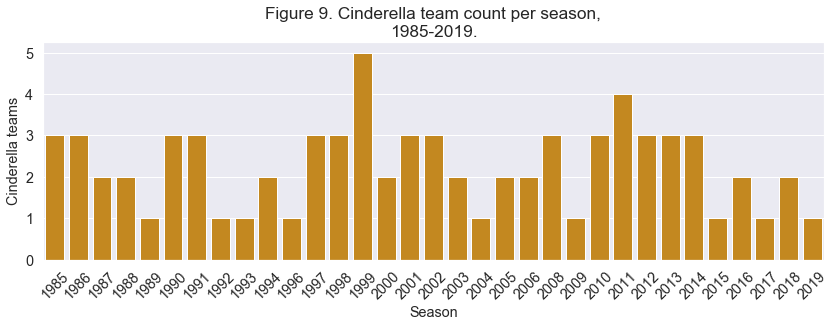

In [23]:
plt.figure(figsize=(14,4))

df = season_team_cinderellas
print(f'{df.Season.min()}-{df.Season.max()}')

g = sns.countplot(season_team_cinderellas.Season, palette=sns.color_palette("colorblind")[1:2])

g.set_xticklabels(g.get_xticklabels(), rotation=45)
plt.ylabel("Cinderella teams")

plt.title("Figure 9. Cinderella team count per season,\n1985-2019.")

save_plot()
plt.show()

A closer look at one example (2019, team Oregon):

In [24]:
# See the 2019 example:
MNCAATourneyCompactResults[((MNCAATourneyCompactResults['WTeamID'] == 1332) | (MNCAATourneyCompactResults['LTeamID'] == 1332))
                           & (MNCAATourneyCompactResults['Season'] == 2019)]

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,Scoring margin,Round,NumRound,Seed,SeedNo
2231,2019,137,1332,72,1458,54,N,0,18,Round 1,1,Z12,12
2232,2019,139,1332,73,1414,54,N,0,19,Round 2,2,Z12,12
2244,2019,143,1438,53,1332,49,N,0,4,Sweet 16,3,Z01,1


From above table: team 1332 (Oregon) won in Round 1 and Round 2, and lost in the Sweet 16 to the team 1438.
___

**Make a separate group for the top-seeded teams** who has advanced to the Round 3.

This group will represent most competitive teams (high seed and high performance).

In [25]:
# Seeded 1, 2, 3 or 4:
top_seeded = MNCAATourneyCompactResults[MNCAATourneyCompactResults['SeedNo'] <= 4]

# Round 2 is DayNum=138 or 139 (Sat/Sun), to bring the tournament field from 32 teams to 16 teams (to SWEET 16):
top_seeded = top_seeded[top_seeded['DayNum'] >= 138]
top_seeded["Top"] = 1
top_seeded = top_seeded[['Season', 'WTeamID', 'Top']].drop_duplicates()
top_seeded

,Season,WTeamID,Top
4,1985,1207,1
15,1985,1260,1
17,1985,1314,1
22,1985,1328,1
26,1985,1385,1
...,...,...,...
2228,2019,1314,1
2234,2019,1397,1
2236,2019,1403,1
2243,2019,1438,1


A closer look at 2019 season:

In [26]:
# Group by season and team id in SEASON 2019 ONLY:
season_team_top_2019 = top_seeded[top_seeded["Season"] == 2019].groupby(['Season','WTeamID'], as_index=False).mean()

# Print out the resulting list of top teams in SEASON 2019 ONLY:
print("Season 2019 Top teams:\n")
for index, row in season_team_top_2019.iterrows():
    team_id = season_team_top_2019['WTeamID'][index]
    print("Season: {}; Team: {}".format(season_team_top_2019['Season'][index], MTeams.loc[MTeams['TeamID'] == team_id, 'TeamName'].values[0]))

Season 2019 Top teams:

Season: 2019; Team: Duke
Season: 2019; Team: Florida St
Season: 2019; Team: Gonzaga
Season: 2019; Team: Houston
Season: 2019; Team: Kentucky
Season: 2019; Team: LSU
Season: 2019; Team: Michigan
Season: 2019; Team: Michigan St
Season: 2019; Team: North Carolina
Season: 2019; Team: Purdue
Season: 2019; Team: Tennessee
Season: 2019; Team: Texas Tech
Season: 2019; Team: Virginia
Season: 2019; Team: Virginia Tech


#### Create a new dataframe to compare Cinderella teams vs. Top vs. Ordinary teams
Filter by season - we don't want to include seasons without any cinderella teams:

In [27]:
# Filter by season - we don't want to include seasons without any cinderella teams:

### Regular season ###
labeled_MRegularSeasonCompactResults = MRegularSeasonCompactResults[MRegularSeasonCompactResults['Season'].isin(season_team_cinderellas['Season'].tolist())]

### Tournaments ###
labeled_MNCAATourneyCompactResults = MNCAATourneyCompactResults[MNCAATourneyCompactResults['Season'].isin(season_team_cinderellas['Season'].tolist())]
labeled_MNCAATourneyCompactResults

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,Scoring margin,Round,NumRound,Seed,SeedNo
0,1985,136,1116,63,1234,54,N,0,9,Round 1,1,X09,9
1,1985,136,1120,59,1345,58,N,0,1,Round 1,1,Z11,11
2,1985,138,1120,66,1242,64,N,0,2,Round 2,2,Z11,11
3,1985,136,1207,68,1250,43,N,0,25,Round 1,1,W01,1
4,1985,138,1207,63,1396,46,N,0,17,Round 2,2,W01,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2246,2019,152,1438,63,1120,62,N,0,1,Final 4,5,Z01,1
2247,2019,154,1438,85,1403,77,N,1,8,National Final,6,Z01,1
2248,2019,137,1439,66,1387,52,N,0,14,Round 1,1,W04,4
2249,2019,139,1439,67,1251,58,N,0,9,Round 2,2,W04,4


Next, **finish encoding labels**. Merge initial dataframes (regular season and tournament data) with our lists of Cinderella and Top teams (on season and winner team ID):

In [28]:
### Regular season ###
print(len(labeled_MRegularSeasonCompactResults))

labeled_MRegularSeasonCompactResults = pd.merge(labeled_MRegularSeasonCompactResults,
                                       cinderellas,
                                       how='left',
                                       on=['Season', 'WTeamID'])

labeled_MRegularSeasonCompactResults = pd.merge(labeled_MRegularSeasonCompactResults,
                                       top_seeded,
                                       how='left',
                                       on=['Season', 'WTeamID'])

labeled_MRegularSeasonCompactResults

152432


,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,Scoring margin,Cinderella,Top
0,1985,20,1228,81,1328,64,N,0,17,NaN,1.0
1,1985,25,1106,77,1354,70,H,0,7,NaN,NaN
2,1985,25,1112,63,1223,56,H,0,7,NaN,NaN
3,1985,25,1165,70,1432,54,H,0,16,NaN,NaN
4,1985,25,1192,86,1447,74,H,0,12,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
152427,2019,132,1153,69,1222,57,N,0,12,NaN,NaN
152428,2019,132,1209,73,1426,64,N,0,9,NaN,NaN
152429,2019,132,1277,65,1276,60,N,0,5,NaN,1.0
152430,2019,132,1387,55,1382,53,N,0,2,NaN,NaN


In [29]:
### Tournaments ###
print(len(labeled_MNCAATourneyCompactResults))

labeled_MNCAATourneyCompactResults = pd.merge(labeled_MNCAATourneyCompactResults,
                                       cinderellas,
                                       how='left',
                                       on=['Season', 'WTeamID'])

labeled_MNCAATourneyCompactResults = pd.merge(labeled_MNCAATourneyCompactResults,
                                       top_seeded,
                                       how='left',
                                       on=['Season', 'WTeamID'])

labeled_MNCAATourneyCompactResults

2124


,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,Scoring margin,Round,NumRound,Seed,SeedNo,Cinderella,Top
0,1985,136,1116,63,1234,54,N,0,9,Round 1,1,X09,9,NaN,NaN
1,1985,136,1120,59,1345,58,N,0,1,Round 1,1,Z11,11,1.0,NaN
2,1985,138,1120,66,1242,64,N,0,2,Round 2,2,Z11,11,1.0,NaN
3,1985,136,1207,68,1250,43,N,0,25,Round 1,1,W01,1,NaN,1.0
4,1985,138,1207,63,1396,46,N,0,17,Round 2,2,W01,1,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2119,2019,152,1438,63,1120,62,N,0,1,Final 4,5,Z01,1,NaN,1.0
2120,2019,154,1438,85,1403,77,N,1,8,National Final,6,Z01,1,NaN,1.0
2121,2019,137,1439,66,1387,52,N,0,14,Round 1,1,W04,4,NaN,1.0
2122,2019,139,1439,67,1251,58,N,0,9,Round 2,2,W04,4,NaN,1.0


**Create a categorical LABEL column**

In [30]:
### Regular season ###

# Create a categorical LABEL column:
label = labeled_MRegularSeasonCompactResults[['Cinderella', 'Top']]
label = pd.DataFrame(label.idxmax(1))
labeled_MRegularSeasonCompactResults['LABEL'] = label

# Fill in the missing values:
labeled_MRegularSeasonCompactResults['LABEL'] = labeled_MRegularSeasonCompactResults['LABEL'].fillna("Ordinary")

labeled_MRegularSeasonCompactResults

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,Scoring margin,Cinderella,Top,LABEL
0,1985,20,1228,81,1328,64,N,0,17,NaN,1.0,Top
1,1985,25,1106,77,1354,70,H,0,7,NaN,NaN,Ordinary
2,1985,25,1112,63,1223,56,H,0,7,NaN,NaN,Ordinary
3,1985,25,1165,70,1432,54,H,0,16,NaN,NaN,Ordinary
4,1985,25,1192,86,1447,74,H,0,12,NaN,NaN,Ordinary
...,...,...,...,...,...,...,...,...,...,...,...,...
152427,2019,132,1153,69,1222,57,N,0,12,NaN,NaN,Ordinary
152428,2019,132,1209,73,1426,64,N,0,9,NaN,NaN,Ordinary
152429,2019,132,1277,65,1276,60,N,0,5,NaN,1.0,Top
152430,2019,132,1387,55,1382,53,N,0,2,NaN,NaN,Ordinary


In [31]:
### Tournaments ###

# Create a categorical LABEL column:
label = labeled_MNCAATourneyCompactResults[['Cinderella', 'Top']]
label = pd.DataFrame(label.idxmax(1))
labeled_MNCAATourneyCompactResults['LABEL'] = label

# Fill in the missing values:
labeled_MNCAATourneyCompactResults['LABEL'] = labeled_MNCAATourneyCompactResults['LABEL'].fillna("Ordinary")

# Sort value by round:
labeled_MNCAATourneyCompactResults = labeled_MNCAATourneyCompactResults.sort_values(by='NumRound', ascending=False) # 6, 5, 4...
labeled_MNCAATourneyCompactResults

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,Scoring margin,Round,NumRound,Seed,SeedNo,Cinderella,Top,LABEL
137,1987,154,1231,74,1393,73,N,0,1,National Final,6,Y01,1,NaN,1.0,Top
1607,2012,154,1246,67,1242,59,N,0,8,National Final,6,Y01,1,NaN,1.0,Top
898,2000,154,1277,89,1196,76,N,0,13,National Final,6,Y01,1,NaN,1.0,Top
1977,2017,154,1314,71,1211,65,N,0,6,National Final,6,Z01,1,NaN,1.0,Top
954,2001,154,1181,82,1112,72,N,0,10,National Final,6,W01,1,NaN,1.0,Top
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1522,2011,134,1421,81,1114,77,N,1,4,Play-in,0,Y16b,16,NaN,NaN,Ordinary
1860,2016,135,1276,67,1409,62,N,0,5,Play-in,0,W11a,11,NaN,NaN,Ordinary
1859,2016,135,1221,59,1380,55,N,0,4,Play-in,0,Z16a,16,NaN,NaN,Ordinary
1592,2012,135,1436,71,1249,59,N,0,12,Play-in,0,X16b,16,NaN,NaN,Ordinary


Check the results of data segmentation:

In [32]:
### Regular season ###
labeled_MRegularSeasonCompactResults.LABEL.value_counts()

Ordinary      142368
Top             8473
Cinderella      1591
Name: LABEL, dtype: int64

In [33]:
### Tournaments ###
labeled_MNCAATourneyCompactResults.LABEL.value_counts()

Top           1051
Ordinary       897
Cinderella     176
Name: LABEL, dtype: int64

Fill in the missing values:

In [34]:
### Regular season ###

# Fill in the missing values:
labeled_MRegularSeasonCompactResults['Cinderella'] = labeled_MRegularSeasonCompactResults['Cinderella'].fillna(0) # not a cinderella
labeled_MRegularSeasonCompactResults['Top'] = labeled_MRegularSeasonCompactResults['Top'].fillna(0) # not a top

labeled_MRegularSeasonCompactResults

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,Scoring margin,Cinderella,Top,LABEL
0,1985,20,1228,81,1328,64,N,0,17,0.0,1.0,Top
1,1985,25,1106,77,1354,70,H,0,7,0.0,0.0,Ordinary
2,1985,25,1112,63,1223,56,H,0,7,0.0,0.0,Ordinary
3,1985,25,1165,70,1432,54,H,0,16,0.0,0.0,Ordinary
4,1985,25,1192,86,1447,74,H,0,12,0.0,0.0,Ordinary
...,...,...,...,...,...,...,...,...,...,...,...,...
152427,2019,132,1153,69,1222,57,N,0,12,0.0,0.0,Ordinary
152428,2019,132,1209,73,1426,64,N,0,9,0.0,0.0,Ordinary
152429,2019,132,1277,65,1276,60,N,0,5,0.0,1.0,Top
152430,2019,132,1387,55,1382,53,N,0,2,0.0,0.0,Ordinary


In [35]:
### Tournaments ###

# Fill in the missing values:
labeled_MNCAATourneyCompactResults['Cinderella'] = labeled_MNCAATourneyCompactResults['Cinderella'].fillna(0) # not a cinderella
labeled_MNCAATourneyCompactResults['Top'] = labeled_MNCAATourneyCompactResults['Top'].fillna(0) # not a top

labeled_MNCAATourneyCompactResults

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,Scoring margin,Round,NumRound,Seed,SeedNo,Cinderella,Top,LABEL
137,1987,154,1231,74,1393,73,N,0,1,National Final,6,Y01,1,0.0,1.0,Top
1607,2012,154,1246,67,1242,59,N,0,8,National Final,6,Y01,1,0.0,1.0,Top
898,2000,154,1277,89,1196,76,N,0,13,National Final,6,Y01,1,0.0,1.0,Top
1977,2017,154,1314,71,1211,65,N,0,6,National Final,6,Z01,1,0.0,1.0,Top
954,2001,154,1181,82,1112,72,N,0,10,National Final,6,W01,1,0.0,1.0,Top
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1522,2011,134,1421,81,1114,77,N,1,4,Play-in,0,Y16b,16,0.0,0.0,Ordinary
1860,2016,135,1276,67,1409,62,N,0,5,Play-in,0,W11a,11,0.0,0.0,Ordinary
1859,2016,135,1221,59,1380,55,N,0,4,Play-in,0,Z16a,16,0.0,0.0,Ordinary
1592,2012,135,1436,71,1249,59,N,0,12,Play-in,0,X16b,16,0.0,0.0,Ordinary


Define label order and colors for future plots:

In [36]:
# Label order in all plots:
order=['Ordinary', 'Cinderella', 'Top']

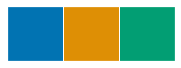

In [37]:
# Label colors in all plots:
sns.palplot(sns.color_palette("colorblind", 3))

In [38]:
# Prepare a functions that will help us compare Cinderella teams vs. Ordinary teams:

def cinderella_vs_ordinary(df, games, season, metric_name):
    '''A function to print comparison of Cinderella team metric
       vs. Ordinary team median value of the same metric'''
    
    df_cinderella = df[df.Cinderella == 1.0]
    df_ordinary = df[df.LABEL == 'Ordinary']
    
    total_cinderella_games = len(df_cinderella)
    total_ordinary_games = len(df_ordinary)
    
    cinderella_mean = round(df_cinderella[metric_name].mean(), 2)
    ordinary_mean = round(df_ordinary[metric_name].mean(), 2)
    
    cinderella_median = round(df_cinderella[metric_name].median(), 2)
    ordinary_median = round(df_ordinary[metric_name].median(), 2)
    
    
    ### MORE THAN ORDINARY MEDIAN

    total_larger = len(df_cinderella[df_cinderella[metric_name] > 
                                               ordinary_median])
    total_larger_ordinary = len(df_ordinary[df_ordinary[metric_name] > 
                                               ordinary_median])
    
    share = total_larger/total_cinderella_games
    share_ordinary = total_larger_ordinary/total_ordinary_games
    
    def print_share_message(s='more'):
        '''Input string: "more" or "less"'''
        print("\nIn {} of games {} in {}, Cinderella teams had {} than {} {} "
              "(mean: {}, median: {}) vs. {} of games "
              "for the Ordinary teams (mean: {}, median: {}).".format(share_str, games, season, s, 
                                                                      ordinary_median, metric_name,
                                                                      cinderella_mean, cinderella_median,
                                                                      share_ordinary_str, ordinary_mean, ordinary_median))
    
    if share > 0.51:
        share_str = '{:.0%}'.format(share)
        share_ordinary_str = '{:.0%}'.format(share_ordinary)
        
        print_share_message("more")
        
        
    ### LESS THAN ORDINARY MEDIAN
    
    total_less = len(df_cinderella[df_cinderella[metric_name] < 
                                               ordinary_median])
    total_less_ordinary = len(df_ordinary[df_ordinary[metric_name] < 
                                               ordinary_median])
    
    share = total_less/total_cinderella_games
    share_ordinary = total_less_ordinary/total_ordinary_games
    
    if share > 0.52:
        share_str = '{:.0%}'.format(share)
        share_ordinary_str = '{:.0%}'.format(share_ordinary)

        print_share_message("less")

### Do Cinderellas outscore the opponent by a wide margin?

Plot scoring margin distribution vs. winner team category:

1985-2019
File nr. 4


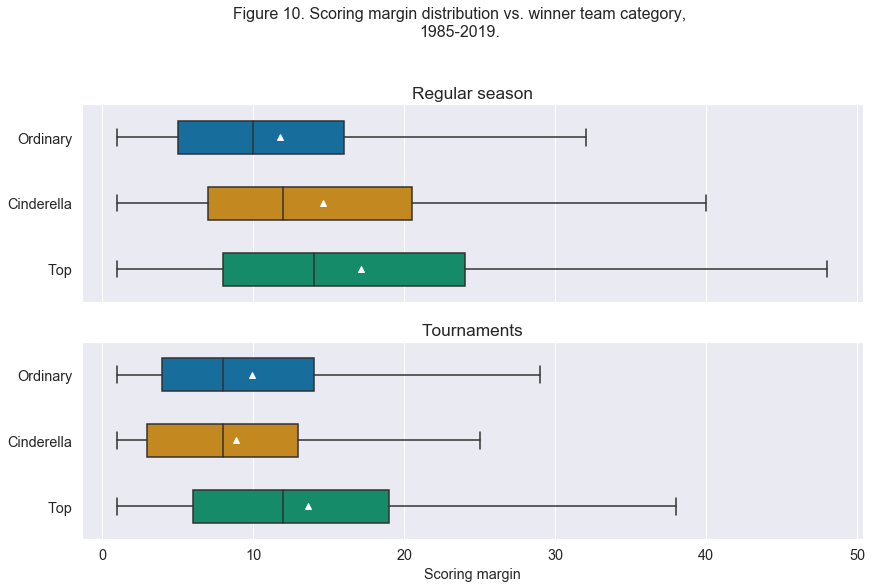

Descriptive statistics for file nr. 4:

Regular season
               count       mean        std  min  25%   50%   75%   max
LABEL                                                                 
Cinderella    1591.0  14.621622  10.564930  1.0  7.0  12.0  20.5  68.0
Ordinary    142368.0  11.758942   9.090133  1.0  5.0  10.0  16.0  91.0
Top           8473.0  17.136551  12.276976  1.0  8.0  14.0  24.0  84.0

Tournaments
             count       mean       std  min  25%   50%   75%   max
LABEL                                                              
Cinderella   176.0   8.886364  6.735716  1.0  3.0   8.0  13.0  34.0
Ordinary     897.0   9.911929  7.618121  1.0  4.0   8.0  14.0  58.0
Top         1051.0  13.660324  9.650943  1.0  6.0  12.0  19.0  56.0

In 58% of games won in regular season, Cinderella teams had more than 10.0 Scoring margin (mean: 14.62, median: 12.0) vs. 47% of games for the Ordinary teams (mean: 11.76, median: 10.0).


In [39]:
# Define mean "triangle" marker for boxplots:
meanprops={"markerfacecolor":"white", "markeredgecolor":"white"} 

df = labeled_MRegularSeasonCompactResults
print(f'{df.Season.min()}-{df.Season.max()}')

fig, ax = plt.subplots(2,1, figsize = (14, 8), sharex=True)

sns.boxplot(x='Scoring margin', y='LABEL', data=labeled_MRegularSeasonCompactResults, showmeans=True, ax=ax[0],
                order=order,
                orient='h',
                meanprops=meanprops, showfliers = False, width=0.5)

sns.boxplot(x='Scoring margin', y='LABEL', data=labeled_MNCAATourneyCompactResults, showmeans=True, ax=ax[1],
                order=order,
                orient='h',
                meanprops=meanprops, showfliers = False, width=0.5)

ax[0].set_title('Regular season')
ax[0].set_xlabel("")
ax[0].set_ylabel("")

ax[1].set_title('Tournaments')
ax[1].set_ylabel("")

plt.suptitle("Figure 10. Scoring margin distribution vs. winner team category,\n1985-2019.", y = 1.05)

save_plot()
plt.show()


print("Descriptive statistics for file nr. {}:".format(str(file_nr-1)))
print('\nRegular season')
print(labeled_MRegularSeasonCompactResults.groupby(['LABEL'])["Scoring margin"].describe())

print('\nTournaments')
print(labeled_MNCAATourneyCompactResults.groupby(['LABEL'])["Scoring margin"].describe())

cinderella_vs_ordinary(labeled_MRegularSeasonCompactResults, "won", "regular season", "Scoring margin")


___

### How does the scoring margin change from round to round?

In [40]:
# Labels for round ticks:
df = labeled_MNCAATourneyCompactResults.groupby(['NumRound', 'Round'], as_index=False).count()[['Round']]
list(df['Round'])

['Play-in',
 'Round 1',
 'Round 2',
 'Sweet 16',
 'Elite 8',
 'Final 4',
 'National Final']

File nr. 5


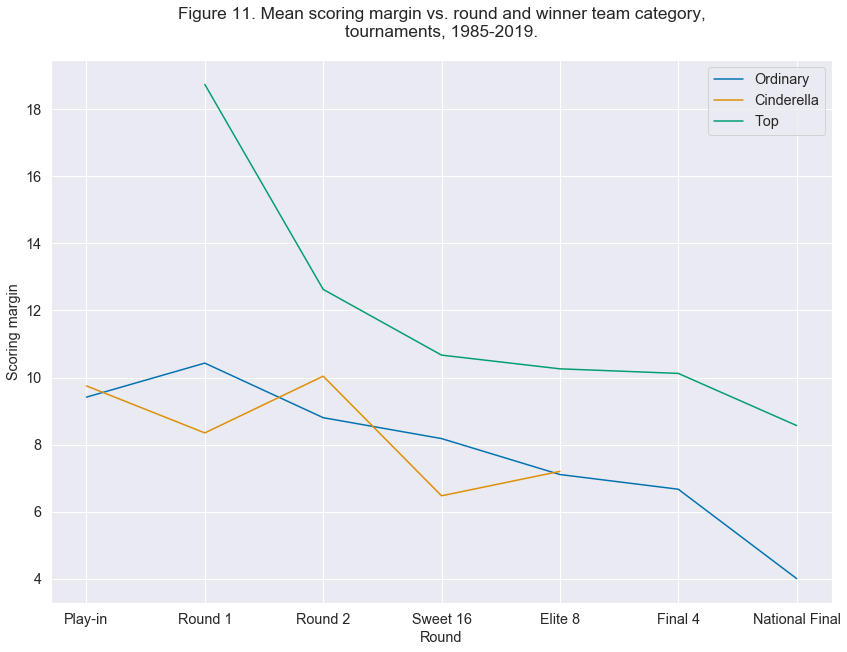

Descriptive statistics for file nr. 5:


count       mean        std  min    25%   50%   75%   max
NumRound LABEL                                                                
0        Cinderella    4.0   9.750000   4.272002  4.0   7.75  11.0  13.0  13.0
         Ordinary     41.0   9.414634   6.499906  1.0   4.00   9.0  13.0  31.0
1        Cinderella   75.0   8.346667   6.323473  1.0   3.00   7.0  12.5  30.0
         Ordinary    654.0  10.429664   7.912448  1.0   4.00   9.0  15.0  58.0
         Top         327.0  18.746177  10.959481  1.0  11.00  16.0  26.0  56.0
2        Cinderella   75.0  10.040000   7.523728  1.0   3.00   8.0  15.5  34.0
         Ordinary    126.0   8.801587   7.461925  1.0   3.00   6.0  12.0  35.0
         Top         327.0  12.629969   8.376901  1.0   6.00  12.0  18.0  45.0
3        Cinderella   17.0   6.470588   4.731776  1.0   2.00   6.0   9.0  17.0
         Ordinary     45.0   8.177778   5.297036  1.0   4.00   7.0  10.0  22.0
         Top         202.0  10.668317   7.503491  1.0   5.00  10.0  15.0  39.0
4        Cinderella    5.0   7.200000   5.932959  2.0   2.00   6.0  10.0  16.0
         Ordinary     19.0   7.105263   4.026230  1.0   4.00   6.0  11.0  15.0
         Top         108.0  10.259259   7.736756  1.0   4.00   8.0  14.0  37.0
5        Ordinary      9.0   6.666667   3.674235  1.0   4.00   7.0   9.0  12.0
         Top          57.0  10.122807   7.894551  1.0   4.00   9.0  14.0  44.0
6        Ordinary      3.0   4.000000   2.000000  2.0   3.00   4.0   5.0   6.0
         Top          30.0   8.566667   6.430977  1.0   4.25   7.0  11.5  30.0

In [41]:
g = sns.lineplot(x="NumRound", y="Scoring margin", hue="LABEL", data=labeled_MNCAATourneyCompactResults,
                 hue_order=order, ci=None)

plt.title("Figure 11. Mean scoring margin vs. round and winner team category,\ntournaments, 1985-2019.\n")

ax = plt.gca()
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles=handles[1:], labels=labels[1:])

plt.xlabel("Round")

g.set_xticklabels([0] + list(df['Round']))

save_plot()
plt.show()

print("Descriptive statistics for file nr. {}:".format(str(file_nr-1)))
labeled_MNCAATourneyCompactResults.groupby(['NumRound','LABEL'])["Scoring margin"].describe()

---
In order to reward better teams, first-round matchups are determined by pitting the top team in the region against the bottom team (No. 1 vs. No. 16). Then the next highest vs. the next lowest (No. 2 vs. No. 15), and so on. In theory, this means that **the 1 seeds have the easiest opening matchup to win in the bracket** [[23]](#References).

### How many teams of each category do we have per each seed no. and round?

File nr. 6


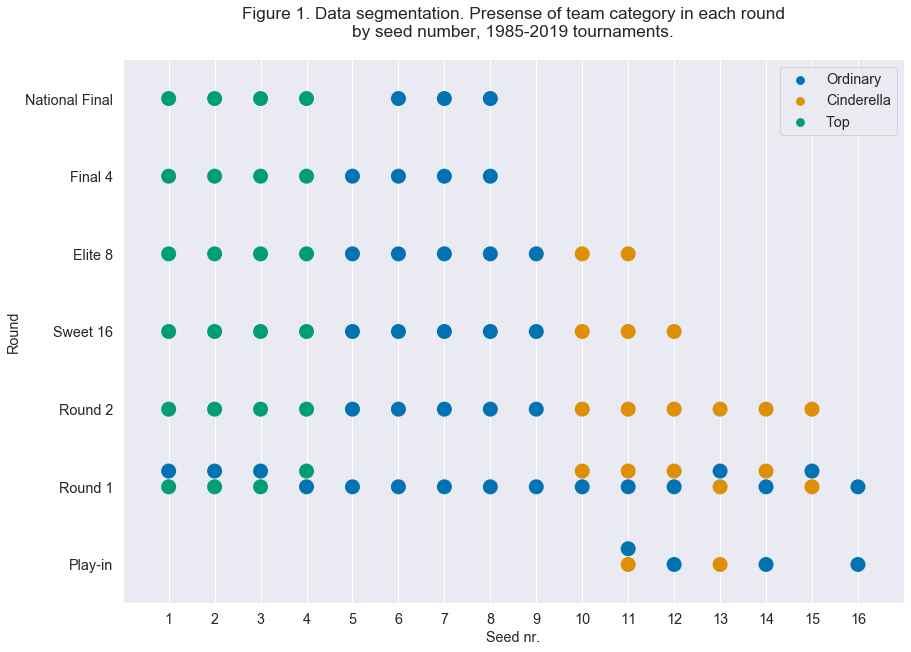

In [42]:
df = labeled_MNCAATourneyCompactResults[['SeedNo', 'Round', 'NumRound', 'WTeamID',
                                         'LABEL']].groupby(['SeedNo', 'Round', 'NumRound',
                                                            'LABEL'], as_index=False).count()

df = df.sort_values(by='NumRound', ascending=False) # 6, 5, 4...

sns.swarmplot("SeedNo", "Round", hue="LABEL", hue_order=order, data=df, size=15, palette="colorblind")

plt.xlim(0,17)
plt.xticks(np.arange(1, 17, step=1))

plt.xlabel("Seed nr.")

plt.legend(title=None)

plt.title("Figure 1. Data segmentation. Presense of team category in each round\nby seed number, 1985-2019 tournaments.\n")

save_plot()
sns.despine()

In [43]:
# Check font family (to use in fig.update_layout):
plt.rcParams['font.family']

['sans-serif']

In [44]:
# Count how many times this label won (per season):
df = labeled_MNCAATourneyCompactResults[['SeedNo', 'Round', 'NumRound', 'WTeamID',
                                         'LABEL']].groupby(['SeedNo', 'Round', 'NumRound',
                                                            'LABEL'], as_index=False).count()

df = df.sort_values(by='NumRound') # 1, 2, 3...

# Prepare hover text:
hover_text = []
for index, row in df.iterrows():
    hover_text.append(('Seed no.: {SeedNo}<br>'+
                      'Team category: {LABEL}<br>'+
                      'Total games won: {WTeamID}').format(SeedNo=row['SeedNo'],
                                            LABEL=row['LABEL'],
                                            WTeamID=row['WTeamID']))

df['text'] = hover_text

# Create figure
fig = go.Figure()

i = 0
for label in order:
    plot_df = df[df.LABEL == label]
    size = plot_df['WTeamID']
    fig.add_trace(go.Scatter(
        x=plot_df['SeedNo'], y=plot_df['Round'],
        mode='markers',
        text=plot_df['text'],
        name=label,
        marker_size=plot_df['WTeamID'],
        marker=dict(
                size=size,
                sizemode='area',
                sizeref=0.18, # setting 'sizeref' to less than 1 increases marker sizes
                sizemin=2,
                line_width=3,
                line_color=sns.color_palette("colorblind").as_hex()[i]), # outline color
                marker_color='rgba(0, 0, 0, 0)' # inside color
        ))
    i+=1
    
# Move legend:
fig.update_layout(legend=dict(x=0.835, y=0.95, bgcolor='rgba(0, 0, 0, 0)'))


# Add titles:

fig.update_xaxes(title_text='Seed no.')
fig.update_yaxes(title_text='Round')

# Improve tick frequency:
fig.update_layout(xaxis = dict(tickmode = 'array', tickvals = list(range(1, 17))))

# Set size:
fig.update_layout(width=plotly_width, height=650)

# Set axis font:
fig.update_yaxes(tickfont=dict(size=14))

# Plot title:
fig.update_layout(
    title={
        'text': "Games won by team category and seed number,<br>1985-2019 tournaments. Interactive graph.",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font=dict(
        family='sans-serif',
        color="#000"))


fig.show(renderer="kaggle")

fig_2 = go.Figure(fig) # to show the same fig in the Results section


print("Total games won per round:")
df.groupby(['NumRound','LABEL'])['WTeamID'].sum()

Total games won per round:


NumRound  LABEL     
0         Cinderella      4
          Ordinary       41
1         Cinderella     75
          Ordinary      654
          Top           327
2         Cinderella     75
          Ordinary      126
          Top           327
3         Cinderella     17
          Ordinary       45
          Top           202
4         Cinderella      5
          Ordinary       19
          Top           108
5         Ordinary        9
          Top            57
6         Ordinary        3
          Top            30
Name: WTeamID, dtype: int64

### How often have Cinderellas won in overtime?

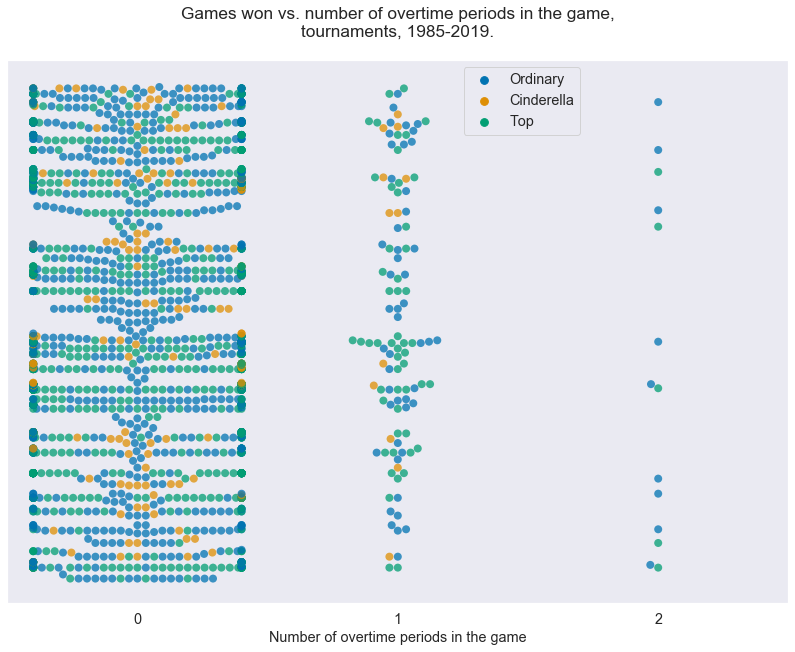

NumOT  LABEL     
0      Cinderella    164
       Ordinary      840
       Top           993
1      Cinderella     12
       Ordinary       48
       Top            53
2      Ordinary        9
       Top             5
Name: WTeamID, dtype: int64

In [45]:
sns.swarmplot(x="NumOT", y='WTeamID', hue="LABEL", hue_order=order,
            data=labeled_MNCAATourneyCompactResults,
            alpha=0.75,
            s=8)

plt.legend(title=None, bbox_to_anchor=(0.575, 1), loc=2)

plt.xlabel("Number of overtime periods in the game")

ax = plt.gca()
ax.get_yaxis().set_visible(False)

plt.title("Games won vs. number of overtime periods in the game,\ntournaments, 1985-2019.\n")

plt.show()

labeled_MNCAATourneyCompactResults.groupby(['NumOT', 'LABEL'])['WTeamID'].count()

*Note.* We decided to not include this figure to the [Results](#III.-Results) section, because we found it not especially insightful in terms of "Cinderellaness".

## 2.2. Geography, 2010-2020

**Data Section 3 file: Cities.csv** - this file provides a master list of cities that have been locations for games played [[1]](#References).

In [46]:
# Locations for games played
Cities = None
Cities = load_file(Cities, "Cities")

File: Cities
Num rows: 453
NaN values: 0
Duplicated rows: 0
     CityID        City State
0      4001     Abilene    TX
1      4002       Akron    OH
2      4003      Albany    NY
451    4474    Victoria    BC
452    4475  Wilmington    DE


In [47]:
Cities.State.value_counts().nunique() # how many unique states do we have?

19

**Data Section 3 file: MGameCities.csv** - this file identifies all games, starting with the 2010 season, along with the city that the game was played in. Games from the regular season, the NCAA® tourney, and other post-season tournaments, are all listed together [[1]](#References). 

In [48]:
MGameCities = None
MGameCities = load_file(MGameCities, "MGameCities")


File: MGameCities
Num rows: 60166
NaN values: 0
Duplicated rows: 0
       Season  DayNum  WTeamID  LTeamID   CRType  CityID
0        2010       7     1143     1293  Regular    4027
1        2010       7     1314     1198  Regular    4061
2        2010       7     1326     1108  Regular    4080
60164    2020     128     1412     1427  Regular    4414
60165    2020     128     1450     1160  Regular    4188


Merge both geography data files together:

In [49]:
new_MGameCities = pd.merge(MGameCities, Cities, on=['CityID'])
assert len(new_MGameCities) == len(MGameCities), "Wrong item count."

new_MGameCities

,Season,DayNum,WTeamID,LTeamID,CRType,CityID,City,State
0,2010,7,1143,1293,Regular,4027,Berkeley,CA
1,2010,9,1143,1178,Regular,4027,Berkeley,CA
2,2010,22,1143,1239,Regular,4027,Berkeley,CA
3,2010,27,1143,1343,Regular,4027,Berkeley,CA
4,2010,33,1143,1235,Regular,4027,Berkeley,CA
...,...,...,...,...,...,...,...,...
60161,2020,89,1467,1254,Regular,4462,North Andover,MA
60162,2020,103,1467,1447,Regular,4462,North Andover,MA
60163,2020,109,1467,1357,Regular,4462,North Andover,MA
60164,2020,115,1467,1148,Regular,4462,North Andover,MA


Load the file with each city geo location [[24]](#References):

In [50]:
# Load the file with each city geo location:

geo_file = "/kaggle/input/ncaageocities/geo_Cities.csv"

if sys.executable != '/opt/conda/bin/python':
    # remove the forward slash if running this notebook locally:
    geo_file = geo_file[1:]    
    
geo_Cities = pd.read_csv(geo_file)
geo_Cities.sample(5)

,CityID,City,State,Latitude,Longitude
200,4201,Los Angeles,CA,34.053691,-118.242767
376,4385,Laie,HI,51.244588,7.147997
249,4250,Notre Dame,IN,41.704568,-86.238220
328,4330,St. Thomas,VI,14.480198,121.024709
63,4064,Charleston,SC,32.787601,-79.940273


Join our new dataframe with the geo data:

In [51]:
cols = ['CityID', 'City', 'State']
geo_MGameCities = new_MGameCities.join(geo_Cities.set_index(cols), on=cols)

assert len(new_MGameCities) == len(geo_MGameCities), "Wrong item count."

geo_MGameCities

,Season,DayNum,WTeamID,LTeamID,CRType,CityID,City,State,Latitude,Longitude
0,2010,7,1143,1293,Regular,4027,Berkeley,CA,44.366937,-80.727250
1,2010,9,1143,1178,Regular,4027,Berkeley,CA,44.366937,-80.727250
2,2010,22,1143,1239,Regular,4027,Berkeley,CA,44.366937,-80.727250
3,2010,27,1143,1343,Regular,4027,Berkeley,CA,44.366937,-80.727250
4,2010,33,1143,1235,Regular,4027,Berkeley,CA,44.366937,-80.727250
...,...,...,...,...,...,...,...,...,...,...
60161,2020,89,1467,1254,Regular,4462,North Andover,MA,42.683989,-71.112706
60162,2020,103,1467,1447,Regular,4462,North Andover,MA,42.683989,-71.112706
60163,2020,109,1467,1357,Regular,4462,North Andover,MA,42.683989,-71.112706
60164,2020,115,1467,1148,Regular,4462,North Andover,MA,42.683989,-71.112706


#### Connect regular game cities with regular season game-by-game results

In [52]:
geo_MRegularSeasonCompactResults = pd.merge(geo_MGameCities[geo_MGameCities['CRType'] == 'Regular'],
                                          MRegularSeasonCompactResults,
                                          how='inner',
                                          on=['Season', 'DayNum', 'WTeamID', 'LTeamID'],
                                          validate="one_to_one")

geo_MRegularSeasonCompactResults

,Season,DayNum,WTeamID,LTeamID,CRType,CityID,City,State,Latitude,Longitude,WScore,LScore,WLoc,NumOT,Scoring margin
0,2010,7,1143,1293,Regular,4027,Berkeley,CA,44.366937,-80.727250,75,70,H,0,5
1,2010,9,1143,1178,Regular,4027,Berkeley,CA,44.366937,-80.727250,95,61,H,0,34
2,2010,22,1143,1239,Regular,4027,Berkeley,CA,44.366937,-80.727250,79,47,H,0,32
3,2010,27,1143,1343,Regular,4027,Berkeley,CA,44.366937,-80.727250,81,60,H,0,21
4,2010,33,1143,1235,Regular,4027,Berkeley,CA,44.366937,-80.727250,82,63,H,0,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58753,2020,89,1467,1254,Regular,4462,North Andover,MA,42.683989,-71.112706,70,59,H,0,11
58754,2020,103,1467,1447,Regular,4462,North Andover,MA,42.683989,-71.112706,68,59,H,0,9
58755,2020,109,1467,1357,Regular,4462,North Andover,MA,42.683989,-71.112706,64,57,H,0,7
58756,2020,115,1467,1148,Regular,4462,North Andover,MA,42.683989,-71.112706,69,58,H,0,11


#### Figure out team home location

Game location should be "H":

In [53]:
# Group by 'WTeamID', mean:
team_homes = geo_MRegularSeasonCompactResults[geo_MRegularSeasonCompactResults["WLoc"] == "H"][['WTeamID',
                                                                                                'CityID']].groupby(['WTeamID'], as_index = False).mean()

Testing out that each team has one unique home city:

In [54]:
# Testing out that each team has one unique home city
np.array_equal(team_homes.CityID, team_homes.CityID.astype(int)) # output should be True

False

Check what went wrong in the above code:

In [55]:
# Checking what went wrong in the above code:

team_homes = geo_MRegularSeasonCompactResults[geo_MRegularSeasonCompactResults["WLoc"] == "H"][['WTeamID','CityID', 'Season']].groupby(['WTeamID','CityID'], as_index = False).mean()
team_homes[team_homes['WTeamID'].duplicated(keep=False)]

,WTeamID,CityID,Season
4,1105,4159,2019.714286
5,1105,4245,2013.725000
15,1116,4119,2014.746835
16,1116,4248,2020.000000
27,1130,4039,2020.000000
...,...,...,...
361,1437,4266,2016.580000
362,1437,4361,2013.746988
363,1437,4467,2020.000000
385,1460,4091,2014.584158


In [56]:
team_homes[team_homes['WTeamID'] == 1437]

,WTeamID,CityID,Season
361,1437,4266,2016.580000
362,1437,4361,2013.746988
363,1437,4467,2020.000000


The output shows that some teams have different home cities. Let's look at one specific example to further investigate this:

In [57]:
MTeams[MTeams.TeamID == 1437]

,TeamID,TeamName,FirstD1Season,LastD1Season
336,1437,Villanova,1985,2020


In [58]:
Cities[Cities.CityID.isin([4266, 4361, 4467])]

,CityID,City,State
265,4266,Philadelphia,PA
359,4361,Villanova,PA
444,4467,Bryn Mawr,PA


This example confirms that **sometimes one team has different home locations in the game-by-game data file**. These three cities (Philadelphia, Villanova, Bryn Mawr) are close to each other, so this is not an error but rather a data specific issue.

To avoid this kind of inconsistency, we will drop the duplicates. Note that we didn't investigate which of the cities is bigger or more significant for each team, here we only care about keeping one city per team.

In [59]:
# Keep the home city from the latest season:
team_homes = team_homes.drop_duplicates('WTeamID')

team_homes[team_homes['WTeamID'] == 1437] # should be only one row

,WTeamID,CityID,Season
361,1437,4266,2016.58


In [60]:
Cities[Cities.CityID == 4266]

,CityID,City,State
265,4266,Philadelphia,PA


Drop Season column, it makes no sense after applying mean. Also rename the columns:

In [61]:
team_homes = team_homes.drop('Season', 1)
team_homes = team_homes.rename(columns={"WTeamID": "TeamID",
                                        "CityID": "HomeCityID"}) # rename columns
team_homes

,TeamID,HomeCityID
0,1101,4001
1,1102,4356
2,1103,4002
3,1104,4353
4,1105,4159
...,...,...
389,1463,4236
390,1464,4373
391,1465,4294
392,1466,4444


Add the geo location data:

In [62]:
team_homes = pd.merge(team_homes, geo_Cities, left_on='HomeCityID', right_on='CityID', how='left')
team_homes = team_homes.drop('CityID', 1)
team_homes

,TeamID,HomeCityID,City,State,Latitude,Longitude
0,1101,4001,Abilene,TX,32.446450,-99.747591
1,1102,4356,USAF Academy,CO,38.774069,-104.301534
2,1103,4002,Akron,OH,41.083064,-81.518485
3,1104,4353,Tuscaloosa,AL,33.209561,-87.567526
4,1105,4159,Huntsville,AL,34.729847,-86.585901
...,...,...,...,...,...,...
351,1463,4236,New Haven,CT,41.308214,-72.925052
352,1464,4373,Youngstown,OH,41.103579,-80.652016
353,1465,4294,Riverside,CA,50.481292,-108.289225
354,1466,4444,Florence,AL,34.799810,-87.677251


**Count teams per each home town**

In [63]:
team_homes_cnt = team_homes.groupby(['HomeCityID', 'City', 'State', 'Latitude', 'Longitude'], as_index=False).count()
# Sort values for the bigger points to show above the small points:
team_homes_cnt = team_homes_cnt.sort_values(by='TeamID')
team_homes_cnt

,HomeCityID,City,State,Latitude,Longitude,TeamID
0,4001,Abilene,TX,32.446450,-99.747591,1
175,4212,Martin,TN,35.773008,-86.282008,1
176,4213,Memphis,TN,35.149022,-90.051629,1
177,4214,Miami,FL,25.774266,-80.193659,1
179,4216,Minneapolis,MN,44.977300,-93.265469,1
...,...,...,...,...,...,...
283,4363,Washington,DC,38.894985,-77.036571,4
29,4039,Boston,MA,42.360253,-71.058291,4
53,4071,Chicago,IL,41.875562,-87.624421,4
194,4233,Nashville,TN,36.162230,-86.774353,4


Just a test, team Michigan St should be [from East Lansing](https://www.ncaa.com/schools/michigan-st):

In [64]:
team_homes[team_homes['TeamID'] == 1277]

,TeamID,HomeCityID,City,State,Latitude,Longitude
170,1277,4103,East Lansing,MI,42.735542,-84.485247


In [65]:
team_homes_cnt.TeamID.value_counts()

1    256
2     32
4      6
3      2
6      1
Name: TeamID, dtype: int64

### Which city is the "capital" of men's college basketball?

In [66]:
# This module allows to avoid overlapping text on scatter plots:
# Credit: https://github.com/Phlya/adjustText (The MIT License)
!pip install adjustText

# Parse SVG paths into matplotlib Path objects for plotting:
# Credit: https://github.com/nvictus/svgpath2mpl (The 3-Clause BSD License)
!pip install svgpath2mpl matplotlib

2010-2020
File nr. 7


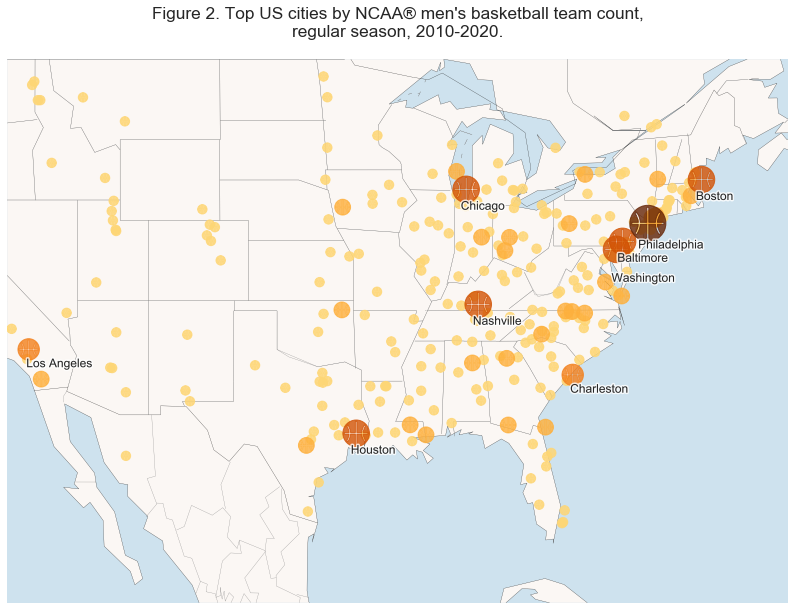

,HomeCityID,City,State,Latitude,Longitude,TeamID
38,4049,Buffalo,NY,42.886717,-78.878392,2
165,4201,Los Angeles,CA,34.053691,-118.242767,3
48,4064,Charleston,SC,32.787601,-79.940273,3
16,4022,Baltimore,MD,39.290882,-76.610759,4
128,4157,Houston,TX,29.758938,-95.367697,4
283,4363,Washington,DC,38.894985,-77.036571,4
29,4039,Boston,MA,42.360253,-71.058291,4
53,4071,Chicago,IL,41.875562,-87.624421,4
194,4233,Nashville,TN,36.162230,-86.774353,4
216,4266,Philadelphia,PA,39.952724,-75.163526,6


In [67]:
import os
os.environ['PROJ_LIB'] = 'C:\\Users\\Ivanna\\Anaconda3\\pkgs\\basemap-1.2.0-py37h4e5d7af_0\\Lib\\site-packages\\mpl_toolkits\\basemap\\data\\'


from mpl_toolkits.basemap import Basemap
from adjustText import adjust_text
from svgpath2mpl import parse_path
import matplotlib.patheffects as path_effects
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

df = geo_MRegularSeasonCompactResults
print(f'{df.Season.min()}-{df.Season.max()}')

# Create US map:
map = Basemap(llcrnrlon=-119,llcrnrlat=22,urcrnrlon=-64,urcrnrlat=49, fix_aspect=False)

map.drawmapboundary(fill_color='#cee2ee', linewidth=0)
map.fillcontinents(color='#fbf7f4')

map.drawcountries(linewidth=0.25)
map.drawcoastlines(linewidth=0.25)

map.drawstates(color='0.5', linewidth=0.25) # draw the American state border


# Create custom marker:
ball = parse_path("""M297,148.5C297,66.617,230.383,0,148.5,0S0,66.617,0,148.5S66.617,297,148.5,297S297,230.383,297,148.5z M211.044,156.5
h-54.877v124.252c-2,0.158-5.314,0.248-8,0.248c-2.687,0-5-0.09-8-0.248V156.5H85.956c-1.665,31.936-13.236,61.29-31.687,85.051
c-3.826-3.874-7.413-7.982-10.743-12.3c15.244-20.59,24.815-45.614,26.398-72.751H16.249c-0.159-2.648-0.249-5.314-0.249-8
s0.09-5.352,0.249-8h53.676c-1.582-27.137-11.154-52.162-26.397-72.751c3.329-4.318,6.917-8.427,10.742-12.3
C72.72,79.21,84.292,108.563,85.956,140.5h54.211V16.248c3-0.158,5.313-0.248,8-0.248c2.686,0,6,0.09,8,0.248V140.5h54.877
c1.664-31.937,13.236-61.29,31.687-85.051c3.825,3.873,7.413,7.981,10.742,12.3c-15.243,20.589-24.815,45.614-26.397,72.751h53.676
c0.159,2.648,0.249,5.314,0.249,8s-0.09,5.352-0.249,8h-53.676c1.583,27.137,11.154,52.161,26.398,72.751
c-3.33,4.317-6.917,8.426-10.743,12.3C224.28,217.79,212.709,188.436,211.044,156.5z""")

# Create a custom cmap based on a 'YlOrBr':
YlOrBr = cm.get_cmap('YlOrBr', 100)
newcmp = ListedColormap(YlOrBr(np.linspace(0.3, 1, 256)))

# Plot data on a map:
map.scatter(team_homes_cnt['Longitude'], # longitude goes first
            team_homes_cnt['Latitude'], # latitude goes second
            s=pow(team_homes_cnt['TeamID']*50, 1.5), # marker size
            c=team_homes_cnt['TeamID'], # marker color
            marker=ball,
            alpha=0.8,
            zorder=10,
            cmap=newcmp)


# Annotate biggest points:

top = team_homes_cnt[team_homes_cnt['TeamID'] >= 3]

top_texts = [plt.text(top['Longitude'][i]+0.5,
                  top['Latitude'][i]-0.5,
                  top['City'][i],
                  zorder=11) for i in top.index]

# Add white outline to text:
for text in top_texts:
    text.set_path_effects([path_effects.Stroke(linewidth=3, foreground='white', alpha=.8),
                       path_effects.Normal()])

# Fix overlapping text:
adjust_text(top_texts)

plt.title("Figure 2. Top US cities by NCAA® men's basketball team count,\nregular season, 2010-2020.\n")

save_plot()
plt.show()


team_homes_cnt[team_homes_cnt['TeamID'] > 1].tail(10)

Print out the team names for Philadelphia:

In [68]:
for index, row in team_homes[team_homes['City'] == "Philadelphia"].iterrows():
    team_id = team_homes[team_homes['City'] == "Philadelphia"]['TeamID'][index]
    print(MTeams.loc[MTeams['TeamID'] == team_id, 'TeamName'].values[0])

Drexel
La Salle
Penn
St Joseph's PA
Temple
Villanova


## 2.3. Team Box Scores, 2003-2019

**Data Section 2 file: MNCAATourneyDetailedResults.csv** - this file provides team-level box scores for many NCAA® tournaments, starting with the 2003 season [[1]](#References).

In [69]:
MNCAATourneyDetailedResults = None
MNCAATourneyDetailedResults = load_file(MNCAATourneyDetailedResults, 'MNCAATourneyDetailedResults')

File: MNCAATourneyDetailedResults
Num rows: 1115
NaN values: 0
Duplicated rows: 0
      Season  DayNum  WTeamID  WScore  LTeamID  LScore WLoc  NumOT  WFGM  \
0       2003     134     1421      92     1411      84    N      1    32   
1       2003     136     1112      80     1436      51    N      0    31   
2       2003     136     1113      84     1272      71    N      0    31   
1113    2019     152     1438      63     1120      62    N      0    25   
1114    2019     154     1438      85     1403      77    N      1    27   

      WFGA  ...  LFGA3  LFTM  LFTA  LOR  LDR  LAst  LTO  LStl  LBlk  LPF  
0       69  ...     31    14    31   17   28    16   15     5     0   22  
1       66  ...     16     7     7    8   26    12   17    10     3   15  
2       59  ...     28    14    21   20   22    11   12     2     5   18  
1113    51  ...     31    11    14    9   24     9    5     3     3   12  
1114    59  ...     30    13    15    9   23     9    8     6     3   18  

[5 rows x 

We will be using the below dictionary to look up the index of columns:

In [70]:
print({c: i for i, c in enumerate(MNCAATourneyDetailedResults.columns)})

{'Season': 0, 'DayNum': 1, 'WTeamID': 2, 'WScore': 3, 'LTeamID': 4, 'LScore': 5, 'WLoc': 6, 'NumOT': 7, 'WFGM': 8, 'WFGA': 9, 'WFGM3': 10, 'WFGA3': 11, 'WFTM': 12, 'WFTA': 13, 'WOR': 14, 'WDR': 15, 'WAst': 16, 'WTO': 17, 'WStl': 18, 'WBlk': 19, 'WPF': 20, 'LFGM': 21, 'LFGA': 22, 'LFGM3': 23, 'LFGA3': 24, 'LFTM': 25, 'LFTA': 26, 'LOR': 27, 'LDR': 28, 'LAst': 29, 'LTO': 30, 'LStl': 31, 'LBlk': 32, 'LPF': 33}


**Make each row in our dataframe about either a winning or a losing team stats**

In [71]:
# Columns about winning team:

winning = pd.concat([MNCAATourneyDetailedResults.iloc[:,:4], # game ID columns
                     MNCAATourneyDetailedResults.iloc[:,4:5], # LTeamID
                     MNCAATourneyDetailedResults.iloc[:,8:21], # WFGM, WFGA, WFGM3 ...
                     MNCAATourneyDetailedResults.iloc[:,27:29]], # opponent OR, DR
                    axis=1, sort=False)

winning['TeamID'] = winning['WTeamID']
winning['won'] = 1

winning # 'Season', 'DayNum', 'WTeamID', 'WScore', 'LTeamID'...

,Season,DayNum,WTeamID,WScore,LTeamID,WFGM,WFGA,WFGM3,WFGA3,WFTM,...,WDR,WAst,WTO,WStl,WBlk,WPF,LOR,LDR,TeamID,won
0,2003,134,1421,92,1411,32,69,11,29,17,...,30,17,12,5,3,22,17,28,1421,1
1,2003,136,1112,80,1436,31,66,7,23,11,...,36,22,16,10,7,8,8,26,1112,1
2,2003,136,1113,84,1272,31,59,6,14,16,...,27,18,9,7,4,19,20,22,1113,1
3,2003,136,1141,79,1166,29,53,3,7,18,...,20,15,18,13,1,19,14,17,1141,1
4,2003,136,1143,76,1301,27,64,7,20,15,...,20,17,13,8,2,14,10,26,1143,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1110,2019,146,1120,77,1246,26,65,7,23,18,...,25,8,9,10,7,21,11,30,1120,1
1111,2019,146,1277,68,1181,30,70,6,19,2,...,20,18,7,11,3,11,13,29,1277,1
1112,2019,152,1403,61,1277,22,51,9,23,8,...,27,8,7,4,4,18,8,28,1403,1
1113,2019,152,1438,63,1120,25,51,7,19,6,...,26,15,8,1,9,12,9,24,1438,1


In [72]:
# Columns about losing team:

losing = pd.concat([MNCAATourneyDetailedResults.iloc[:,:3],
                    MNCAATourneyDetailedResults.iloc[:,5:6], # LScore
                    MNCAATourneyDetailedResults.iloc[:,4:5], # LTeamID
                    MNCAATourneyDetailedResults.iloc[:,21:34],
                    MNCAATourneyDetailedResults.iloc[:,14:16]], # opponent OR, DR
                    axis=1, sort=False)
losing['TeamID'] = losing['LTeamID']
losing['won'] = 0

losing # 'Season', 'DayNum', 'WTeamID', 'LScore', 'LTeamID'...

,Season,DayNum,WTeamID,LScore,LTeamID,LFGM,LFGA,LFGM3,LFGA3,LFTM,...,LDR,LAst,LTO,LStl,LBlk,LPF,WOR,WDR,TeamID,won
0,2003,134,1421,84,1411,29,67,12,31,14,...,28,16,15,5,0,22,14,30,1411,0
1,2003,136,1112,51,1436,20,64,4,16,7,...,26,12,17,10,3,15,11,36,1436,0
2,2003,136,1113,71,1272,25,69,7,28,14,...,22,11,12,2,5,18,10,27,1272,0
3,2003,136,1141,73,1166,27,60,7,17,12,...,17,20,21,6,6,21,11,20,1166,0
4,2003,136,1143,74,1301,25,56,9,21,15,...,26,16,14,5,8,19,18,20,1301,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1110,2019,146,1120,71,1246,27,61,5,21,12,...,30,14,14,5,5,19,12,25,1246,0
1111,2019,146,1277,67,1181,26,57,7,21,8,...,29,14,17,4,9,9,11,20,1181,0
1112,2019,152,1403,51,1277,15,47,7,24,14,...,28,6,11,1,2,15,3,27,1277,0
1113,2019,152,1438,62,1120,21,55,9,31,11,...,24,9,5,3,3,12,5,26,1120,0


In [73]:
print(list(winning))

['Season', 'DayNum', 'WTeamID', 'WScore', 'LTeamID', 'WFGM', 'WFGA', 'WFGM3', 'WFGA3', 'WFTM', 'WFTA', 'WOR', 'WDR', 'WAst', 'WTO', 'WStl', 'WBlk', 'WPF', 'LOR', 'LDR', 'TeamID', 'won']


In [74]:
print(list(losing))

['Season', 'DayNum', 'WTeamID', 'LScore', 'LTeamID', 'LFGM', 'LFGA', 'LFGM3', 'LFGA3', 'LFTM', 'LFTA', 'LOR', 'LDR', 'LAst', 'LTO', 'LStl', 'LBlk', 'LPF', 'WOR', 'WDR', 'TeamID', 'won']


Resulting dataframe object will have a "double_" prefix, because each game is now represented twice - one row for a winning team and one row for a losing team:

In [75]:
# Remove "W" and "L" prefixes:

new_columns = ['Season', 'DayNum', 'WTeamID', 'Score', 'LTeamID', # changed only "Score" here
               'FGM', 'FGA', 'FGM3', 'FGA3', 'FTM', 'FTA', 'OR', 'DR', 'Ast', 'TO', 'Stl', 'Blk', 'PF', 
               'OppOR', 'OppDR', 'TeamID', 'won']

# Rename columns:
winning.columns = new_columns
losing.columns = new_columns

# Concatenate:
frames = [winning, losing]
double_MNCAATourneyDetailedResults = pd.concat(frames)

assert(len(double_MNCAATourneyDetailedResults) == (len(winning) + len(losing)))

double_MNCAATourneyDetailedResults 

,Season,DayNum,WTeamID,Score,LTeamID,FGM,FGA,FGM3,FGA3,FTM,...,DR,Ast,TO,Stl,Blk,PF,OppOR,OppDR,TeamID,won
0,2003,134,1421,92,1411,32,69,11,29,17,...,30,17,12,5,3,22,17,28,1421,1
1,2003,136,1112,80,1436,31,66,7,23,11,...,36,22,16,10,7,8,8,26,1112,1
2,2003,136,1113,84,1272,31,59,6,14,16,...,27,18,9,7,4,19,20,22,1113,1
3,2003,136,1141,79,1166,29,53,3,7,18,...,20,15,18,13,1,19,14,17,1141,1
4,2003,136,1143,76,1301,27,64,7,20,15,...,20,17,13,8,2,14,10,26,1143,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1110,2019,146,1120,71,1246,27,61,5,21,12,...,30,14,14,5,5,19,12,25,1246,0
1111,2019,146,1277,67,1181,26,57,7,21,8,...,29,14,17,4,9,9,11,20,1181,0
1112,2019,152,1403,51,1277,15,47,7,24,14,...,28,6,11,1,2,15,3,27,1277,0
1113,2019,152,1438,62,1120,21,55,9,31,11,...,24,9,5,3,3,12,5,26,1120,0


**Calculate Rebound Margin**

Rebound Margin = RPG - OPP RPG [[15]](#References)

If a team won, opponent is LTeamID, otherwise opponent is WTeamID. Following this logic we already created two columns with opponent rebounds - "OppOR" and "OppDR".

Total rebounds per game = offensive rebounds + defensive rebounds:

In [76]:
double_MNCAATourneyDetailedResults['Rebound Margin'] = (double_MNCAATourneyDetailedResults['OR'] +
                                                        double_MNCAATourneyDetailedResults['DR']) - \
                                                       (double_MNCAATourneyDetailedResults['OppOR'] +
                                                        double_MNCAATourneyDetailedResults['OppDR'])
    
double_MNCAATourneyDetailedResults.sample(3)

,Season,DayNum,WTeamID,Score,LTeamID,FGM,FGA,FGM3,FGA3,FTM,...,Ast,TO,Stl,Blk,PF,OppOR,OppDR,TeamID,won,Rebound Margin
12,2003,136,1323,70,1454,23,54,3,13,21,...,7,20,6,6,19,14,23,1323,1,7
130,2005,136,1130,85,1335,30,52,8,12,17,...,24,19,8,6,14,16,18,1130,1,7
688,2013,138,1393,60,1143,22,56,4,21,12,...,14,17,6,2,24,14,23,1143,0,-3


Add categorical round information:

In [77]:
double_MNCAATourneyDetailedResults['Round'] = double_MNCAATourneyDetailedResults['DayNum'] # copy DayNum column
double_MNCAATourneyDetailedResults['Round'].replace({134: "Play-in",
                                             135: "Play-in",
                                             136: "Round 1",
                                             137: "Round 1",
                                             138: "Round 2",
                                             139: "Round 2",
                                             143: "Sweet 16",
                                             144: "Sweet 16",
                                             145: "Elite 8",
                                             146: "Elite 8",
                                             152: "Final 4",
                                             154: "National Final"}, inplace=True) # replace values with round names

# Also add numerical round values for easier sorting:
double_MNCAATourneyDetailedResults['NumRound'] = double_MNCAATourneyDetailedResults['DayNum'] # copy DayNum column
double_MNCAATourneyDetailedResults['NumRound'].replace({134: 0,
                                             135: 0,
                                             136: 1,
                                             137: 1,
                                             138: 2,
                                             139: 2,
                                             143: 3,
                                             144: 3,
                                             145: 4,
                                             146: 4,
                                             152: 5,
                                             154: 6}, inplace=True) # replace values with round names

double_MNCAATourneyDetailedResults['Round'].value_counts()

Round 1           1088
Round 2            544
Sweet 16           272
Elite 8            136
Play-in             88
Final 4             68
National Final      34
Name: Round, dtype: int64

#### Calculate two-point field goals attempted
FGA2 = FGA - FGA3

In [78]:
double_MNCAATourneyDetailedResults['FGA2'] = double_MNCAATourneyDetailedResults['FGA'] - double_MNCAATourneyDetailedResults['FGA3']
double_MNCAATourneyDetailedResults.sample(3)

,Season,DayNum,WTeamID,Score,LTeamID,FGM,FGA,FGM3,FGA3,FTM,...,Blk,PF,OppOR,OppDR,TeamID,won,Rebound Margin,Round,NumRound,FGA2
563,2011,139,1433,76,1345,30,67,8,25,8,...,6,15,9,26,1345,0,-2,Round 2,2,42
920,2017,136,1196,80,1190,26,54,7,22,21,...,4,12,13,19,1196,1,6,Round 1,1,32
1059,2019,136,1261,74,1463,27,72,8,37,12,...,5,16,12,34,1463,0,-8,Round 1,1,35


#### Calculate two-point field goals made
FGM2 = FGM - FGM3

In [79]:
double_MNCAATourneyDetailedResults['FGM2'] = double_MNCAATourneyDetailedResults['FGM'] - double_MNCAATourneyDetailedResults['FGM3']
double_MNCAATourneyDetailedResults.sample(3)

,Season,DayNum,WTeamID,Score,LTeamID,FGM,FGA,FGM3,FGA3,FTM,...,PF,OppOR,OppDR,TeamID,won,Rebound Margin,Round,NumRound,FGA2,FGM2
77,2004,136,1393,75,1140,26,55,10,26,13,...,23,5,18,1140,0,13,Round 1,1,29,16
845,2015,152,1458,64,1246,26,54,3,5,9,...,20,12,22,1246,0,-12,Final 4,5,49,23
264,2007,136,1314,86,1184,37,57,6,13,6,...,8,6,10,1314,1,22,Round 1,1,44,31


#### Add the Cinderella and Top labels defined earlier

In [80]:
# Filter by season - we don't want to include seasons without any cinderella teams:
labeled_double_MNCAATourneyDetailedResults = double_MNCAATourneyDetailedResults[double_MNCAATourneyDetailedResults['Season'].isin(season_team_cinderellas['Season'].tolist())]

cinderellas = cinderellas.rename(columns={"WTeamID": "TeamID"}) # rename columns
top_seeded = top_seeded.rename(columns={"WTeamID": "TeamID"}) # rename columns

cols = ['Season', 'TeamID']
labeled_double_MNCAATourneyDetailedResults = labeled_double_MNCAATourneyDetailedResults.join(cinderellas.set_index(cols), on=cols)
labeled_double_MNCAATourneyDetailedResults = labeled_double_MNCAATourneyDetailedResults.join(top_seeded.set_index(cols), on=cols)

labeled_double_MNCAATourneyDetailedResults

,Season,DayNum,WTeamID,Score,LTeamID,FGM,FGA,FGM3,FGA3,FTM,...,OppDR,TeamID,won,Rebound Margin,Round,NumRound,FGA2,FGM2,Cinderella,Top
0,2003,134,1421,92,1411,32,69,11,29,17,...,28,1421,1,-1,Play-in,0,40,21,NaN,NaN
1,2003,136,1112,80,1436,31,66,7,23,11,...,26,1112,1,13,Round 1,1,43,24,NaN,1.0
2,2003,136,1113,84,1272,31,59,6,14,16,...,22,1113,1,-5,Round 1,1,45,25,NaN,NaN
3,2003,136,1141,79,1166,29,53,3,7,18,...,17,1141,1,0,Round 1,1,46,26,NaN,NaN
4,2003,136,1143,76,1301,27,64,7,20,15,...,26,1143,1,2,Round 1,1,44,20,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1110,2019,146,1120,71,1246,27,61,5,21,12,...,25,1246,0,4,Elite 8,4,40,22,NaN,1.0
1111,2019,146,1277,67,1181,26,57,7,21,8,...,20,1181,0,11,Elite 8,4,36,19,NaN,1.0
1112,2019,152,1403,51,1277,15,47,7,24,14,...,27,1277,0,6,Final 4,5,23,8,NaN,1.0
1113,2019,152,1438,62,1120,21,55,9,31,11,...,26,1120,0,2,Final 4,5,24,12,NaN,NaN


How many Cinderella team games do we have in this data:

In [81]:
labeled_double_MNCAATourneyDetailedResults.Cinderella.value_counts()

1.0    117
Name: Cinderella, dtype: int64

Continue adding labels:

In [82]:
# Create a categorical LABEL column:
label = labeled_double_MNCAATourneyDetailedResults[['Cinderella', 'Top']]
label = pd.DataFrame(label.idxmax(1))
labeled_double_MNCAATourneyDetailedResults['LABEL'] = label

# Fill in the missing values:
labeled_double_MNCAATourneyDetailedResults['LABEL'] = labeled_double_MNCAATourneyDetailedResults['LABEL'].fillna("Ordinary")

# Fill in the missing values:
labeled_double_MNCAATourneyDetailedResults['Cinderella'] = labeled_double_MNCAATourneyDetailedResults['Cinderella'].fillna(0) # not a cinderella
labeled_double_MNCAATourneyDetailedResults['Top'] = labeled_double_MNCAATourneyDetailedResults['Top'].fillna(0) # not a top

labeled_double_MNCAATourneyDetailedResults

,Season,DayNum,WTeamID,Score,LTeamID,FGM,FGA,FGM3,FGA3,FTM,...,TeamID,won,Rebound Margin,Round,NumRound,FGA2,FGM2,Cinderella,Top,LABEL
0,2003,134,1421,92,1411,32,69,11,29,17,...,1421,1,-1,Play-in,0,40,21,0.0,0.0,Ordinary
1,2003,136,1112,80,1436,31,66,7,23,11,...,1112,1,13,Round 1,1,43,24,0.0,1.0,Top
2,2003,136,1113,84,1272,31,59,6,14,16,...,1113,1,-5,Round 1,1,45,25,0.0,0.0,Ordinary
3,2003,136,1141,79,1166,29,53,3,7,18,...,1141,1,0,Round 1,1,46,26,0.0,0.0,Ordinary
4,2003,136,1143,76,1301,27,64,7,20,15,...,1143,1,2,Round 1,1,44,20,0.0,0.0,Ordinary
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1110,2019,146,1120,71,1246,27,61,5,21,12,...,1246,0,4,Elite 8,4,40,22,0.0,1.0,Top
1111,2019,146,1277,67,1181,26,57,7,21,8,...,1181,0,11,Elite 8,4,36,19,0.0,1.0,Top
1112,2019,152,1403,51,1277,15,47,7,24,14,...,1277,0,6,Final 4,5,23,8,0.0,1.0,Top
1113,2019,152,1438,62,1120,21,55,9,31,11,...,1120,0,2,Final 4,5,24,12,0.0,0.0,Ordinary


In [83]:
labeled_double_MNCAATourneyDetailedResults.Cinderella.value_counts()

0.0    1985
1.0     117
Name: Cinderella, dtype: int64

**Data Section 2 file: MRegularSeasonDetailedResults.csv** - this file provides team-level box scores for many regular seasons of historical data, starting with the 2003 season [[1]](#References).

In [84]:
MRegularSeasonDetailedResults = None
MRegularSeasonDetailedResults = load_file(MRegularSeasonDetailedResults, 'MRegularSeasonDetailedResults')

File: MRegularSeasonDetailedResults
Num rows: 92832
NaN values: 0
Duplicated rows: 0
       Season  DayNum  WTeamID  WScore  LTeamID  LScore WLoc  NumOT  WFGM  \
0        2003      10     1104      68     1328      62    N      0    27   
1        2003      10     1272      70     1393      63    N      0    26   
2        2003      11     1266      73     1437      61    N      0    24   
92830    2020     128     1412      74     1427      69    N      0    26   
92831    2020     128     1450      82     1160      68    N      0    27   

       WFGA  ...  LFGA3  LFTM  LFTA  LOR  LDR  LAst  LTO  LStl  LBlk  LPF  
0        58  ...     10    16    22   10   22     8   18     9     2   20  
1        62  ...     24     9    20   20   25     7   12     8     6   16  
2        58  ...     26    14    23   31   22     9   12     2     5   23  
92830    53  ...     27     7     7   12   22    11   13     4     2   18  
92831    55  ...     21    22    32   10   24     4   11     4     4   1

**Repeat all the same steps for the regular season detailed results**

In [85]:
# Columns about winning team:

winning = pd.concat([MRegularSeasonDetailedResults.iloc[:,:4],
                     MRegularSeasonDetailedResults.iloc[:,4:5], # LTeamID
                     MRegularSeasonDetailedResults.iloc[:,8:21],
                     MRegularSeasonDetailedResults.iloc[:,27:29]], # opponent OR, DR
                    axis=1, sort=False)

winning['TeamID'] = winning['WTeamID']
winning['won'] = 1

# Columns about losing team:

losing = pd.concat([MRegularSeasonDetailedResults.iloc[:,:3],
                    MRegularSeasonDetailedResults.iloc[:,5:6], # LScore
                    MRegularSeasonDetailedResults.iloc[:,4:5], # LTeamID
                    MRegularSeasonDetailedResults.iloc[:,21:34],
                    MRegularSeasonDetailedResults.iloc[:,14:16]], # opponent OR, DR
                    axis=1, sort=False)

losing['TeamID'] = losing['LTeamID']
losing['won'] = 0

# Rename columns:
winning.columns = new_columns
losing.columns = new_columns

# Concatenate:
frames = [winning, losing]
double_MRegularSeasonDetailedResults = pd.concat(frames)

print(len(double_MRegularSeasonDetailedResults))

double_MRegularSeasonDetailedResults['Round'] = "Regular Season"

double_MRegularSeasonDetailedResults['FGA2'] = double_MRegularSeasonDetailedResults['FGA'] - double_MRegularSeasonDetailedResults['FGA3']
double_MRegularSeasonDetailedResults['FGM2'] = double_MRegularSeasonDetailedResults['FGM'] - double_MRegularSeasonDetailedResults['FGM3']

double_MRegularSeasonDetailedResults

# Filter by season - we don't want to include seasons without any cinderella teams:

labeled_double_MRegularSeasonDetailedResults = double_MRegularSeasonDetailedResults[double_MRegularSeasonDetailedResults['Season'].isin(season_team_cinderellas['Season'].tolist())]

cols = ['Season', 'TeamID']
labeled_double_MRegularSeasonDetailedResults = labeled_double_MRegularSeasonDetailedResults.join(cinderellas.set_index(cols), on=cols)
labeled_double_MRegularSeasonDetailedResults = labeled_double_MRegularSeasonDetailedResults.join(top_seeded.set_index(cols), on=cols)

# Create a categorical LABEL column:
label = labeled_double_MRegularSeasonDetailedResults[['Cinderella', 'Top']]
label = pd.DataFrame(label.idxmax(1))
labeled_double_MRegularSeasonDetailedResults['LABEL'] = label

# Fill in the missing values:
labeled_double_MRegularSeasonDetailedResults['LABEL'] = labeled_double_MRegularSeasonDetailedResults['LABEL'].fillna("Ordinary")

# Fill in the missing values:
labeled_double_MRegularSeasonDetailedResults['Cinderella'] = labeled_double_MRegularSeasonDetailedResults['Cinderella'].fillna(0) # not a cinderella
labeled_double_MRegularSeasonDetailedResults['Top'] = labeled_double_MRegularSeasonDetailedResults['Top'].fillna(0) # not a top

# Calculate Rebound Margin:
labeled_double_MRegularSeasonDetailedResults['Rebound Margin'] = (labeled_double_MRegularSeasonDetailedResults['OR'] +
                                                                  labeled_double_MRegularSeasonDetailedResults['DR']) - \
                                                                 (labeled_double_MRegularSeasonDetailedResults['OppOR'] +
                                                                  labeled_double_MRegularSeasonDetailedResults['OppDR'])

labeled_double_MRegularSeasonDetailedResults

185664


,Season,DayNum,WTeamID,Score,LTeamID,FGM,FGA,FGM3,FGA3,FTM,...,OppDR,TeamID,won,Round,FGA2,FGM2,Cinderella,Top,LABEL,Rebound Margin
0,2003,10,1104,68,1328,27,58,3,14,11,...,22,1104,1,Regular Season,44,24,0.0,0.0,Ordinary,6
1,2003,10,1272,70,1393,26,62,8,20,10,...,25,1272,1,Regular Season,42,18,0.0,0.0,Ordinary,-2
2,2003,11,1266,73,1437,24,58,8,18,17,...,22,1266,1,Regular Season,40,16,0.0,1.0,Top,-10
3,2003,11,1296,56,1457,18,38,3,9,17,...,20,1296,1,Regular Season,29,15,0.0,0.0,Ordinary,-12
4,2003,11,1400,77,1208,30,61,6,14,11,...,15,1400,1,Regular Season,47,24,0.0,1.0,Top,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87499,2019,132,1153,57,1222,19,62,8,33,11,...,27,1222,0,Regular Season,29,11,0.0,1.0,Top,-6
87500,2019,132,1209,64,1426,23,64,7,33,11,...,31,1426,0,Regular Season,31,16,0.0,0.0,Ordinary,5
87501,2019,132,1277,60,1276,21,51,8,25,10,...,27,1276,0,Regular Season,26,13,0.0,1.0,Top,-9
87502,2019,132,1387,53,1382,19,56,7,19,8,...,25,1382,0,Regular Season,37,12,0.0,0.0,Ordinary,3


Check the resulting labels:

In [86]:
labeled_double_MRegularSeasonDetailedResults.LABEL.value_counts()

Ordinary      158543
Top             5295
Cinderella      1084
Name: LABEL, dtype: int64

**Copy stats of winning teams to a separate dataframe** (for both regular season and tournaments)

In [87]:
### Regular season ###

reg_winning_stats = labeled_double_MRegularSeasonDetailedResults[labeled_double_MRegularSeasonDetailedResults['won'] == 1]
reg_winning_stats.sample(3)

,Season,DayNum,WTeamID,Score,LTeamID,FGM,FGA,FGM3,FGA3,FTM,...,OppDR,TeamID,won,Round,FGA2,FGM2,Cinderella,Top,LABEL,Rebound Margin
11645,2005,80,1381,63,1147,24,55,5,15,10,...,26,1381,1,Regular Season,40,19,0.0,0.0,Ordinary,-2
16522,2006,82,1412,82,1222,26,55,7,19,23,...,29,1412,1,Regular Season,36,19,0.0,0.0,Ordinary,-7
34907,2010,26,1424,76,1257,27,56,5,22,17,...,22,1424,1,Regular Season,34,22,0.0,0.0,Ordinary,-5


In [88]:
### Tournaments ###

tourney_winning_stats = labeled_double_MNCAATourneyDetailedResults[labeled_double_MNCAATourneyDetailedResults['won'] == 1]
tourney_winning_stats.sample(3)

,Season,DayNum,WTeamID,Score,LTeamID,FGM,FGA,FGM3,FGA3,FTM,...,TeamID,won,Rebound Margin,Round,NumRound,FGA2,FGM2,Cinderella,Top,LABEL
822,2015,138,1428,75,1207,22,38,8,14,23,...,1428,1,-2,Round 2,2,24,14,0.0,0.0,Ordinary
37,2003,138,1266,101,1281,35,62,12,18,19,...,1266,1,-5,Round 2,2,44,23,0.0,1.0,Top
887,2016,138,1242,73,1163,25,51,6,17,17,...,1242,1,20,Round 2,2,34,19,0.0,1.0,Top


Make two lists with dataframes that will be used in plots:

In [89]:
# Make two lists with dataframes that will be used in plots:

detailed_results_dfs = [labeled_double_MRegularSeasonDetailedResults,
                        labeled_double_MNCAATourneyDetailedResults] # all games 

winning_dfs = [reg_winning_stats, tourney_winning_stats] # games won

In [90]:
def print_distribution_comments(metric_name):
    '''Print Cinderella vs. Ordinary stats for different seasons and games'''
    cinderella_vs_ordinary(detailed_results_dfs[0], "played", "regular season", metric_name)
    cinderella_vs_ordinary(detailed_results_dfs[1], "played", "tournaments", metric_name)
    cinderella_vs_ordinary(winning_dfs[0], "won", "regular season", metric_name)
    cinderella_vs_ordinary(winning_dfs[1], "won", "tournaments", metric_name)

### Are Cinderellas a good shooters?

In [91]:
fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True, vertical_spacing = 0.15)

two_point_x = [] # default data, all X values
three_point_x = [] # data to use on button click, all X values

row = 1 # row nr. for subplot
for df, won_df in zip(detailed_results_dfs, winning_dfs): # Make plots for both regular season and tournaments:
    
    i = 0
    for label in order: # 'Ordinary', 'Cinderella', 'Top'
        
        plot_df = df[df.LABEL == label] # all games 
        won_plot_df = won_df[won_df.LABEL == label] # games won
        
        # All games (visible):
        fig.add_trace(
            go.Box(x=plot_df['FGM2'],
                   name=label,
                   marker_color=sns.color_palette("colorblind").as_hex()[i],
                   boxmean=True, # represent mean
                   boxpoints='suspectedoutliers',
                   visible=True), # only suspected outliers
            row=row, col=1)
        
        two_point_x.append(plot_df['FGM2'])
        three_point_x.append(plot_df['FGM3'])
        
        # Games won (not visible by default):
        fig.add_trace(
            go.Box(x=won_plot_df['FGM2'],
                   name=label,
                   marker_color=sns.color_palette("colorblind").as_hex()[i],
                   boxmean=True, # represent mean
                   boxpoints='suspectedoutliers',
                   visible=False), # only suspected outliers
            row=row, col=1)
        
        two_point_x.append(won_plot_df['FGM2'])
        three_point_x.append(won_plot_df['FGM3'])
        
        i+=1
        
    row+=1 # go to next subplot


# Default visibility:
show_all_games = [True, False, True, False, True, False, # row 1: OO CC TT ('Ordinary', 'Cinderella', 'Top')
                  True, False, True, False, True, False] # row 2: OO CC TT ('Ordinary', 'Cinderella', 'Top')
# Opposite visibility (reverse above list):
show_games_won = show_all_games[::-1]

        
fig.update_layout(showlegend=False, # hide ledend
                 width=plotly_width, height=750) # set size

# Set axis font:
fig.update_yaxes(tickfont=dict(size=14))

default_title = "Two-point field goals made (distribution) vs. team category,<br>2003-2019. Interactive graph."
hidden_title = "Three-point field goals made (distribution) vs. team category,<br>2003-2019. Interactive graph."

default_xtitle = dict(x=0.5, y=-0.1, xref="paper", yref="paper",
                      text="Two-point field goals per game",
                      showarrow=False, font=dict(size=14))
hidden_xtitle = dict(x=0.5, y=-0.1, xref="paper", yref="paper",
                     text="Three-point field goals per game",
                     showarrow=False, font=dict(size=14))

upper_subplot_title = dict(x=0.5, y=1.05, xref="paper", yref="paper",
                            text="Regular season", showarrow=False, font=dict(size=16))
lower_subplot_title = dict(x=0.5, y=0.45, xref="paper", yref="paper",
                            text="Tournaments", showarrow=False, font=dict(size=16))

# Add subplot titles:
fig.add_annotation(upper_subplot_title)
fig.add_annotation(lower_subplot_title)

# Add annotations:
fig.add_annotation(default_xtitle)

default_annotations = [default_xtitle, upper_subplot_title, lower_subplot_title]
hidden_annotations = [hidden_xtitle, upper_subplot_title, lower_subplot_title]

# Add buttons:
fig.update_layout(
    updatemenus=[
        dict( # these buttons will change data
            type="buttons",
            direction="right",
            active=0,
            x=0.45,
            y=1.2,
            buttons=list([
                dict(label="2-point goals",
                     method="update",args=[{"x": two_point_x},
                                           {"title": default_title,
                                            "annotations": default_annotations},
                                           {"visible": show_all_games}]), 
                dict(label="3-point goals",
                     method="update",args=[{"x": three_point_x},
                                           {"title": hidden_title,
                                            "annotations": hidden_annotations},
                                           {"visible": show_all_games}])
            ]),
        ),
        dict( # these buttons will change visibility of "games won"
            buttons=list([
                dict(label="All games",
                     method="restyle",args=[{"visible": show_all_games}]), 
                dict(label="Games won",
                     method="restyle",args=[{"visible": show_games_won}])
            ]),
            direction="down",
            showactive=True,
            x=0.8,
            y=1.2,
        )
    ])

# Plot title:
fig.update_layout(
    title={
        'text': default_title,
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font=dict(
        family='sans-serif',
        color="#000"),
    margin=dict(t=180) # margin between title and plot
)


fig.show(renderer="kaggle")

fig_3 = go.Figure(fig) # to show the same fig in the Results section


print_distribution_comments("FGM2")
print_distribution_comments("FGM3")


In 61% of games played in regular season, Cinderella teams had more than 17.0 FGM2 (mean: 18.91, median: 19.0) vs. 50% of games for the Ordinary teams (mean: 17.69, median: 17.0).

In 58% of games won in tournaments, Cinderella teams had less than 19.0 FGM2 (mean: 17.67, median: 18.0) vs. 49% of games for the Ordinary teams (mean: 18.85, median: 19.0).

In 56% of games played in tournaments, Cinderella teams had more than 6.0 FGM3 (mean: 6.83, median: 7.0) vs. 47% of games for the Ordinary teams (mean: 6.54, median: 6.0).


### What is the goal ratio per each team category?

In [92]:
label_colors = sns.color_palette("colorblind").as_hex()[0:3]

fig = make_subplots(rows=2, cols=1,
                    shared_xaxes=True, vertical_spacing = 0.15)

two_point_x = [] # default data, all X values
three_point_x = [] # data to use on button click, all X values

two_point_text = [] # default text on the bar
three_point_text = [] # text on the bar on button click

row = 1 # row nr. for subplot
for df, won_df in zip(detailed_results_dfs, winning_dfs): # Make plots for both regular season and tournaments:

    i = 0 # counter for labels
    for label in order: # 'Ordinary', 'Cinderella', 'Top'
        
        plot_df = df[df.LABEL == label] # all games 
        won_plot_df = won_df[won_df.LABEL == label] # games won
        
        
        # All games (visible) background layer:
        background_x = plot_df['FGA2'].mean()
        front_x = plot_df['FGM2'].mean()
        fig.add_trace(
            go.Bar(x=[background_x], # just one value for a bar
                   y=[label],
                   name=label,
                   marker_color=label_colors[i],
                   visible=True,
                   opacity=0.5,
                   orientation='h'), 
            row=row, col=1)
        two_point_x.append([background_x])
        three_point_x.append([plot_df['FGA3'].mean()])
        
        two_point_text.append("") # empty because there is no text in background bar
        three_point_text.append("")
        
        # All games (visible) front layer:
        fig.add_trace(
            go.Bar(x=[front_x], # just one value for a bar
                   y=[label],
                   name=label,
                   marker_color=label_colors[i],
                   visible=True,
                   orientation='h',
                   
                   text=(front_x/background_x), # calculate the ratio
                   textposition='auto',
                   texttemplate='%{text:.1%}'), # format output
            row=row, col=1)
        two_point_x.append([front_x])
        three_point_x.append([plot_df['FGM3'].mean()])
        
        two_point_text.append(front_x/background_x)
        three_point_text.append(plot_df['FGM3'].mean()/plot_df['FGA3'].mean())

        
        # Games won (not visible by default) background layer:
        background_x = won_plot_df['FGA2'].mean()
        front_x = won_plot_df['FGM2'].mean()
        fig.add_trace(
            go.Bar(x=[background_x], # just one value for a bar
                   y=[label],
                   name=label,
                   marker_color=label_colors[i],
                   visible=False,
                   opacity=0.5,
                   orientation='h'),
            row=row, col=1)
        two_point_x.append([background_x])
        three_point_x.append([won_plot_df['FGA3'].mean()]) # not visible
        
        two_point_text.append("") # empty because there is no text in background bar
        three_point_text.append("")
        
        # Games won (not visible by default) front layer:
        fig.add_trace(
            go.Bar(x=[front_x], # just one value for a bar
                   y=[label],
                   name=label,
                   marker_color=label_colors[i],
                   visible=False,
                   orientation='h',
                                     
                   text=(front_x/background_x), # calculate the ratio
                   textposition='auto',
                   texttemplate='%{text:.1%}'), # format output
            row=row, col=1)
        two_point_x.append([front_x])
        three_point_x.append([won_plot_df['FGM3'].mean()])
        
        two_point_text.append(front_x/background_x)
        three_point_text.append(won_plot_df['FGM3'].mean()/won_plot_df['FGA3'].mean())

        i+=1
        
    row+=1 # go to next subplot

fig.update_layout(barmode='overlay') # the bars are plotted over one another

# Default visibility:
show_all_games = [True, True, False, False, # 'Ordinary'
                  True, True, False, False, # 'Cinderella'
                  True, True, False, False, # 'Top'
                  True, True, False, False, # 'Ordinary'
                  True, True, False, False, # 'Cinderella'
                  True, True, False, False] # 'Top'

# Opposite visibility (reverse above list):
show_games_won = show_all_games[::-1]
    
fig.update_layout(showlegend=False, # hide ledend
                  width=plotly_width, height=550) # set size

# Set axis font:
fig.update_yaxes(tickfont=dict(size=14))

default_title = "Mean 2-point field goal ratio vs. team category,<br>2003-2019. Interactive graph."
hidden_title = "Mean 3-point field goal ratio vs. team category,<br>2003-2019. Interactive graph."

default_xtitle = dict(x=0.5, y=-0.15, xref="paper", yref="paper",
                      text="Mean 2-point goals per game (scored / attempted)",
                      showarrow=False, font=dict(size=14))
hidden_xtitle = dict(x=0.5, y=-0.15, xref="paper", yref="paper",
                     text="Mean 3-point goals per game (scored / attempted)",
                     showarrow=False, font=dict(size=14))

upper_subplot_title = dict(x=0.5, y=1.075, xref="paper", yref="paper",
                            text="Regular season", showarrow=False, font=dict(size=16))
lower_subplot_title = dict(x=0.5, y=0.475, xref="paper", yref="paper",
                            text="Tournaments", showarrow=False, font=dict(size=16))

# Add subplot titles:
fig.add_annotation(upper_subplot_title)
fig.add_annotation(lower_subplot_title)

# Add annotations:
fig.add_annotation(default_xtitle)

default_annotations = [default_xtitle, upper_subplot_title, lower_subplot_title]
hidden_annotations = [hidden_xtitle, upper_subplot_title, lower_subplot_title]

# Add buttons:
fig.update_layout(
    updatemenus=[
        dict( # these buttons will change data
            type="buttons",
            direction="right",
            active=0,
            x=0.45,
            y=1.2,
            buttons=list([
                dict(label="2-point goals",
                    method="update",args=[{"x": two_point_x, "text": two_point_text},
                                           {"title": default_title,
                                            "annotations": default_annotations},
                                           {"visible": show_all_games}]), 
                dict(label="3-point goals",
                    method="update",args=[{"x": three_point_x, "text": three_point_text},
                                           {"title": hidden_title,
                                            "annotations": hidden_annotations},
                                           {"visible": show_all_games}])
            ]),
        ),
        dict( # these buttons will change visibility of "games won"
            buttons=list([
                dict(label="All games",
                    method="restyle",args=[{"visible": show_all_games}]), 
                dict(label="Games won",
                    method="restyle",args=[{"visible": show_games_won}])
            ]),
            direction="down",
            showactive=True,
            x=0.8,
            y=1.2,
        )
    ])

# Plot title:
fig.update_layout(
    title={
        'text': default_title,
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font=dict(
        family='sans-serif',
        color="#000"),
    margin=dict(t=150) # margin between title and plot
)


fig.show(renderer="kaggle")

fig_5 = go.Figure(fig) # to show the same fig in the Results section


print_distribution_comments("FGA2")
print_distribution_comments("FGA3")


In 55% of games played in regular season, Cinderella teams had more than 36.0 FGA2 (mean: 37.42, median: 37.0) vs. 50% of games for the Ordinary teams (mean: 36.69, median: 36.0).

In 57% of games won in regular season, Cinderella teams had more than 36.0 FGA2 (mean: 37.57, median: 38.0) vs. 48% of games for the Ordinary teams (mean: 36.5, median: 36.0).

In 55% of games won in tournaments, Cinderella teams had less than 36.0 FGA2 (mean: 34.92, median: 34.0) vs. 48% of games for the Ordinary teams (mean: 36.58, median: 36.0).

In 53% of games played in tournaments, Cinderella teams had less than 19.0 FGA3 (mean: 18.13, median: 18.0) vs. 44% of games for the Ordinary teams (mean: 19.83, median: 19.0).


### What is the assist / turnover ratio per each team category?

In [93]:
label_colors = sns.color_palette("colorblind").as_hex()[0:3]

fig = make_subplots(rows=2, cols=1, subplot_titles=("Regular season", "Tournaments"),
                    shared_xaxes=True, vertical_spacing = 0.15)

row = 1 # row nr. for subplot
for df, won_df in zip(detailed_results_dfs, winning_dfs): # Make plots for both regular season and tournaments:

    i = 0 # counter for labels
    for label in order: # 'Ordinary', 'Cinderella', 'Top'
        
        plot_df = df[df.LABEL == label] # all games 
        won_plot_df = won_df[won_df.LABEL == label] # games won
        
        
        # All games - visible:
        background_x = plot_df['Ast'].mean()
        front_x = plot_df['TO'].mean()
        
        def plot_bar(background_x, front_x, visible):
            # Upper bar:
            fig.add_trace(
                go.Bar(x=[background_x], # just one value for a bar
                       y=[label],
                       name=label,
                       marker_color=label_colors[i],
                       visible=visible,
                       opacity=1,
                       orientation='h', width=0.35, offset=-0.05,

                       text=(background_x/front_x), # calculate the ratio
                       textposition='outside',
                       texttemplate='%{text:.2f}'), # format output 
                row=row, col=1)
            # Lower bar:
            fig.add_trace(
                go.Bar(x=[front_x], # just one value for a bar
                       y=[label],
                       name=label,
                       marker_color=label_colors[i],
                       visible=visible,
                       opacity=0.35,
                       orientation='h', width=0.35, offset=-0.40),
                row=row, col=1)

        plot_bar(background_x, front_x, True)
        

        # Games won - not visible by default:
        background_x = won_plot_df['Ast'].mean()
        front_x = won_plot_df['TO'].mean()
        
        plot_bar(background_x, front_x, False)

        i+=1
        
    row+=1 # go to next subplot
    
    
# Default visibility:
show_all_games = [True, True, False, False, # 'Ordinary'
                  True, True, False, False, # 'Cinderella'
                  True, True, False, False, # 'Top'
                  True, True, False, False, # 'Ordinary'
                  True, True, False, False, # 'Cinderella'
                  True, True, False, False] # 'Top'

# Opposite visibility (reverse above list):
show_games_won = show_all_games[::-1]
    
fig.update_layout(showlegend=False, # hide ledend
                  width=plotly_width, height=650) # set size

# Set axis font:
fig.update_yaxes(tickfont=dict(size=14))

# Add titles:
fig.update_xaxes(title_text='Mean assists / turnovers', row=2, col=1)

# Add buttons:
fig.update_layout(
    updatemenus=[
        dict(
            type="buttons",
            direction="right",
            active=0,
            x=0.6,
            y=1.2,
            buttons=list([
                dict(label="All games",
                    method="restyle",args=[{"visible": show_all_games}]), 
                dict(label="Games won",
                    method="restyle",args=[{"visible": show_games_won}])
            ]),
        )
    ])

# Plot title:
fig.update_layout(
    title={
        'text': "Mean Assist to Turnover Ratio vs. team category,<br>2003-2019. Interactive graph.",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font=dict(
        family='sans-serif',
        color="#000"),
    margin=dict(t=150) # margin between title and plot
)


fig.show(renderer="kaggle")
fig_6 = go.Figure(fig) # to show the same fig in the Results section

### Are Cinderellas a good defenders?

In [94]:
palette = [sns.color_palette("cubehelix", 10).as_hex()[6], sns.color_palette("cubehelix", 10).as_hex()[1], 'gold']

label_colors_a = [palette[0], palette[0], palette[0]]
label_colors_b = [palette[1], palette[1], palette[1]]
label_colors_c = [palette[2], palette[2], palette[2]]

fig = make_subplots(rows=2, cols=1, subplot_titles=("Regular season", "Tournaments"),
                    shared_xaxes=True, vertical_spacing = 0.15)

row = 1 # row nr. for subplot
for df, won_df in zip(detailed_results_dfs, winning_dfs): # Make plots for both regular season and tournaments:

    i = 0 # counter for labels
    for label in order: # 'Ordinary', 'Cinderella', 'Top'
        
        plot_df = df[df.LABEL == label] # all games 
        won_plot_df = won_df[won_df.LABEL == label] # games won
        
        
        # All games - visible:
        colors = [label_colors_a, label_colors_b, label_colors_c]
        scores = ['DR <br>', 'STL <br>', 'BLK <br>'] # text to show
        
        # Move common code to a function to reuse multiple times:
        def plot_bar(df, scores, colors, visible):
            
            x_list = [df['DR'].mean(), df['Stl'].mean(), df['Blk'].mean()]
            
            for x, score, colors in zip(x_list, scores, colors):
                fig.add_trace(
                    go.Bar(x=[x], # just one number value for a bar
                           y=[label],
                           name=label,
                           marker_color=colors[i],
                           visible=visible,
                           opacity=1,
                           orientation='h',

                           text=(x), 
                           textposition='inside',
                           texttemplate=score + '%{text:.2f}'),
                    row=row, col=1)
            

        plot_bar(plot_df, scores, colors, True)
        

        # Games won - not visible by default:

        plot_bar(won_plot_df, scores, colors, False)

        i+=1
        
    row+=1 # go to next subplot
    
fig.update_layout(barmode='stack')
                    
# Controlling text fontsize with uniformtext
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='show')


    
fig.update_layout(showlegend=False, # hide ledend
                  width=plotly_width, height=550) # set size

# Set axis font:
fig.update_yaxes(tickfont=dict(size=14))

# Add titles:
fig.update_xaxes(title_text='DR - defensive rebounds | STL - steals | BLK - blocks', row=2, col=1)

### BUTTONS ###

# Default visibility:

one_label_visibility = [[True]*3, [False]*3] # all bars for one label
one_subplot_visibility = one_label_visibility*3 # all bars for one subplot
show_all_games = sum(one_label_visibility*2, []) # all bars for two subplots converted to one list

# Opposite visibility (reverse above list):
show_games_won = show_all_games[::-1]

# Add buttons:
fig.update_layout(
    updatemenus=[
        dict(
            type="buttons",
            direction="right",
            active=0,
            x=0.6,
            y=1.2,
            buttons=list([
                dict(label="All games",
                    method="restyle",args=[{"visible": show_all_games}]), 
                dict(label="Games won",
                    method="restyle",args=[{"visible": show_games_won}])
            ]),
        )
    ])

### END BUTTONS ###

# Plot title:
fig.update_layout(
    title={
        'text': "Mean defence statistics per game vs. team category,<br>2003-2019. Interactive graph.",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font=dict(
        family='sans-serif',
        color="#000"),
    margin=dict(t=150) # margin between title and plot
)


fig.show(renderer="kaggle")
fig_7 = go.Figure(fig) # to show the same fig in the Results section


print_distribution_comments("DR")
print("\n***")
print_distribution_comments("Stl")
print("\n***")
print_distribution_comments("Blk")


In 54% of games played in regular season, Cinderella teams had more than 23.0 DR (mean: 24.21, median: 24.0) vs. 50% of games for the Ordinary teams (mean: 23.65, median: 23.0).

In 56% of games played in tournaments, Cinderella teams had more than 22.0 DR (mean: 23.48, median: 23.0) vs. 49% of games for the Ordinary teams (mean: 22.83, median: 22.0).

In 53% of games won in regular season, Cinderella teams had less than 26.0 DR (mean: 25.31, median: 25.0) vs. 50% of games for the Ordinary teams (mean: 25.71, median: 26.0).

In 54% of games won in tournaments, Cinderella teams had less than 25.0 DR (mean: 24.3, median: 24.0) vs. 43% of games for the Ordinary teams (mean: 25.67, median: 25.0).

***

In 55% of games played in regular season, Cinderella teams had more than 6.0 Stl (mean: 7.18, median: 7.0) vs. 46% of games for the Ordinary teams (mean: 6.47, median: 6.0).

***

In 55% of games won in regular season, Cinderella teams had more than 3.0 Blk (mean: 4.04, median: 4.0) vs. 49%

### Are Cinderella teams able to defend without fouling?

In [95]:
label_colors = sns.color_palette("colorblind").as_hex()[0:3]

fig = make_subplots(rows=2, cols=1, subplot_titles=("Regular season", "Tournaments"),
                    shared_xaxes=True, vertical_spacing = 0.15)

row = 1 # row nr. for subplot
for df, won_df in zip(detailed_results_dfs, winning_dfs): # Make plots for both regular season and tournaments:

    i = 0 # counter for labels
    for label in order: # 'Ordinary', 'Cinderella', 'Top'
        
        plot_df = df[df.LABEL == label] # all games 
        won_plot_df = won_df[won_df.LABEL == label] # games won
        
        # Move common code to a function to reuse multiple times:
        def plot_bar(df, visible):
            
            background_x = df['PF'].mean()
            front_x = df['Blk'].mean()
            
            # Background layer:
            fig.add_trace(
                go.Bar(x=[background_x], # just one value for a bar
                       y=[label],
                       name=label,
                       marker_color=label_colors[i],
                       visible=visible,
                       opacity=0.5,
                       orientation='h'), 
                row=row, col=1)
            # Front layer:
            fig.add_trace(
                go.Bar(x=[front_x], # just one value for a bar
                       y=[label],
                       name=label,
                       marker_color=label_colors[i],
                       visible=visible,
                       orientation='h',

                       text=(front_x/background_x), # calculate the ratio
                       textposition='auto',
                       texttemplate='%{text:.1%}'), # format output
                row=row, col=1)
        
        
        # All games:
        plot_bar(plot_df, True)
        
        # Games won:
        plot_bar(won_plot_df, False)

        i+=1
        
    row+=1 # go to next subplot

fig.update_layout(barmode='overlay') # the bars are plotted over one another
    
# Default visibility:
show_all_games = [True, True, False, False, # 'Ordinary'
                  True, True, False, False, # 'Cinderella'
                  True, True, False, False, # 'Top'
                  True, True, False, False, # 'Ordinary'
                  True, True, False, False, # 'Cinderella'
                  True, True, False, False] # 'Top'

# Opposite visibility (reverse above list):
show_games_won = show_all_games[::-1]
    
fig.update_layout(showlegend=False, # hide ledend
                  width=plotly_width, height=550) # set size

# Set axis font:
fig.update_yaxes(tickfont=dict(size=14))

# Add titles:
fig.update_xaxes(title_text='Mean blocks / personal fouls', row=2, col=1)

# Add buttons:
fig.update_layout(
    updatemenus=[
        dict(
            type="buttons",
            direction="right",
            active=0,
            x=0.6,
            y=1.2,
            buttons=list([
                dict(label="All games",
                    method="restyle",args=[{"visible": show_all_games}]), 
                dict(label="Games won",
                    method="restyle",args=[{"visible": show_games_won}])
            ]),
        )
    ])

# Plot title:
fig.update_layout(
    title={
        'text': "Mean blocks per fouls vs. team category,<br>2003-2019. Interactive graph.",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font=dict(
        family='sans-serif',
        color="#000"),
    margin=dict(t=150) # margin between title and plot
)


fig.show(renderer="kaggle")
fig_8 = go.Figure(fig) # to show the same fig in the Results section


print_distribution_comments("PF")


In 59% of games played in tournaments, Cinderella teams had less than 18.0 PF (mean: 16.72, median: 16.0) vs. 45% of games for the Ordinary teams (mean: 18.21, median: 18.0).

In 57% of games won in tournaments, Cinderella teams had less than 17.0 PF (mean: 16.22, median: 16.0) vs. 49% of games for the Ordinary teams (mean: 16.76, median: 17.0).


### How tough are Cinderellas around the rim?

In [96]:
fig = make_subplots(rows=2, cols=1, subplot_titles=("Regular season", "Tournaments"),
                    shared_xaxes=True, vertical_spacing = 0.15)

row = 1 # row nr. for subplot
for df, won_df in zip(detailed_results_dfs, winning_dfs): # Make plots for both regular season and tournaments:

    i = 0
    for label in order: # 'Ordinary', 'Cinderella', 'Top'
        
        plot_df = df[df.LABEL == label] # all games 
        won_plot_df = won_df[won_df.LABEL == label] # games won
        
        # All games (visible):
        fig.add_trace(
            go.Box(x=plot_df['Rebound Margin'],
                   name=label,
                   marker_color=sns.color_palette("colorblind").as_hex()[i],
                   boxmean=True, # represent mean
                   boxpoints='suspectedoutliers',
                   visible=True), # only suspected outliers
            row=row, col=1)
        
        # Games won (not visible by default):
        fig.add_trace(
            go.Box(x=won_plot_df['Rebound Margin'],
                   name=label,
                   marker_color=sns.color_palette("colorblind").as_hex()[i],
                   boxmean=True, # represent mean
                   boxpoints='suspectedoutliers', # only suspected outliers
                   visible=False), 
            row=row, col=1)
        
        i+=1
    
    row+=1 # go to next subplot

# Add vertical line to represent zero Rebound Margin:
fig.update_layout(
    shapes=[
        dict(type="line", xref="x1", yref="y1", # col 1, row 1
             x0=0, y0=-1, x1=0, opacity=0.5,
             line=dict(dash='dash', color='grey')),
        dict(type="line", xref="x1", yref="y2", # col 1, row 2
             x0=0, y0=-1, x1=0, opacity=0.5,
             line=dict(dash='dash', color='grey'))])
        
fig.update_layout(showlegend=False, # hide ledend
                 width=plotly_width, height=750) # set size

# Set axis font:
fig.update_yaxes(tickfont=dict(size=14))

# Add titles:
fig.update_xaxes(title_text='Rebound Margin per game', row=2, col=1)

# Default visibility:
show_all_games = [True, False, True, False, True, False, # row 1: OO CC TT ('Ordinary', 'Cinderella', 'Top')
                  True, False, True, False, True, False] # row 2: OO CC TT ('Ordinary', 'Cinderella', 'Top')

# Opposite visibility (reverse above list):
show_games_won = show_all_games[::-1]

# Add buttons:
fig.update_layout(
    updatemenus=[
        dict(
            type="buttons",
            direction="right",
            active=0,
            x=0.6,
            y=1.2,
            buttons=list([
                dict(label="All games",
                    method="restyle",args=[{"visible": show_all_games}]), 
                dict(label="Games won",
                    method="restyle",args=[{"visible": show_games_won}])
            ]),
        )
    ])


# Plot title:
fig.update_layout(
    title={
        'text': "Rebound Margin (distribution) vs. team category,<br>2003-2019. Interactive graph.",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font=dict(
        family='sans-serif',
        color="#000"),
    margin=dict(t=180) # margin between title and plot
)


fig.show(renderer="kaggle")
fig_10 = go.Figure(fig) # to show the same fig in the Results section


print_distribution_comments('Rebound Margin')


In 60% of games played in regular season, Cinderella teams had more than 0.0 Rebound Margin (mean: 2.44, median: 2.0) vs. 47% of games for the Ordinary teams (mean: -0.17, median: 0.0).

In 54% of games played in tournaments, Cinderella teams had more than -2.0 Rebound Margin (mean: -0.97, median: 0.0) vs. 49% of games for the Ordinary teams (mean: -1.71, median: -2.0).

In 60% of games won in tournaments, Cinderella teams had less than 3.0 Rebound Margin (mean: 1.48, median: 2.0) vs. 49% of games for the Ordinary teams (mean: 2.96, median: 3.0).


---
## 2.4. Play-by-play, 2015-2020

**Data Section 5 files: MEvents2015.csv, MEvents2016.csv, MEvent2017.csv, MEvents2018.csv, MEvents2019.csv, MEvents2020.csv** - each MEvents file lists the play-by-play event logs for more than 99.5% of games from that season. Each event is assigned to either a team or a single one of the team's players.

EventTeamID - this is the ID of the team that the event is logged for, which will either be the WTeamID or the LTeamID [[1]](#References).

In [97]:
events_dir = '/kaggle/input/march-madness-analytics-2020/MPlayByPlay_Stage2/'

if sys.executable != '/opt/conda/bin/python':
    # remove the forward slash if running this notebook locally:
    events_dir = events_dir[1:]

def load_events_file(df, name):
    '''Load in the file and show basic info'''
    print("File: {}".format(name))
    df = pd.read_csv(events_dir + name + '.csv')
    print("Num rows: {}".format(len(df)))
    print("NaN values: {}".format(df.isna().sum().sum()))
    print("Duplicated rows: {}".format(df.duplicated().sum()))
    print(list(df))
    print("\n")
    return(df)

Load in the files:

In [98]:
MEvents2015 = None
MEvents2015 = load_events_file(MEvents2015, 'MEvents2015')

MEvents2016 = None
MEvents2016 = load_events_file(MEvents2016, 'MEvents2016')

MEvents2017 = None
MEvents2017 = load_events_file(MEvents2017, 'MEvents2017')

MEvents2018 = None
MEvents2018 = load_events_file(MEvents2018, 'MEvents2018')

MEvents2019 = None
MEvents2019 = load_events_file(MEvents2019, 'MEvents2019')

MEvents2020 = None
MEvents2020 = load_events_file(MEvents2020, 'MEvents2020')

File: MEvents2015
Num rows: 2561219
NaN values: 241551
Duplicated rows: 0
['EventID', 'Season', 'DayNum', 'WTeamID', 'LTeamID', 'WFinalScore', 'LFinalScore', 'WCurrentScore', 'LCurrentScore', 'ElapsedSeconds', 'EventTeamID', 'EventPlayerID', 'EventType', 'EventSubType', 'X', 'Y', 'Area']


File: MEvents2016
Num rows: 2654414
NaN values: 250283
Duplicated rows: 0
['EventID', 'Season', 'DayNum', 'WTeamID', 'LTeamID', 'WFinalScore', 'LFinalScore', 'WCurrentScore', 'LCurrentScore', 'ElapsedSeconds', 'EventTeamID', 'EventPlayerID', 'EventType', 'EventSubType', 'X', 'Y', 'Area']


File: MEvents2017
Num rows: 2641618
NaN values: 252497
Duplicated rows: 0
['EventID', 'Season', 'DayNum', 'WTeamID', 'LTeamID', 'WFinalScore', 'LFinalScore', 'WCurrentScore', 'LCurrentScore', 'ElapsedSeconds', 'EventTeamID', 'EventPlayerID', 'EventType', 'EventSubType', 'X', 'Y', 'Area']


File: MEvents2018
Num rows: 2588917
NaN values: 252665
Duplicated rows: 0
['EventID', 'Season', 'DayNum', 'WTeamID', 'LTeamID',

In [99]:
MEvents2015

,EventID,Season,DayNum,WTeamID,LTeamID,WFinalScore,LFinalScore,WCurrentScore,LCurrentScore,ElapsedSeconds,EventTeamID,EventPlayerID,EventType,EventSubType,X,Y,Area
0,1,2015,11,1103,1420,74,57,0,0,19,1103,112,miss3,unk,0,0,0
1,2,2015,11,1103,1420,74,57,0,0,19,1420,13747,reb,def,0,0,0
2,3,2015,11,1103,1420,74,57,0,2,27,1420,13753,made2,dunk,0,0,0
3,4,2015,11,1103,1420,74,57,0,2,27,1420,13770,assist,NaN,0,0,0
4,5,2015,11,1103,1420,74,57,2,2,59,1103,98,made2,jump,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2561214,2561215,2015,154,1181,1458,68,63,68,63,2386,1458,15263,reb,def,0,0,0
2561215,2561216,2015,154,1181,1458,68,63,68,63,2394,1458,15250,miss3,unk,0,0,0
2561216,2561217,2015,154,1181,1458,68,63,68,63,2394,1458,15254,reb,off,0,0,0
2561217,2561218,2015,154,1181,1458,68,63,68,63,2400,1458,15256,miss3,unk,0,0,0


In [100]:
# Just a test:
pd.concat([MEvents2020.head(3), MEvents2020.tail(2)])

,EventID,Season,DayNum,WTeamID,LTeamID,WFinalScore,LFinalScore,WCurrentScore,LCurrentScore,ElapsedSeconds,EventTeamID,EventPlayerID,EventType,EventSubType,X,Y,Area
0,13154595,2020,1,1114,1283,67,66,0,0,17,1114,560,foul,unk,0,0,0
1,13154596,2020,1,1114,1283,67,66,0,0,17,1114,560,turnover,unk,0,0,0
2,13154597,2020,1,1114,1283,67,66,0,2,32,1283,7770,made2,jump,0,0,0
2681250,15835845,2020,128,1450,1160,82,68,12,11,404,1160,2389,sub,out,0,0,0
2681251,15835846,2020,128,1450,1160,82,68,12,11,404,1160,2367,sub,in,0,0,0


**Make one common MEvents dataframe via concatenating 6 files together**

In [101]:
MEvents = pd.concat([MEvents2015, MEvents2016, MEvents2017, MEvents2018, MEvents2019, MEvents2020],
                    sort=False, ignore_index=True)

print("Play-by-play event logs (all 15835846 logged events):")
MEvents

Play-by-play event logs (all 15835846 logged events):


,EventID,Season,DayNum,WTeamID,LTeamID,WFinalScore,LFinalScore,WCurrentScore,LCurrentScore,ElapsedSeconds,EventTeamID,EventPlayerID,EventType,EventSubType,X,Y,Area
0,1,2015,11,1103,1420,74,57,0,0,19,1103,112,miss3,unk,0,0,0
1,2,2015,11,1103,1420,74,57,0,0,19,1420,13747,reb,def,0,0,0
2,3,2015,11,1103,1420,74,57,0,2,27,1420,13753,made2,dunk,0,0,0
3,4,2015,11,1103,1420,74,57,0,2,27,1420,13770,assist,NaN,0,0,0
4,5,2015,11,1103,1420,74,57,2,2,59,1103,98,made2,jump,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15835841,15835842,2020,128,1450,1160,82,68,12,9,404,1160,2354,fouled,NaN,0,0,0
15835842,15835843,2020,128,1450,1160,82,68,12,10,404,1160,2354,made1,1of3,0,0,0
15835843,15835844,2020,128,1450,1160,82,68,12,11,404,1160,2354,made1,2of3,0,0,0
15835844,15835845,2020,128,1450,1160,82,68,12,11,404,1160,2389,sub,out,0,0,0


**Make a separate dataframe for labeled NCAA® tournament events**

In [102]:
len(labeled_MNCAATourneyCompactResults[labeled_MNCAATourneyCompactResults.Season.isin([2015,2016,2017,2018,2019])])

335

In [103]:
%%time

cols = ['Season', 'DayNum', 'WTeamID', 'LTeamID']
labeled_tourney_MEvents = MEvents.join(labeled_MNCAATourneyCompactResults.set_index(cols), on=cols, how='inner')

print(len(labeled_tourney_MEvents.groupby(cols).sum())) # should be 335

labeled_tourney_MEvents

335
Wall time: 2.24 s


,EventID,Season,DayNum,WTeamID,LTeamID,WFinalScore,LFinalScore,WCurrentScore,LCurrentScore,ElapsedSeconds,...,WLoc,NumOT,Scoring margin,Round,NumRound,Seed,SeedNo,Cinderella,Top,LABEL
2496815,2496816,2015,134,1214,1264,74,64,0,0,20,...,N,0,10,Play-in,0,Y16a,16,0.0,0.0,Ordinary
2496816,2496817,2015,134,1214,1264,74,64,0,0,20,...,N,0,10,Play-in,0,Y16a,16,0.0,0.0,Ordinary
2496817,2496818,2015,134,1214,1264,74,64,0,0,37,...,N,0,10,Play-in,0,Y16a,16,0.0,0.0,Ordinary
2496818,2496819,2015,134,1214,1264,74,64,0,0,37,...,N,0,10,Play-in,0,Y16a,16,0.0,0.0,Ordinary
2496819,2496820,2015,134,1214,1264,74,64,0,0,42,...,N,0,10,Play-in,0,Y16a,16,0.0,0.0,Ordinary
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13154589,13154590,2019,154,1438,1403,85,77,9,3,424,...,N,1,8,National Final,6,Z01,1,0.0,1.0,Top
13154590,13154591,2019,154,1438,1403,85,77,9,3,424,...,N,1,8,National Final,6,Z01,1,0.0,1.0,Top
13154591,13154592,2019,154,1438,1403,85,77,9,3,424,...,N,1,8,National Final,6,Z01,1,0.0,1.0,Top
13154592,13154593,2019,154,1438,1403,85,77,9,3,424,...,N,1,8,National Final,6,Z01,1,0.0,1.0,Top


In [104]:
min(labeled_tourney_MEvents.DayNum), max(labeled_tourney_MEvents.DayNum) # just a test

(134, 154)

Are missing values in X, Y encoded as zeros?

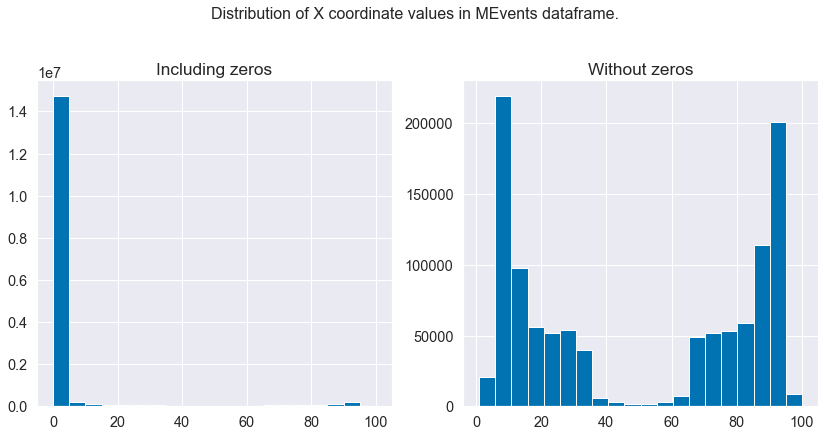

In [105]:
fig, ax = plt.subplots(1,2, figsize = (14, 6))

ax[0].hist(MEvents['X'], bins=20)

ax[1].hist(MEvents[MEvents['X'] != 0]['X'], bins=20)

ax[0].set_title("Including zeros")
ax[1].set_title("Without zeros")

plt.suptitle("Distribution of X coordinate values in MEvents dataframe.", y=1.05)

plt.show()

**Get rid of zero coordinates**

Select rows where "X" is not zero:

In [106]:
court_MEvents = MEvents[MEvents.X != 0]

court_labeled_tourney_MEvents = labeled_tourney_MEvents[labeled_tourney_MEvents['X'] != 0]

What events are available with coordinates?

In [107]:
# What events are available with coordinates?
court_MEvents.EventType.value_counts()

miss2       239654
made2       235534
foul        232902
miss3       192129
turnover    101656
made3        96933
Name: EventType, dtype: int64

Which season data has events with coordinates?

In [108]:
court_MEvents.Season.value_counts()

2020    778983
2019    319825
Name: Season, dtype: int64

### What is the player location for most three-point shots?

In [109]:
# Court outline (image source: [25])
line_img = plt.imread("https://raw.githubusercontent.com/evanca/data-analysis_kaggle_march-madness-analytics-2020/master/img/Vve3bT9.png") 

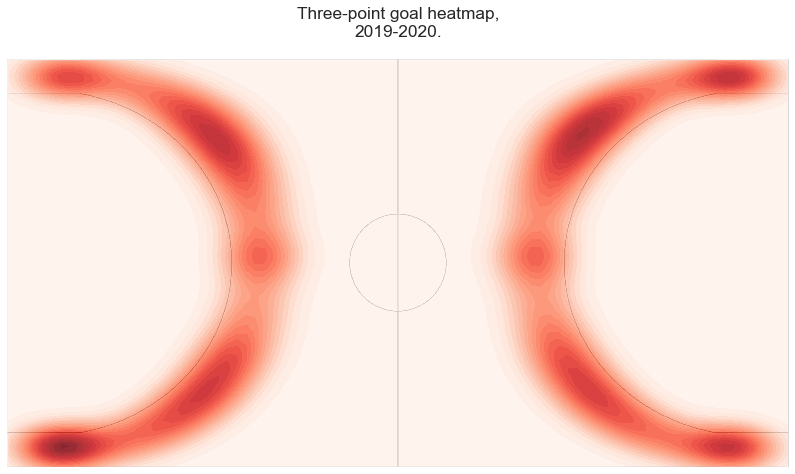


 Area nr. vs. three-point goals:


,Sum,Share
11,34704,35.80%
9,32727,33.76%
10,20002,20.63%
12,5370,5.54%
8,4070,4.20%
13,59,0.06%
6,1,0.00%



9 = outside right
10 = outside center
11 = outside left


In [110]:
df = court_MEvents[court_MEvents.EventType == 'made3']

fig, ax = plt.subplots(figsize=(14,7.5))

sns.kdeplot(df['X'], df['Y'], shade=True, cmap='Reds',
            n_levels=25, alpha=1).set(xlim=(0, 100), ylim=(0, 100))

ax.imshow(line_img, extent=[0, 100, 0, 100], aspect='auto', alpha=0.15, zorder=10)

# Remove coordinates:
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

plt.title('Three-point goal heatmap,\n2019-2020.\n')
plt.show()


print("\n Area nr. vs. three-point goals:")
df = pd.DataFrame(court_MEvents[court_MEvents.EventType == 'made3']['Area'].value_counts())
df['Share'] = df['Area'] / sum(df['Area'])
df.columns=['Sum', 'Share']
df = df.style.format({'Share': "{:.2%}"})
display(df)

print("\n9 = outside right\n10 = outside center\n11 = outside left")

### What is the player location for most turnovers?

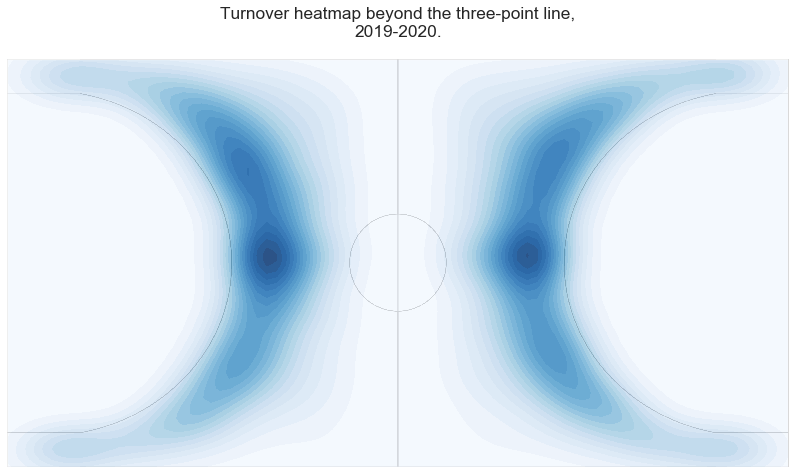


 Area nr. vs. turnovers:


,Sum,Share
10,10710,40.80%
11,7381,28.12%
9,7373,28.09%
12,425,1.62%
8,359,1.37%



9 = outside right
10 = outside center
11 = outside left


In [111]:
df = court_MEvents[(court_MEvents.EventType == 'turnover') &
                   (court_MEvents.Area.isin([8,9,10,11,12]))]

fig, ax = plt.subplots(figsize=(14,7.5))

sns.kdeplot(df['X'], df['Y'], shade=True, cmap='Blues',
            n_levels=25, alpha=1).set(xlim=(0, 100), ylim=(0, 100))

ax.imshow(line_img, extent=[0, 100, 0, 100], aspect='auto', alpha=0.15, zorder=10)

# Remove coordinates:
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

plt.title('Turnover heatmap beyond the three-point line,\n2019-2020.\n')
plt.show()

print("\n Area nr. vs. turnovers:")
df = pd.DataFrame(court_MEvents[(court_MEvents.EventType == 'turnover')&
                                   (court_MEvents.Area.isin([8,9,10,11,12]))]['Area'].value_counts())
df['Share'] = df['Area'] / sum(df['Area'])
df.columns=['Sum', 'Share']
df = df.style.format({'Share': "{:.2%}"})
display(df)

print("\n9 = outside right\n10 = outside center\n11 = outside left")

Make a final image to show in the [Results](#II.-Results) section:

File nr. 8


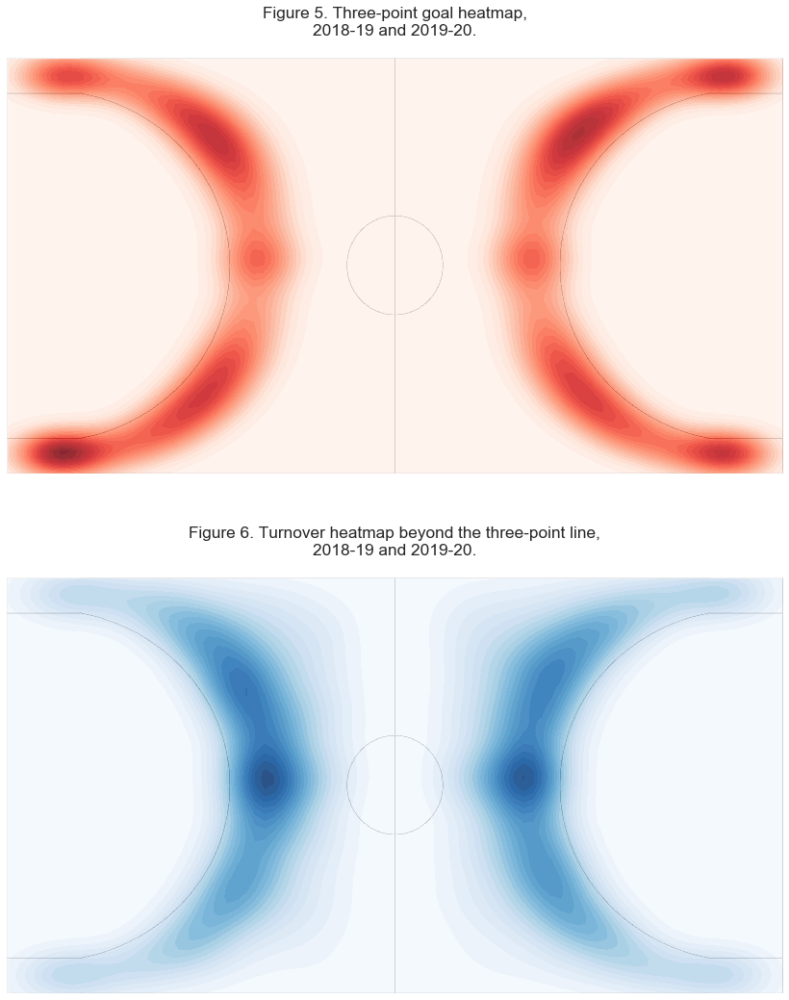

In [112]:
fig = plt.figure(figsize = (14, 15))


### Plot 1 ###

ax1 = fig.add_axes([0, 0.5, 0.8, 0.4]) # [left, bottom, width, height]

df = court_MEvents[court_MEvents.EventType == 'made3']

sns.kdeplot(df['X'], df['Y'], shade=True, cmap='Reds',
            n_levels=25, alpha=1, ax=ax1).set(xlim=(0, 100), ylim=(0, 100))

ax1.imshow(line_img, extent=[0, 100, 0, 100], aspect='auto', alpha=0.15, zorder=10)

# Remove coordinates:
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)

ax1.set_title('Figure 5. Three-point goal heatmap,\n2018-19 and 2019-20.\n')



### Plot 2 ###

ax2 = fig.add_axes([0, 0, 0.8, 0.4]) # [left, bottom, width, height]

df = court_MEvents[(court_MEvents.EventType == 'turnover') &
                   (court_MEvents.Area.isin([8,9,10,11,12]))]

sns.kdeplot(df['X'], df['Y'], shade=True, cmap='Blues',
            n_levels=25, alpha=1, ax=ax2).set(xlim=(0, 100), ylim=(0, 100))

ax2.imshow(line_img, extent=[0, 100, 0, 100], aspect='auto', alpha=0.15, zorder=10)

# Remove coordinates:
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)

ax2.set_title('Figure 6. Turnover heatmap beyond the three-point line,\n2018-19 and 2019-20.\n')

save_plot()
plt.show()

---
### When are the most field goals scored?

**Create 5 minute bins for ElapsedSeconds**

In [113]:
binned_tourney_MEvents = labeled_tourney_MEvents

# Create interval for bins
interval_range = pd.interval_range(start=0, freq=300, end=binned_tourney_MEvents['ElapsedSeconds'].max())

# Create a bin column
binned_tourney_MEvents['bin'] = pd.cut(labeled_tourney_MEvents['ElapsedSeconds'], interval_range)

assert len(binned_tourney_MEvents) == len(labeled_tourney_MEvents)

binned_tourney_MEvents.sample(3)

,EventID,Season,DayNum,WTeamID,LTeamID,WFinalScore,LFinalScore,WCurrentScore,LCurrentScore,ElapsedSeconds,...,NumOT,Scoring margin,Round,NumRound,Seed,SeedNo,Cinderella,Top,LABEL,bin
2536357,2536358,2015,139,1181,1361,68,49,18,11,583,...,0,19,Round 2,2,X01,1,0.0,1.0,Top,"(300, 600]"
13143153,13143154,2019,143,1403,1276,63,44,61,37,2177,...,0,19,Sweet 16,3,X03,3,0.0,1.0,Top,"(2100, 2400]"
10397959,10397960,2018,135,1411,1300,64,46,8,10,376,...,0,18,Play-in,0,Z16b,16,0.0,0.0,Ordinary,"(300, 600]"


In [114]:
# The same but without Nulls:
len(binned_tourney_MEvents[binned_tourney_MEvents['bin'].notna()])

154692

Make a column with minute values (instead of seconds):

In [115]:
# Clean the data: remove Null bins
binned_tourney_MEvents = binned_tourney_MEvents[binned_tourney_MEvents['bin'].notna()]

# Make a column with minute values (instead of seconds)

binned_tourney_MEvents['bin'] = binned_tourney_MEvents['bin'].astype(str)
binned_tourney_MEvents = pd.concat([binned_tourney_MEvents, binned_tourney_MEvents['bin'].str.split(', ', expand=True)], axis=1)

binned_tourney_MEvents.sample(3)

,EventID,Season,DayNum,WTeamID,LTeamID,WFinalScore,LFinalScore,WCurrentScore,LCurrentScore,ElapsedSeconds,...,Round,NumRound,Seed,SeedNo,Cinderella,Top,LABEL,bin,0,1
7805582,7805583,2017,135,1413,1300,67,63,4,2,89,...,Play-in,0,Y16b,16,0.0,0.0,Ordinary,"(0, 300]",(0,300]
10445176,10445177,2018,152,1276,1260,69,57,51,47,2070,...,Final 4,5,Z03,3,0.0,1.0,Top,"(1800, 2100]",(1800,2100]
7856799,7856800,2017,154,1314,1211,71,65,14,14,457,...,National Final,6,Z01,1,0.0,1.0,Top,"(300, 600]",(300,600]


Format "bin" column:

In [116]:
# Format "bin" column to "nr - nr" output:

binned_tourney_MEvents[0] = (binned_tourney_MEvents[0].str.extract(r'(\d+)').astype(int)/60).astype(int) # extract numbers and convert to minutes
binned_tourney_MEvents[1] = (binned_tourney_MEvents[1].str.extract(r'(\d+)').astype(int)/60).astype(int)

binned_tourney_MEvents = binned_tourney_MEvents.sort_values(0) # sort by bins

binned_tourney_MEvents['bin'] = binned_tourney_MEvents[0].astype(str) + " - " + binned_tourney_MEvents[1].astype(str)

binned_tourney_MEvents.sample(3)

,EventID,Season,DayNum,WTeamID,LTeamID,WFinalScore,LFinalScore,WCurrentScore,LCurrentScore,ElapsedSeconds,...,Round,NumRound,Seed,SeedNo,Cinderella,Top,LABEL,bin,0,1
5204637,5204638,2016,144,1438,1235,84,71,68,58,2146,...,Sweet 16,3,X01,1,0.0,1.0,Top,35 - 40,35,40
5177148,5177149,2016,137,1292,1277,90,81,77,76,2186,...,Round 1,1,X15,15,0.0,0.0,Ordinary,35 - 40,35,40
2510666,2510667,2015,135,1352,1316,81,77,73,66,2296,...,Play-in,0,X16b,16,0.0,0.0,Ordinary,35 - 40,35,40


**Calculate total field goals vs. elapsed time**

- Filter out 2-pointers and 3-pointers
- Group data by time bin
- Count events in each bin

In [117]:
# Count EventID cells for each column:
field_goals = binned_tourney_MEvents[(binned_tourney_MEvents['EventType'] == 'made2') |
                                     (binned_tourney_MEvents['EventType'] == 'made3')][['Season', 'EventID',
                                                                                        'bin']].groupby(['Season', 'bin'],
                                                                                                        as_index=False,
                                                                                                        sort=False).count() 

field_goals.head()

,Season,bin,EventID
0,2015,0 - 5,407
1,2017,0 - 5,412
2,2018,0 - 5,437
3,2016,0 - 5,429
4,2019,0 - 5,424


In [118]:
# Create figure
fig = go.Figure()

# Add traces, one for each slider step
all_seasons = [2015, 2016, 2017, 2018, 2019]

# First trace - step [0] with all data:
df = field_goals.groupby('bin', as_index=False, sort=False).sum()

y=df['EventID']

# Different color for the biggest column:
color=np.array([sns.color_palette("cubehelix", 10).as_hex()[6]]*y.shape[0])
color[y < max(y)]=sns.color_palette("cubehelix", 10).as_hex()[5]

fig.add_trace(
            go.Bar(
                visible=False,
                x=df['bin'],
                y=y,
                marker_color=color.tolist(),
            
            text=(y),
            textposition='outside')) 


# Next 5 steps by season:
for season in all_seasons: 
                                                            
    df = field_goals[field_goals.Season == season]
    
    y=df['EventID']
    
    # Different color for the biggest column:
    color=np.array([sns.color_palette("cubehelix", 10).as_hex()[6]]*y.shape[0])
    color[y < max(y)]=sns.color_palette("cubehelix", 10).as_hex()[5]

    
    fig.add_trace(
                go.Bar(
                    visible=False,
                    x=df['bin'],
                    y=y,
                    marker_color=color.tolist(),
            
            text=(y),
            textposition='outside')) 

# Make 0th trace visible
fig.data[0].visible = True


### ADD SLIDER ###
steps = []
step_labels = ['ALL<br>(2015-2019)', '2015', '2016', '2017', '2018', '2019']
for i in range(len(fig.data)):
    step = dict(
        label=step_labels[i],
        method="restyle",
        args=["visible", [False] * len(fig.data)],
    )
    step["args"][1][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=0,
    currentvalue={"prefix": "Season: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)
### END SLIDER ###

fig.update_layout(showlegend=False, # hide ledend
                 width=plotly_width, height=750) # set size

# Set axis font:
fig.update_yaxes(tickfont=dict(size=14))

# Add titles:
fig.update_xaxes(title_text='Elapsed time, minutes')
fig.update_yaxes(title_text='Total goals')

# Plot title:
fig.update_layout(
    title={
        'text': "Field goals scored vs. elapsed time,<br>2015-2019 NCAA® tournaments. Interactive graph.",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font=dict(
        family='sans-serif',
        color="#000")
)


fig.show(renderer="kaggle")

fig_1 = go.Figure(fig) # to show the same fig in the Results section

---

### How does the goal accuracy change with the distance?

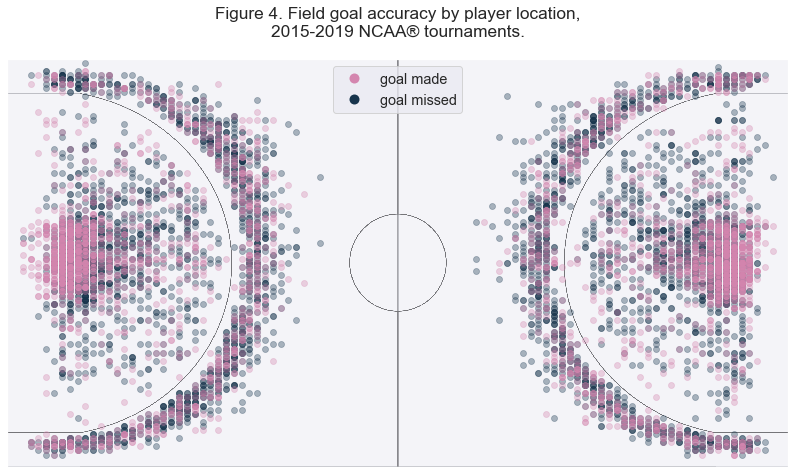

In [119]:
from matplotlib.lines import Line2D

colors = [sns.color_palette("cubehelix", 10)[6], sns.color_palette("cubehelix", 10)[1], 'gold']

fig, ax = plt.subplots(figsize=(14,7.5))

# Show background image:
ax.imshow(line_img, extent=[0, 100, 0, 100], aspect='auto', alpha=0.5)


sns.scatterplot(x='X', y='Y', data=court_labeled_tourney_MEvents[court_labeled_tourney_MEvents.EventType == 'miss2'],
                alpha=0.35,
                edgecolor=None,
                color=colors[1]).set(xlim=(0, 100), ylim=(0, 100))

sns.scatterplot(x='X', y='Y', data=court_labeled_tourney_MEvents[court_labeled_tourney_MEvents.EventType ==  'made2'],
                alpha=0.35,
                edgecolor=None,
                color=colors[0]).set(xlim=(0, 100), ylim=(0, 100))

sns.scatterplot(x='X', y='Y', data=court_labeled_tourney_MEvents[court_labeled_tourney_MEvents.EventType == 'miss3'],
                alpha=0.35,
                edgecolor=None,
                color=colors[1]).set(xlim=(0, 100), ylim=(0, 100))

sns.scatterplot(x='X', y='Y', data=court_labeled_tourney_MEvents[court_labeled_tourney_MEvents.EventType == 'made3'],
                alpha=0.35,
                edgecolor=None,
                color=colors[0]).set(xlim=(0, 100), ylim=(0, 100))


ax = plt.gca()

ax.legend(handles=[(Line2D([0],[0], marker='o', markerfacecolor=colors[0], 
                    linestyle='none', markersize=10, markeredgecolor='none')),
                   (Line2D([0],[0], marker='o', markerfacecolor=colors[1],
                    linestyle='none', markersize=10, markeredgecolor='none'))],
                    labels=["goal made", "goal missed"], loc="upper center")


# Remove coordinate values:
ax = plt.gca()
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

plt.title("Figure 4. Field goal accuracy by player location,\n2015-2019 NCAA® tournaments.\n")

plt.show()

---
**Calculate goal distance in m based on X, Y coordinates**

The court has 15.2 m (50 ft) width and 28.7 m (94 feet) length, equivalent to 100X * 100Y. From this we can calculate one "square" size: 0.152m width x 0.287m length.

2 points are awarded to players who successfully shoot the ball through the hoop from anywhere inside the three-point line. This can be done by shooting a jump shot, laying the ball into the rim, or slamming the ball through the hoop. 3 points are warded to players who successfully shoot the ball through the hoop from behind the three-point line [[26]](#References).

Note that we will assume here that all 3 point goals were made from the same side of the court where the basket is. While this will be true for most cases, few insignificant errors are possible (three-pointer from the other side of the court).

Our pseudocode:

1. Filter out all field goal rows
2. If X > 50, then our basket is on the right, else our basket is on the left side of the court
3. Calculate distance from player to basket
4. Convert coordinate distance to meters

In [120]:
# Filter out all field goal rows for NCAA® tournaments:

goals = court_labeled_tourney_MEvents[court_labeled_tourney_MEvents['EventType'].isin(['made2', 'miss2', 'made3', 'miss3'])]
goals

,EventID,Season,DayNum,WTeamID,LTeamID,WFinalScore,LFinalScore,WCurrentScore,LCurrentScore,ElapsedSeconds,...,WLoc,NumOT,Scoring margin,Round,NumRound,Seed,SeedNo,Cinderella,Top,LABEL
13087108,13087109,2019,134,1125,1396,81,70,17,22,511,...,N,0,11,Play-in,0,W11a,11,0.0,0.0,Ordinary
13087117,13087118,2019,134,1125,1396,81,70,17,22,537,...,N,0,11,Play-in,0,W11a,11,0.0,0.0,Ordinary
13087119,13087120,2019,134,1125,1396,81,70,17,22,558,...,N,0,11,Play-in,0,W11a,11,0.0,0.0,Ordinary
13087126,13087127,2019,134,1125,1396,81,70,17,22,572,...,N,0,11,Play-in,0,W11a,11,0.0,0.0,Ordinary
13087128,13087129,2019,134,1125,1396,81,70,19,22,601,...,N,0,11,Play-in,0,W11a,11,0.0,0.0,Ordinary
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13154573,13154574,2019,154,1438,1403,85,77,7,3,376,...,N,1,8,National Final,6,Z01,1,0.0,1.0,Top
13154575,13154576,2019,154,1438,1403,85,77,7,3,398,...,N,1,8,National Final,6,Z01,1,0.0,1.0,Top
13154578,13154579,2019,154,1438,1403,85,77,7,3,406,...,N,1,8,National Final,6,Z01,1,0.0,1.0,Top
13154582,13154583,2019,154,1438,1403,85,77,9,3,424,...,N,1,8,National Final,6,Z01,1,0.0,1.0,Top


What are the coordinates of each basket?

In [121]:
# Right basket:
goals[(goals['Area'] == 1) & (goals['X'] > 50)][["X", "Y"]].mean().round()

X    93.0
Y    50.0
dtype: float64

From this result, we can tell that **coordinates for the left basket are: X=7, Y=50**.

Next, **convert our coordinates to meters** (as if our court was divided into 1x1m grid):

In [122]:
goals['XMeters'] = goals['X']*0.287
goals['YMeters'] = goals['Y']*0.152

goals.sample(3)

,EventID,Season,DayNum,WTeamID,LTeamID,WFinalScore,LFinalScore,WCurrentScore,LCurrentScore,ElapsedSeconds,...,Scoring margin,Round,NumRound,Seed,SeedNo,Cinderella,Top,LABEL,XMeters,YMeters
13145304,13145305,2019,144,1246,1222,62,58,21,14,729,...,4,Sweet 16,3,Y02,2,0.0,1.0,Top,7.462,12.616
13147886,13147887,2019,146,1120,1246,77,71,44,43,1549,...,6,Elite 8,4,Y05,5,0.0,0.0,Ordinary,20.664,4.104
13108108,13108109,2019,136,1261,1463,79,74,21,17,548,...,5,Round 1,1,W03,3,0.0,1.0,Top,23.534,8.664


Basket coordinates in meters:

In [123]:
# Basket coordinates in meters:

right_basket_m = (93*0.287, 50*0.152)
left_basket_m = (7*0.287, 50*0.152)

print(right_basket_m, left_basket_m)

(26.691, 7.6) (2.009, 7.6)


**Calculate the distance**

In [124]:
%%time

import math
def calculate_distance(x1,y1, x2,y2):  
    '''Calculate distance between two points'''
    dist = math.sqrt((x2 - x1)**2 + (y2 - y1)**2)  
    return dist 

goals['ShotDistanceMeters'] = None

len_goals = len(goals)

i = 1
for index, row in goals.iterrows():
    if goals['X'][index] > 50:  # right basket
        goals['ShotDistanceMeters'][index] = calculate_distance(goals['XMeters'][index],
                                                                goals['YMeters'][index],
                                                                right_basket_m[0],
                                                                right_basket_m[1])
    elif goals['X'][index] < 50: # left basket
        goals['ShotDistanceMeters'][index] = calculate_distance(goals['XMeters'][index],
                                                                goals['YMeters'][index],
                                                                left_basket_m[0],
                                                                left_basket_m[1])
    i+=1
    print("Updating row nr. {} / of {}".format(i, len_goals)
         + " "*100, end="\r", flush=True) # erase output and print on the same line

print(" "*100, end="\r", flush=True) # erase final output
goals.sample(3)

Wall time: 11.4 s                                                                                                                  


,EventID,Season,DayNum,WTeamID,LTeamID,WFinalScore,LFinalScore,WCurrentScore,LCurrentScore,ElapsedSeconds,...,Round,NumRound,Seed,SeedNo,Cinderella,Top,LABEL,XMeters,YMeters,ShotDistanceMeters
13141759,13141760,2019,143,1345,1397,99,94,23,13,654,...,Sweet 16,3,Z03,3,0.0,1.0,Top,2.296,7.600,0.287
13125642,13125643,2019,138,1276,1196,64,49,2,0,66,...,Round 2,2,X02,2,0.0,1.0,Top,21.525,12.616,7.20054
13097680,13097681,2019,135,1295,1300,78,74,68,68,2169,...,Play-in,0,W16a,16,0.0,0.0,Ordinary,9.184,6.992,7.20071


In [125]:
goals['ShotDistanceMeters'].isna().sum() # just a test

0

Split distance to 0.5 m bins:

In [126]:
min(goals['ShotDistanceMeters']), max(goals['ShotDistanceMeters'])

(0.0, 10.397603233437984)

In [127]:
from operator import attrgetter

# Create interval for bins
interval_range = pd.interval_range(start=-0.5, freq=0.5, end=12)

# Create a bin column
goals['DistanceBin'] = pd.cut(goals['ShotDistanceMeters'], interval_range)

# Note the right number of interval (a square bracket is inclusive) 
goals['DistRightBound'] = goals['DistanceBin'].map(attrgetter('right'))

goals.sample(3)

,EventID,Season,DayNum,WTeamID,LTeamID,WFinalScore,LFinalScore,WCurrentScore,LCurrentScore,ElapsedSeconds,...,Seed,SeedNo,Cinderella,Top,LABEL,XMeters,YMeters,ShotDistanceMeters,DistanceBin,DistRightBound
13115764,13115765,2019,137,1251,1280,80,76,78,74,2395,...,W12,12,0.0,0.0,Ordinary,2.296,6.840,0.812385,"(0.5, 1.0]",1.0
13126515,13126516,2019,138,1345,1437,87,61,27,17,681,...,Z03,3,0.0,1.0,Top,5.166,1.672,6.71624,"(6.5, 7.0]",7.0
13141970,13141971,2019,143,1345,1397,99,94,53,36,1464,...,Z03,3,0.0,1.0,Top,26.404,8.816,1.24941,"(1.0, 1.5]",1.5


**Calculate shot accuracy per distance in meters**

In [128]:
df = goals.groupby(['DistRightBound', 'LABEL', 'EventType'], as_index=False)['EventID'].count()
df

,DistRightBound,LABEL,EventType,EventID
0,0.0,Cinderella,made2,1.0
1,0.0,Cinderella,made3,NaN
2,0.0,Cinderella,miss2,NaN
3,0.0,Cinderella,miss3,NaN
4,0.0,Ordinary,made2,26.0
...,...,...,...,...
295,12.0,Ordinary,miss3,NaN
296,12.0,Top,made2,NaN
297,12.0,Top,made3,NaN
298,12.0,Top,miss2,NaN


One-hot encode "made" or "miss":

In [129]:
dummies = pd.get_dummies(df['EventType']) # what type of event

for col in dummies:
    df[col] = dummies[col]*df['EventID'] # how many of such events

df[~df.EventID.isna()]

,DistRightBound,LABEL,EventType,EventID,made2,made3,miss2,miss3
0,0.0,Cinderella,made2,1.0,1.0,0.0,0.0,0.0
4,0.0,Ordinary,made2,26.0,26.0,0.0,0.0,0.0
6,0.0,Ordinary,miss2,15.0,0.0,0.0,15.0,0.0
8,0.0,Top,made2,16.0,16.0,0.0,0.0,0.0
10,0.0,Top,miss2,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...
237,9.5,Top,made3,3.0,0.0,3.0,0.0,0.0
239,9.5,Top,miss3,4.0,0.0,0.0,0.0,4.0
247,10.0,Ordinary,miss3,3.0,0.0,0.0,0.0,3.0
251,10.0,Top,miss3,3.0,0.0,0.0,0.0,3.0


**Calculate field-goal percentage (goal accuracy in %)**

In [130]:
shooting_accuracy_df = df.groupby(['DistRightBound'], as_index = False).sum()
shooting_accuracy_df.sample(3)

,DistRightBound,EventID,made2,made3,miss2,miss3
14,7.0,1406.0,0.0,503.0,0.0,903.0
10,5.0,233.0,94.0,0.0,139.0,0.0
8,4.0,185.0,60.0,0.0,125.0,0.0


In [131]:
labeled_shooting_accuracy_df = df.groupby(['DistRightBound', 'LABEL'], as_index = False).sum()
labeled_shooting_accuracy_df.sample(3)

,DistRightBound,LABEL,EventID,made2,made3,miss2,miss3
67,11.0,Ordinary,0.0,0.0,0.0,0.0,0.0
54,9.0,Cinderella,2.0,0.0,0.0,0.0,2.0
66,11.0,Cinderella,0.0,0.0,0.0,0.0,0.0


In [132]:
# Calculate field-goal percentage (goal accuracy in %):

for df in [shooting_accuracy_df, labeled_shooting_accuracy_df]:
    df['GoalsScored'] = df['made2'] + df['made3']
    df['GoalAccuracy'] = df['GoalsScored'] / df['EventID']

shooting_accuracy_df.sample(3)

,DistRightBound,EventID,made2,made3,miss2,miss3,GoalsScored,GoalAccuracy
13,6.5,73.0,4.0,25.0,1.0,43.0,29.0,0.397260
24,12.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
10,5.0,233.0,94.0,0.0,139.0,0.0,94.0,0.403433


Make final image:

File nr. 9


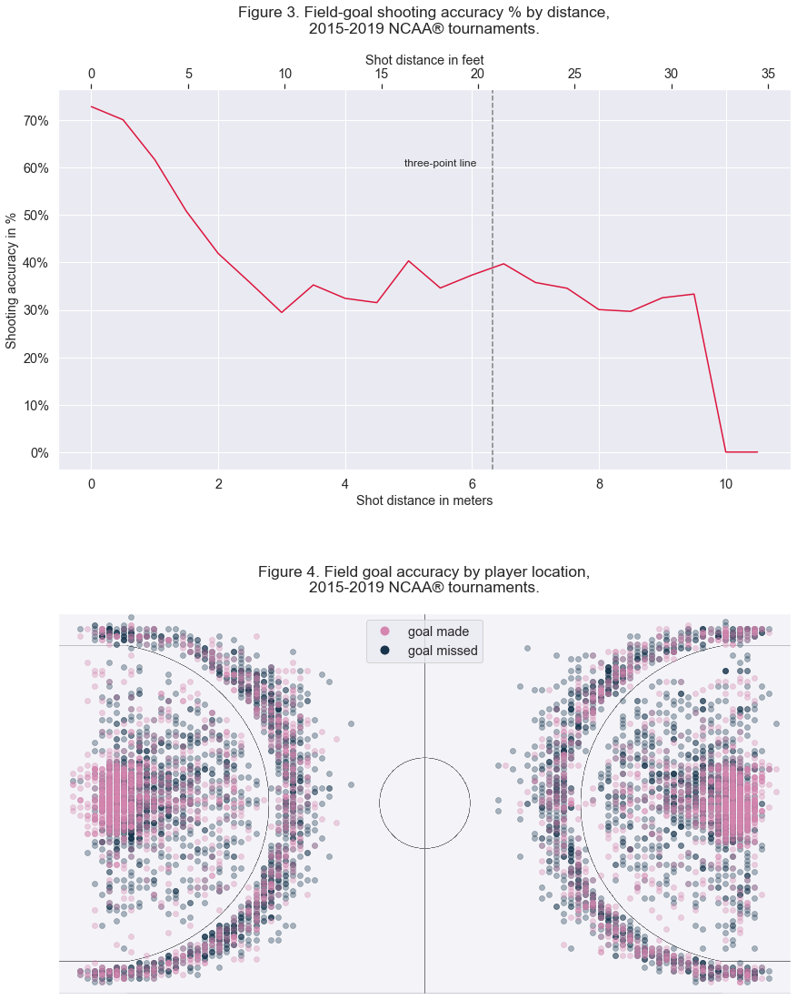

In [133]:
import matplotlib.ticker as mtick

fig = plt.figure(figsize = (14, 20))


### Plot 1 ###

ax1 = fig.add_axes([0, 0.4, 0.8, 0.29]) # [left, bottom, width, height]

sns.lineplot(x='DistRightBound', y='GoalAccuracy', data=shooting_accuracy_df, color='crimson', ax=ax1)
ax1.set_xlabel("Shot distance in meters")
ax1.set_ylabel("Shooting accuracy in %")

# Y ticks ar percentage:
ax1.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# Show 3 point line:
ax1.axvline(x=6.3246, color='grey', linestyle='--') # 20 feet, 9 inches
ax1.annotate('three-point line',
            xy=(6.37, 0.7), xycoords='data',
            xytext=(-100, -50), textcoords='offset points')

# Add secondary axis to also show feet distance:
def m2feet(x):
    return x * 3.28084
def feet2m(x):
    return x / 3.28084
secax = ax1.secondary_xaxis('top', functions=(m2feet, feet2m))
secax.set_xlabel('Shot distance in feet')

ax1.set_title("Figure 3. Field-goal shooting accuracy % by distance,\n2015-2019 NCAA® tournaments.\n")


### Plot 2 ###

ax2 = fig.add_axes([0, 0, 0.8, 0.29]) # [left, bottom, width, height]

# Show background image:
ax2.imshow(line_img, extent=[0, 100, 0, 100], aspect='auto', alpha=0.5)


sns.scatterplot(x='X', y='Y', data=court_labeled_tourney_MEvents[court_labeled_tourney_MEvents.EventType == 'miss2'],
                alpha=0.35,
                edgecolor=None,
                color=colors[1], ax=ax2).set(xlim=(0, 100), ylim=(0, 100))

sns.scatterplot(x='X', y='Y', data=court_labeled_tourney_MEvents[court_labeled_tourney_MEvents.EventType ==  'made2'],
                alpha=0.35,
                edgecolor=None,
                color=colors[0], ax=ax2).set(xlim=(0, 100), ylim=(0, 100))

sns.scatterplot(x='X', y='Y', data=court_labeled_tourney_MEvents[court_labeled_tourney_MEvents.EventType == 'miss3'],
                alpha=0.35,
                edgecolor=None,
                color=colors[1], ax=ax2).set(xlim=(0, 100), ylim=(0, 100))

sns.scatterplot(x='X', y='Y', data=court_labeled_tourney_MEvents[court_labeled_tourney_MEvents.EventType == 'made3'],
                alpha=0.35,
                edgecolor=None,
                color=colors[0], ax=ax2).set(xlim=(0, 100), ylim=(0, 100))

ax2.legend(handles=[(Line2D([0],[0], marker='o', markerfacecolor=colors[0], 
                    linestyle='none', markersize=10, markeredgecolor='none')),
                   (Line2D([0],[0], marker='o', markerfacecolor=colors[1],
                    linestyle='none', markersize=10, markeredgecolor='none'))],
                    labels=["goal made", "goal missed"], loc="upper center")


# Remove coordinate values:
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)

ax2.set_title("\nFigure 4. Field goal accuracy by player location,\n2015-2019 NCAA® tournaments.\n")

save_plot()
plt.show()

### What is shooting accuracy by distance per team category?

File nr. 10


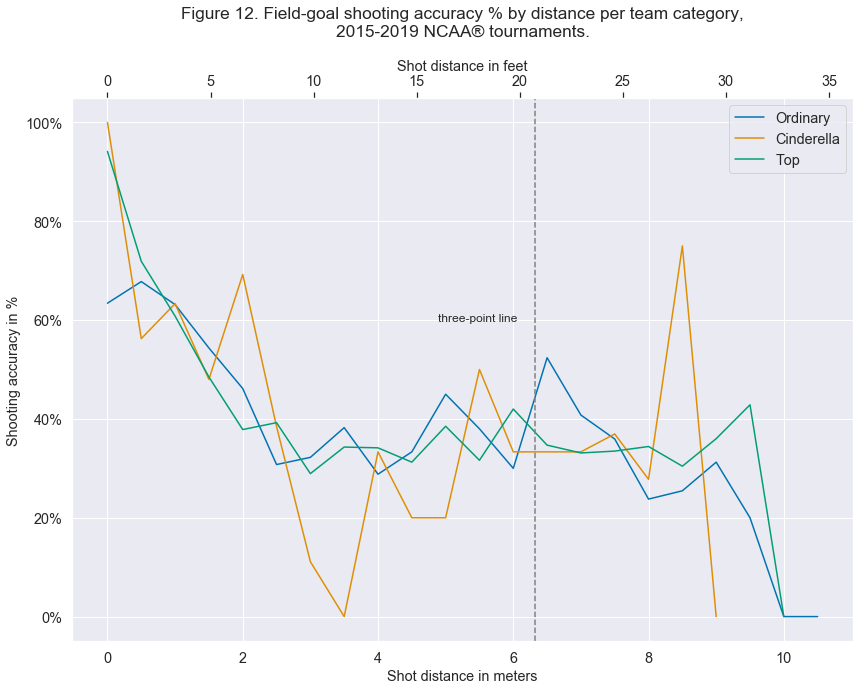

Descriptive numbers for file nr. 10 (Cinderella):

GoalAccuracy < 20%:
   DistRightBound  GoalAccuracy
18            3.0      0.111111
21            3.5      0.000000
54            9.0      0.000000

GoalAccuracy > 60%:
   DistRightBound  GoalAccuracy
0             0.0      1.000000
6             1.0      0.633333
12            2.0      0.692308
51            8.5      0.750000


In [134]:
sns.lineplot(x='DistRightBound', y='GoalAccuracy', data=labeled_shooting_accuracy_df, hue="LABEL", hue_order=order)
plt.xlabel("Shot distance in meters")
plt.ylabel("Shooting accuracy in %")

ax = plt.gca()
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles=handles[1:], labels=labels[1:])

# Y ticks ar percentage:
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# Show 3 point line:
plt.axvline(x=6.3246, color='grey', linestyle='--') # 20 feet, 9 inches
plt.gca().annotate('three-point line',
            xy=(6.37, 0.7), xycoords='data',
            xytext=(-100, -50), textcoords='offset points')

# Add secondary axis to also show feet distance:
def m2feet(x):
    return x * 3.28084
def feet2m(x):
    return x / 3.28084
secax = plt.gca().secondary_xaxis('top', functions=(m2feet, feet2m))
secax.set_xlabel('Shot distance in feet')

plt.title("Figure 12. Field-goal shooting accuracy % by distance per team category,\n2015-2019 NCAA® tournaments.\n")


save_plot()
plt.show()


print("Descriptive numbers for file nr. {} (Cinderella):".format(str(file_nr-1)))

cinderella = labeled_shooting_accuracy_df[labeled_shooting_accuracy_df.LABEL == 'Cinderella']

print('\nGoalAccuracy < 20%:')
print(cinderella[cinderella.GoalAccuracy < 0.2][['DistRightBound', 'GoalAccuracy']])

print('\nGoalAccuracy > 60%:')
print(cinderella[cinderella.GoalAccuracy > 0.6][['DistRightBound', 'GoalAccuracy']])

---

## 2.5. Individual Statistics, 2015-2020

**Data Section 5 file: MPlayers.csv** - this file lists player ID, player's last and first names and the TeamID of the player's team [[1]](#References).

In [135]:
MPlayers_file = "/kaggle/input/march-madness-analytics-2020/MPlayByPlay_Stage2/MPlayers.csv"

if sys.executable != '/opt/conda/bin/python':
    # remove the forward slash if running this notebook locally:
    MPlayers_file = MPlayers_file[1:]    
    
MPlayers = pd.read_csv(MPlayers_file)
print("Num rows: {}".format(len(MPlayers)))
print("NaN values: {}".format(MPlayers.isna().sum().sum()))
print("Duplicated rows: {}".format(MEvents2019.duplicated().sum()))

Num rows: 15586
NaN values: 0
Duplicated rows: 0


In [136]:
pd.concat([MPlayers.head(3), MPlayers.tail(2)])

,PlayerID,LastName,FirstName,TeamID
0,1,Albright,Christian,1101
1,2,Cameron,Tobias,1101
2,3,Cobb,Chase,1101
15584,15585,Reid,Ziggy,1467
15585,15586,Watkins,Mikey,1467


**Add player's last and first names to our labeled tourney MEvents data**

In [137]:
print(len(labeled_tourney_MEvents))

154771


In [138]:
list(MPlayers)

['PlayerID', 'LastName', 'FirstName', 'TeamID']

In [139]:
MPlayers.rename({'PlayerID': 'EventPlayerID',
                 'TeamID': 'EventTeamID'}, axis=1, inplace=True)

cols = ['EventPlayerID', 'EventTeamID']

players_labeled_tourney_MEvents = labeled_tourney_MEvents.join(MPlayers.set_index(cols), on=cols)

assert len(players_labeled_tourney_MEvents) == len(labeled_tourney_MEvents)

players_labeled_tourney_MEvents

,EventID,Season,DayNum,WTeamID,LTeamID,WFinalScore,LFinalScore,WCurrentScore,LCurrentScore,ElapsedSeconds,...,Round,NumRound,Seed,SeedNo,Cinderella,Top,LABEL,bin,LastName,FirstName
2496815,2496816,2015,134,1214,1264,74,64,0,0,20,...,Play-in,0,Y16a,16,0.0,0.0,Ordinary,"(0, 300]",Stores,Rashawn
2496816,2496817,2015,134,1214,1264,74,64,0,0,20,...,Play-in,0,Y16a,16,0.0,0.0,Ordinary,"(0, 300]",NaN,NaN
2496817,2496818,2015,134,1214,1264,74,64,0,0,37,...,Play-in,0,Y16a,16,0.0,0.0,Ordinary,"(0, 300]",Pankey,Ashton
2496818,2496819,2015,134,1214,1264,74,64,0,0,37,...,Play-in,0,Y16a,16,0.0,0.0,Ordinary,"(0, 300]",Pankey,Ashton
2496819,2496820,2015,134,1214,1264,74,64,0,0,42,...,Play-in,0,Y16a,16,0.0,0.0,Ordinary,"(0, 300]",Pankey,Ashton
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13154589,13154590,2019,154,1438,1403,85,77,9,3,424,...,National Final,6,Z01,1,0.0,1.0,Top,"(300, 600]",Salt,Jack
13154590,13154591,2019,154,1438,1403,85,77,9,3,424,...,National Final,6,Z01,1,0.0,1.0,Top,"(300, 600]",Francis,Brandone
13154591,13154592,2019,154,1438,1403,85,77,9,3,424,...,National Final,6,Z01,1,0.0,1.0,Top,"(300, 600]",Odiase,Norense
13154592,13154593,2019,154,1438,1403,85,77,9,3,424,...,National Final,6,Z01,1,0.0,1.0,Top,"(300, 600]",Owens,Tariq


**One-hot encode event type**

In [140]:
dummies = pd.get_dummies(players_labeled_tourney_MEvents['EventType']) # what type of event

assert len(dummies) == len(players_labeled_tourney_MEvents)

players_labeled_tourney_MEvents = pd.concat([players_labeled_tourney_MEvents, dummies], axis=1)
players_labeled_tourney_MEvents

,EventID,Season,DayNum,WTeamID,LTeamID,WFinalScore,LFinalScore,WCurrentScore,LCurrentScore,ElapsedSeconds,...,made2,made3,miss1,miss2,miss3,reb,steal,sub,timeout,turnover
2496815,2496816,2015,134,1214,1264,74,64,0,0,20,...,0,0,0,0,1,0,0,0,0,0
2496816,2496817,2015,134,1214,1264,74,64,0,0,20,...,0,0,0,0,0,1,0,0,0,0
2496817,2496818,2015,134,1214,1264,74,64,0,0,37,...,0,0,0,1,0,0,0,0,0,0
2496818,2496819,2015,134,1214,1264,74,64,0,0,37,...,0,0,0,0,0,1,0,0,0,0
2496819,2496820,2015,134,1214,1264,74,64,0,0,42,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13154589,13154590,2019,154,1438,1403,85,77,9,3,424,...,0,0,0,0,0,0,0,1,0,0
13154590,13154591,2019,154,1438,1403,85,77,9,3,424,...,0,0,0,0,0,0,0,1,0,0
13154591,13154592,2019,154,1438,1403,85,77,9,3,424,...,0,0,0,0,0,0,0,1,0,0
13154592,13154593,2019,154,1438,1403,85,77,9,3,424,...,0,0,0,0,0,0,0,1,0,0


**Calculate offensive efficiency per season**

Offensive efficiency = **(FGM + A) / (FGA - OREB + A + TO)** [[7]](#References)

1. Create columns with **offensive** rebounds and **defensive** rebounds (based on EventSubType):

In [141]:
players_labeled_tourney_MEvents['OREB'] = 0 # new column, default value
players_labeled_tourney_MEvents.loc[players_labeled_tourney_MEvents.EventSubType.isin(['off', 'offdb']),
                                    'OREB'] = 1

players_labeled_tourney_MEvents['DREB'] = 0 # new column, default value
players_labeled_tourney_MEvents.loc[players_labeled_tourney_MEvents.EventSubType.isin(['def', 'defdb']),
                                    'DREB'] = 1

players_labeled_tourney_MEvents

,EventID,Season,DayNum,WTeamID,LTeamID,WFinalScore,LFinalScore,WCurrentScore,LCurrentScore,ElapsedSeconds,...,miss1,miss2,miss3,reb,steal,sub,timeout,turnover,OREB,DREB
2496815,2496816,2015,134,1214,1264,74,64,0,0,20,...,0,0,1,0,0,0,0,0,0,0
2496816,2496817,2015,134,1214,1264,74,64,0,0,20,...,0,0,0,1,0,0,0,0,1,0
2496817,2496818,2015,134,1214,1264,74,64,0,0,37,...,0,1,0,0,0,0,0,0,0,0
2496818,2496819,2015,134,1214,1264,74,64,0,0,37,...,0,0,0,1,0,0,0,0,1,0
2496819,2496820,2015,134,1214,1264,74,64,0,0,42,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13154589,13154590,2019,154,1438,1403,85,77,9,3,424,...,0,0,0,0,0,1,0,0,0,0
13154590,13154591,2019,154,1438,1403,85,77,9,3,424,...,0,0,0,0,0,1,0,0,0,0
13154591,13154592,2019,154,1438,1403,85,77,9,3,424,...,0,0,0,0,0,1,0,0,0,0
13154592,13154593,2019,154,1438,1403,85,77,9,3,424,...,0,0,0,0,0,1,0,0,0,0


2. Create columns with **field goals made** and **field goals attempted**:

In [142]:
players_labeled_tourney_MEvents['FGM'] = 0 # new column, default value
players_labeled_tourney_MEvents['FGA'] = 0 # new column, default value

players_labeled_tourney_MEvents.loc[players_labeled_tourney_MEvents.EventType.isin(['made2', 'made3']),
                                    'FGM'] = 1

players_labeled_tourney_MEvents.loc[players_labeled_tourney_MEvents.EventType.isin(['made2', 'made3', 'miss2', 'miss3']),
                                    'FGA'] = 1

players_labeled_tourney_MEvents

,EventID,Season,DayNum,WTeamID,LTeamID,WFinalScore,LFinalScore,WCurrentScore,LCurrentScore,ElapsedSeconds,...,miss3,reb,steal,sub,timeout,turnover,OREB,DREB,FGM,FGA
2496815,2496816,2015,134,1214,1264,74,64,0,0,20,...,1,0,0,0,0,0,0,0,0,1
2496816,2496817,2015,134,1214,1264,74,64,0,0,20,...,0,1,0,0,0,0,1,0,0,0
2496817,2496818,2015,134,1214,1264,74,64,0,0,37,...,0,0,0,0,0,0,0,0,0,1
2496818,2496819,2015,134,1214,1264,74,64,0,0,37,...,0,1,0,0,0,0,1,0,0,0
2496819,2496820,2015,134,1214,1264,74,64,0,0,42,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13154589,13154590,2019,154,1438,1403,85,77,9,3,424,...,0,0,0,1,0,0,0,0,0,0
13154590,13154591,2019,154,1438,1403,85,77,9,3,424,...,0,0,0,1,0,0,0,0,0,0
13154591,13154592,2019,154,1438,1403,85,77,9,3,424,...,0,0,0,1,0,0,0,0,0,0
13154592,13154593,2019,154,1438,1403,85,77,9,3,424,...,0,0,0,1,0,0,0,0,0,0


3. Group **by game and player**, sum up the events:

This step can me skipped for OE, but we will be using this data later.

In [143]:
# Prepare column names:

dummy_cols = list(dummies)

game_cols = ['Season', 'DayNum', 'WTeamID', 'LTeamID'] # to identify each game

cols = ['LABEL',
        'EventPlayerID',
        'LastName',
        'FirstName'] + dummy_cols + game_cols + ['OREB', 'DREB', 'FGM', 'FGA']

print(cols)

['LABEL', 'EventPlayerID', 'LastName', 'FirstName', 'assist', 'block', 'foul', 'fouled', 'jumpb', 'made1', 'made2', 'made3', 'miss1', 'miss2', 'miss3', 'reb', 'steal', 'sub', 'timeout', 'turnover', 'Season', 'DayNum', 'WTeamID', 'LTeamID', 'OREB', 'DREB', 'FGM', 'FGA']


In [144]:
sum_per_game_tourney_MEvents = players_labeled_tourney_MEvents.groupby(game_cols + ['LABEL',
                                                                                    'EventPlayerID',
                                                                                    'LastName',
                                                                                    'FirstName'],
                                                                       as_index=False).sum()[cols]

print("Play-by-play event logs (tournaments grouped by game and player, sum events):")
sum_per_game_tourney_MEvents

Play-by-play event logs (tournaments grouped by game and player, sum events):


,LABEL,EventPlayerID,LastName,FirstName,assist,block,foul,fouled,jumpb,made1,...,timeout,turnover,Season,DayNum,WTeamID,LTeamID,OREB,DREB,FGM,FGA
0,Ordinary,4750,Brown,Ke'Ron,0,0,3,0,0,3,...,0,2,2015,134,1214,1264,1,1,1,2
1,Ordinary,4756,Chirvous,Quinton,1,0,0,0,0,1,...,0,0,2015,134,1214,1264,2,11,7,12
2,Ordinary,4759,Darden,Brian,4,0,4,0,0,6,...,0,4,2015,134,1214,1264,1,1,3,6
3,Ordinary,4768,Johnson,Reginald,5,0,2,0,0,4,...,0,2,2015,134,1214,1264,1,4,5,16
4,Ordinary,4769,Key,Breon,0,0,2,0,0,2,...,0,0,2015,134,1214,1264,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6554,Top,14488,Huff,Jay,0,0,1,0,0,0,...,0,0,2019,154,1438,1403,0,0,0,1
6555,Top,14489,Hunter,De'Andre,1,0,1,7,0,7,...,0,4,2019,154,1438,1403,4,5,8,16
6556,Top,14490,Jerome,Ty,8,0,1,1,0,2,...,0,1,2019,154,1438,1403,1,5,6,16
6557,Top,14495,Key,Braxton,2,1,3,2,0,2,...,0,1,2019,154,1438,1403,2,8,2,5


4. Group **by season and player**, sum up the events:

In [145]:
players_season = players_labeled_tourney_MEvents.groupby(['Season',
                                                            'LABEL',
                                                            'EventPlayerID',
                                                            'LastName',
                                                            'FirstName'], as_index=False).sum()

print("Play-by-play event logs (tournaments grouped by season and player, sum events):")
players_season

Play-by-play event logs (tournaments grouped by season and player, sum events):


,Season,LABEL,EventPlayerID,LastName,FirstName,EventID,DayNum,WTeamID,LTeamID,WFinalScore,...,miss3,reb,steal,sub,timeout,turnover,OREB,DREB,FGM,FGA
0,2015,Cinderella,11692,Brown,Sterling,40331293,2176,22672,21984,960,...,2,3,2,1,0,0,3,0,1,3
1,2015,Cinderella,11695,Cunningham,Cannen,52933238,2856,29757,28854,1260,...,0,2,0,7,0,2,1,1,1,6
2,2015,Cinderella,11700,Emelogu II,Ben,27726426,1496,15587,15114,660,...,1,2,0,1,0,0,0,2,0,1
3,2015,Cinderella,11707,Kennedy,Markus,93264006,5032,52429,50838,2220,...,0,9,2,4,0,2,2,7,6,13
4,2015,Cinderella,11710,Manuel,Ryan,45373079,2448,25506,24732,1080,...,1,3,2,1,0,1,0,3,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4472,2019,Top,15469,Oni,Miye,458792948,4760,44135,51205,2765,...,9,5,2,0,0,2,0,5,2,16
4473,2019,Top,15470,Phills,Trey,196623889,2040,18915,21945,1185,...,2,0,0,5,0,2,0,0,1,3
4474,2019,Top,15471,Reynolds,Blake,419466969,4352,40352,46816,2528,...,4,8,0,10,0,0,3,5,2,9
4475,2019,Top,15476,Swain,Azar,419466456,4352,40352,46816,2528,...,6,5,1,7,0,0,0,5,3,9


5. Finally, calculate the OE:

Note that we removed division by zero and negative values.

In [146]:
players_season['OE_numerator'] = players_season['FGM'] + \
                                                  players_season['assist']
players_season['OE_denominator'] = players_season['FGA'] - \
                                                    players_season['OREB'] + \
                                                    players_season['assist'] + \
                                                    players_season['turnover']

# Remove division by zero and negative values:
players_season = players_season[(players_season['OE_denominator'] > 0)]

# Calculate the OE:
players_season['OE'] = (players_season['OE_numerator'] / \
                                        players_season['OE_denominator']).round(2)

players_season

,Season,LABEL,EventPlayerID,LastName,FirstName,EventID,DayNum,WTeamID,LTeamID,WFinalScore,...,sub,timeout,turnover,OREB,DREB,FGM,FGA,OE_numerator,OE_denominator,OE
0,2015,Cinderella,11692,Brown,Sterling,40331293,2176,22672,21984,960,...,1,0,0,3,0,1,3,4,3,1.33
1,2015,Cinderella,11695,Cunningham,Cannen,52933238,2856,29757,28854,1260,...,7,0,2,1,1,1,6,1,7,0.14
2,2015,Cinderella,11700,Emelogu II,Ben,27726426,1496,15587,15114,660,...,1,0,0,0,2,0,1,3,4,0.75
3,2015,Cinderella,11707,Kennedy,Markus,93264006,5032,52429,50838,2220,...,4,0,2,2,7,6,13,6,13,0.46
4,2015,Cinderella,11710,Manuel,Ryan,45373079,2448,25506,24732,1080,...,1,0,1,0,3,2,3,4,6,0.67
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4471,2019,Top,15449,Copeland,Alex,458791796,4760,44135,51205,2765,...,2,0,3,2,3,9,16,11,19,0.58
4472,2019,Top,15469,Oni,Miye,458792948,4760,44135,51205,2765,...,0,0,2,0,5,2,16,6,22,0.27
4473,2019,Top,15470,Phills,Trey,196623889,2040,18915,21945,1185,...,5,0,2,0,0,1,3,1,5,0.20
4474,2019,Top,15471,Reynolds,Blake,419466969,4352,40352,46816,2528,...,10,0,0,3,5,2,9,2,6,0.33


In [147]:
players_season.OE.describe()

count    3822.000000
mean        0.526439
std         0.350156
min         0.000000
25%         0.330000
50%         0.500000
75%         0.670000
max         4.000000
Name: OE, dtype: float64

6. Delete misleading results

We noticed that the formula that we are using can produce high Offensive Efficiency values even for low performing players, for example if both OE numerator and OE denominator will be "1", the output will be "1", which can lead to misleading interpretations.

Considering that we are only interested in plotting **top OE players**, we can fix this by applying filters based on the scores used in OE formula. We will eliminate all FGM scores below median.

In [148]:
players_season.FGM.describe()

count    3822.000000
mean        4.389848
std         5.396867
min         0.000000
25%         1.000000
50%         3.000000
75%         6.000000
max        45.000000
Name: FGM, dtype: float64

In [149]:
# Eliminate lower 50% of summary FGM per season:

print(len(players_season))

fgm_median = players_season['FGM'].median()
players_season = players_season[(players_season['FGM'] > fgm_median)]

print(len(players_season))
players_season.OE.describe()

3822
1648


count    1648.000000
mean        0.603568
std         0.251949
min         0.210000
25%         0.460000
50%         0.560000
75%         0.670000
max         4.000000
Name: OE, dtype: float64

### Are Cinderella team's players more effective in offense?

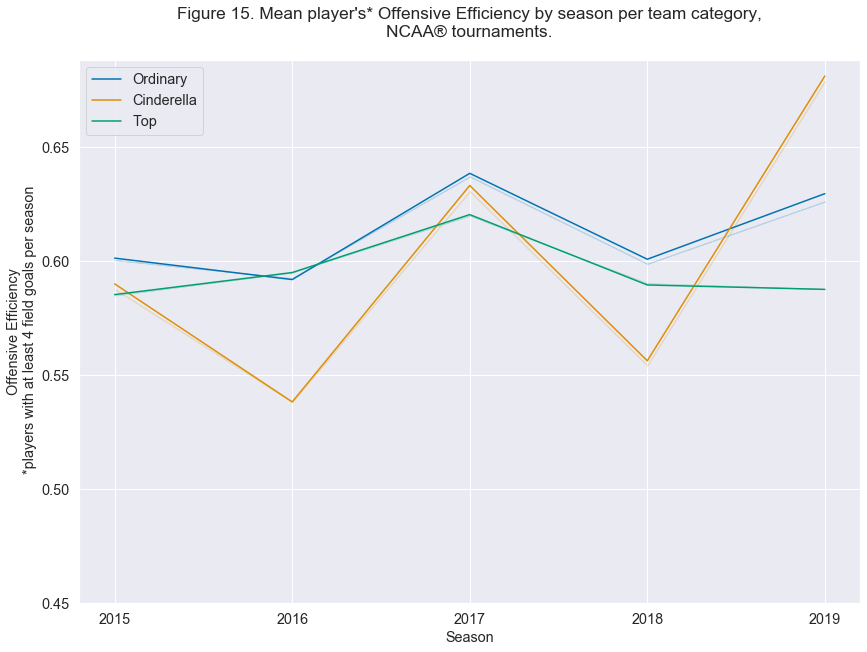

Descriptive statistics for file nr. 10:


OE                                                    
            count      mean       std   min     25%   50%   75%   max
LABEL                                                                
Cinderella   92.0  0.580652  0.186805  0.27  0.4475  0.56  0.67  1.31
Ordinary    852.0  0.611761  0.267616  0.21  0.4700  0.56  0.67  4.00
Top         704.0  0.596648  0.239389  0.24  0.4600  0.56  0.67  3.00

In [150]:
sns.lineplot(x='Season', y='OE', data = players_season,
             hue='LABEL', hue_order=order, ci=False).set(ylim=(0.45, None))

plt.xlabel("Season")
plt.ylabel(f'Offensive Efficiency\n *players with at least {int(fgm_median) + 1} field goals per season')

ax = plt.gca()
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles=handles[1:], labels=labels[1:])

plt.xticks(np.arange(2015, 2020, 1.0)) # custom x ticks

plt.title("Figure 15. Mean player's* Offensive Efficiency by season per team category,\nNCAA® tournaments.\n")

plt.show()

print("Descriptive statistics for file nr. {}:".format(str(file_nr-1)))
players_season.groupby("LABEL")[['OE']].describe()

- Cinderella teams had a lowest mean player's Offensive Efficiency in season 2016 (team Syracuse and team Gonzaga) and highest in 2019 (team Oregon).
- Offensive leaders are changing from season to season and there is no visible trend to superiority of one particular team category over another in terms of Offensive Efficiency.
- All team categories have the same median player's Offensive Efficiency accoss last 5 seasons - 0.56.

This plot will not be included in the [Results](#III.-Results) section.

### Offensive leaders

File nr. 11


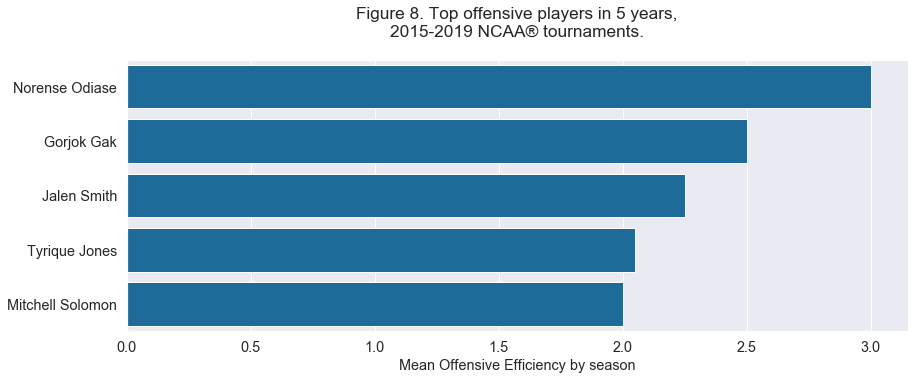

Norense Odiase, team Texas Tech
Gorjok Gak, team Florida
Jalen Smith, team Maryland
Tyrique Jones, team Xavier
Mitchell Solomon, team Oklahoma St


In [151]:
import matplotlib.patches as patches
from matplotlib.offsetbox import (OffsetImage, AnnotationBbox)

plt.figure(figsize=(14,5))

df = players_season.groupby(['EventPlayerID',
                 'FirstName',
                 'LastName'], as_index=False).mean().sort_values('OE', ascending=False)


sns.barplot(y=df["FirstName"][:5] + " " + df["LastName"][:5],
            x='OE', data = df[:5], color="#0A6FAC", orient='h')

plt.xlabel("Mean Offensive Efficiency by season")
plt.title("Figure 8. Top offensive players in 5 years,\n2015-2019 NCAA® tournaments.\n")

save_plot()
plt.show()


# Some players have equal names (e.g. Chris Harris Jr.) so we need to see the team list:
for index, row in df[:5].iterrows():
    # from this df:
    player_id = df['EventPlayerID'][index]
    firstname = df['FirstName'][index]
    lastname = df['LastName'][index]
    
    # from external dfs:
    team_id = MPlayers.loc[MPlayers['EventPlayerID'] == player_id, 'EventTeamID'].values[0]
    team_name = MTeams.loc[MTeams['TeamID'] == team_id, 'TeamName'].values[0]
    
    print("{} {}, team {}".format(firstname,
                                  lastname,
                                  team_name))

### Mean per game player stats

Note that we decided not to include following plots to the [Results](#III.-Results) section as we found them not enough innovative, but we will keep them in our study for the reader's independent exploration.

**Calculate mean per game stats**

We already have summary events per game, now we will group by player and calculate mean:

In [152]:
mean_per_game = sum_per_game_tourney_MEvents.groupby(['EventPlayerID',
                             'FirstName',
                             'LastName'], as_index=False).mean()

mean_per_game

,EventPlayerID,FirstName,LastName,assist,block,foul,fouled,jumpb,made1,made2,...,timeout,turnover,Season,DayNum,WTeamID,LTeamID,OREB,DREB,FGM,FGA
0,2,Tobias,Cameron,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,2019.0,136.0,1246.0,1101.0,0.0,0.0,0.0,0.0
1,3,Chase,Cobb,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,2019.0,136.0,1246.0,1101.0,0.0,0.0,0.0,0.0
2,6,Damien,Daniels,1.0,0.0,3.0,2.0,0.0,1.0,0.0,...,0.0,2.0,2019.0,136.0,1246.0,1101.0,0.0,3.0,0.0,5.0
3,7,Hayden,Farquhar,1.0,0.0,3.0,0.0,1.0,0.0,1.0,...,0.0,0.0,2019.0,136.0,1246.0,1101.0,0.0,0.0,3.0,7.0
4,9,Jaylen,Franklin,3.0,1.0,2.0,4.0,0.0,0.0,3.0,...,0.0,1.0,2019.0,136.0,1246.0,1101.0,0.0,0.0,4.0,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2669,15474,Justin,Sears,2.5,1.0,3.5,0.0,0.0,2.5,5.5,...,0.0,3.5,2016.0,137.0,1322.0,1293.5,4.0,3.5,6.0,9.5
2670,15475,Brandon,Sherrod,1.0,0.5,2.0,0.0,0.0,3.0,6.5,...,0.0,1.5,2016.0,137.0,1322.0,1293.5,2.5,4.0,6.5,10.0
2671,15476,Azar,Swain,0.0,0.0,3.0,2.0,0.0,4.0,1.0,...,0.0,0.0,2019.0,136.0,1261.0,1463.0,0.0,5.0,3.0,9.0
2672,15478,Nick,Victor,0.5,2.0,3.5,0.0,0.0,1.0,0.5,...,0.0,3.0,2016.0,137.0,1322.0,1293.5,2.0,5.0,1.0,6.0


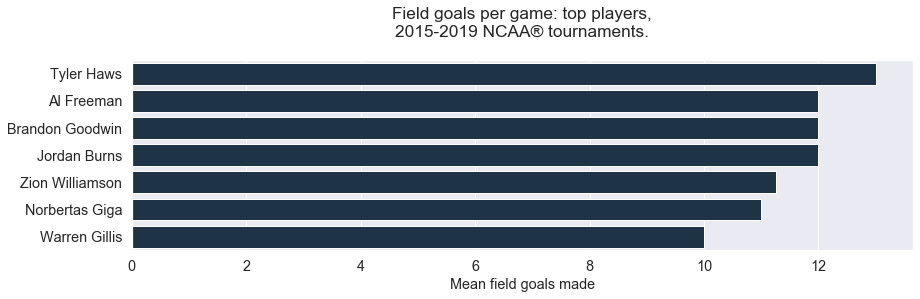

Tyler Haws, team BYU
Al Freeman, team NC State
Brandon Goodwin, team FL Gulf Coast
Jordan Burns, team Colgate
Zion Williamson, team Duke
Norbertas Giga, team Jacksonville St
Warren Gillis, team Coastal Car


In [153]:
plt.figure(figsize=(14,3.5))

df = mean_per_game.sort_values('FGM', ascending=False)


sns.barplot(y=df["FirstName"][:7] + " " + df["LastName"][:7],
            x='FGM', data = df[:7], color=colors[1], orient='h')

plt.xlabel("Mean field goals made")
plt.title("Field goals per game: top players,\n2015-2019 NCAA® tournaments.\n")

plt.show()


# Some players have equal names (e.g. Chris Harris Jr.) so we need to see the team list:   
for index, row in df[:7].iterrows():
    # from this df:
    player_id = df['EventPlayerID'][index]
    firstname = df['FirstName'][index]
    lastname = df['LastName'][index]
    
    # from external dfs:
    team_id = MPlayers.loc[MPlayers['EventPlayerID'] == player_id, 'EventTeamID'].values[0]
    team_name = MTeams.loc[MTeams['TeamID'] == team_id, 'TeamName'].values[0]
    
    print("{} {}, team {}".format(firstname,
                                  lastname,
                                  team_name))

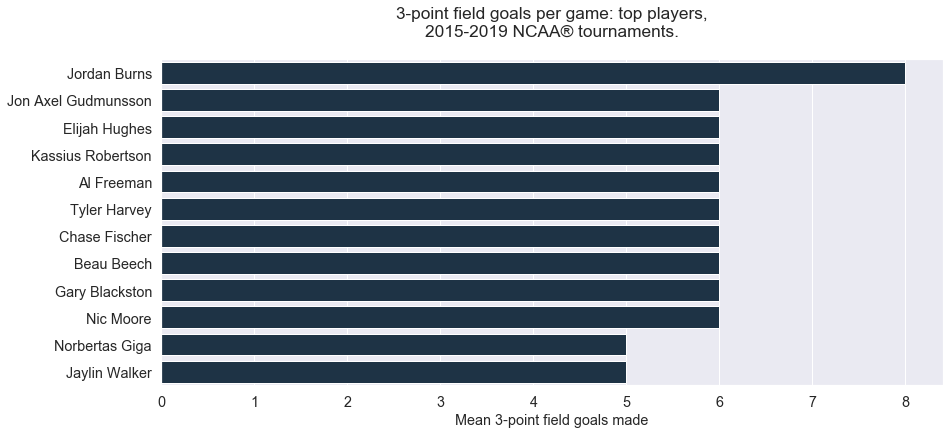

Jordan Burns, team Colgate
Jon Axel Gudmunsson, team Davidson
Elijah Hughes, team Syracuse
Kassius Robertson, team Missouri
Al Freeman, team NC State
Tyler Harvey, team E Washington
Chase Fischer, team BYU
Beau Beech, team North Florida
Gary Blackston, team Prairie View
Nic Moore, team SMU


In [154]:
plt.figure(figsize=(14,6))

df = mean_per_game.sort_values('made3', ascending=False)


sns.barplot(y=df["FirstName"][:12] + " " + df["LastName"][:12],
            x='made3', data = df[:12], color=colors[1], orient='h')

plt.xlabel("Mean 3-point field goals made")
plt.title("3-point field goals per game: top players,\n2015-2019 NCAA® tournaments.\n")

plt.show()


# Some players have equal names (e.g. Chris Harris Jr.) so we need to see the team list:   
for index, row in df[:10].iterrows():
    # from this df:
    player_id = df['EventPlayerID'][index]
    firstname = df['FirstName'][index]
    lastname = df['LastName'][index]
    
    # from external dfs:
    team_id = MPlayers.loc[MPlayers['EventPlayerID'] == player_id, 'EventTeamID'].values[0]
    team_name = MTeams.loc[MTeams['TeamID'] == team_id, 'TeamName'].values[0]
    
    print("{} {}, team {}".format(firstname,
                                  lastname,
                                  team_name))

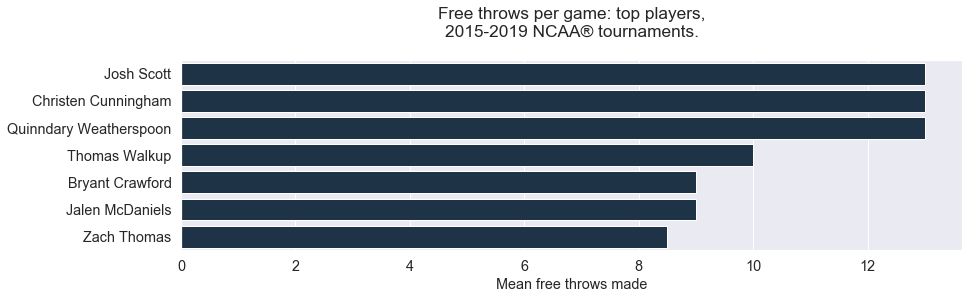

Josh Scott, team Colorado
Christen Cunningham, team Louisville
Quinndary Weatherspoon, team Mississippi St
Thomas Walkup, team SF Austin
Bryant Crawford, team Wake Forest
Jalen McDaniels, team San Diego St
Zach Thomas, team Bucknell


In [155]:
plt.figure(figsize=(14,3.5))

df = mean_per_game.sort_values('made1', ascending=False)


sns.barplot(y=df["FirstName"][:7] + " " + df["LastName"][:7],
            x='made1', data = df[:7], color=colors[1], orient='h')

plt.xlabel("Mean free throws made")
plt.title("Free throws per game: top players,\n2015-2019 NCAA® tournaments.\n")

plt.show()


# Some players have equal names (e.g. Chris Harris Jr.) so we need to see the team list:   
for index, row in df[:7].iterrows():
    # from this df:
    player_id = df['EventPlayerID'][index]
    firstname = df['FirstName'][index]
    lastname = df['LastName'][index]
    
    # from external dfs:
    team_id = MPlayers.loc[MPlayers['EventPlayerID'] == player_id, 'EventTeamID'].values[0]
    team_name = MTeams.loc[MTeams['TeamID'] == team_id, 'TeamName'].values[0]
    
    print("{} {}, team {}".format(firstname,
                                  lastname,
                                  team_name))

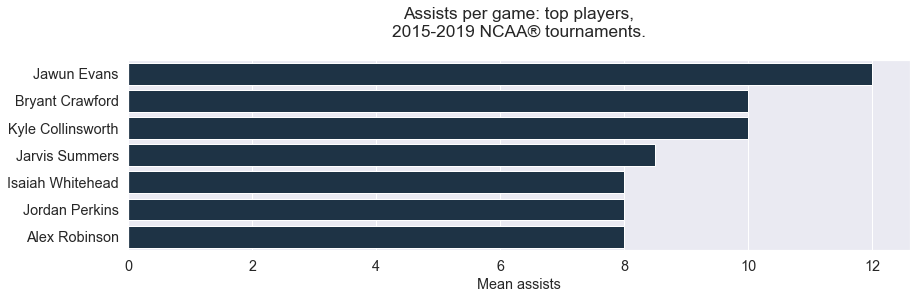

Jawun Evans, team Oklahoma St
Bryant Crawford, team Wake Forest
Kyle Collinsworth, team BYU
Jarvis Summers, team Mississippi
Isaiah Whitehead, team Seton Hall
Jordan Perkins, team NC Central
Alex Robinson, team TCU


In [156]:
plt.figure(figsize=(14,3.5))

df = mean_per_game.sort_values('assist', ascending=False)


sns.barplot(y=df["FirstName"][:7] + " " + df["LastName"][:7],
            x='assist', data = df[:7], color=colors[1], orient='h')

plt.xlabel("Mean assists")
plt.title("Assists per game: top players,\n2015-2019 NCAA® tournaments.\n")

plt.show()


# Some players have equal names (e.g. Chris Harris Jr.) so we need to see the team list:   
for index, row in df[:7].iterrows():
    # from this df:
    player_id = df['EventPlayerID'][index]
    firstname = df['FirstName'][index]
    lastname = df['LastName'][index]
    
    # from external dfs:
    team_id = MPlayers.loc[MPlayers['EventPlayerID'] == player_id, 'EventTeamID'].values[0]
    team_name = MTeams.loc[MTeams['TeamID'] == team_id, 'TeamName'].values[0]
    
    print("{} {}, team {}".format(firstname,
                                  lastname,
                                  team_name))

### Defensive leaders

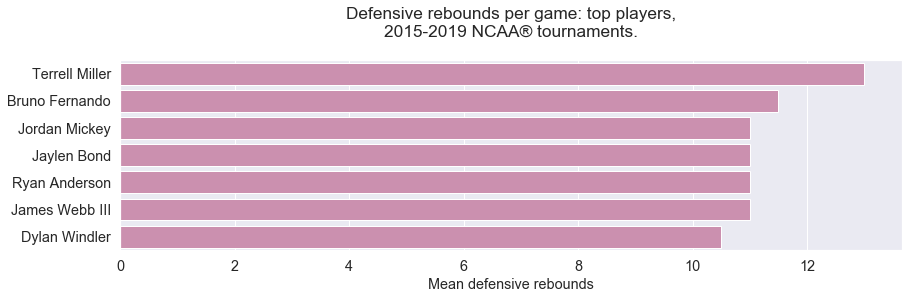

Terrell Miller, team Murray St
Bruno Fernando, team Maryland
Jordan Mickey, team LSU
Jaylen Bond, team Temple
Ryan Anderson, team Arizona
James Webb III, team Boise St
Dylan Windler, team Belmont


In [157]:
plt.figure(figsize=(14,3.5))

df = mean_per_game.sort_values('DREB', ascending=False)


sns.barplot(y=df["FirstName"][:7] + " " + df["LastName"][:7],
            x='DREB', data = df[:7], color=colors[0], orient='h')

plt.xlabel("Mean defensive rebounds")
plt.title("Defensive rebounds per game: top players,\n2015-2019 NCAA® tournaments.\n")

plt.show()


# Some players have equal names (e.g. Chris Harris Jr.) so we need to see the team list:   
for index, row in df[:7].iterrows():
    # from this df:
    player_id = df['EventPlayerID'][index]
    firstname = df['FirstName'][index]
    lastname = df['LastName'][index]
    
    # from external dfs:
    team_id = MPlayers.loc[MPlayers['EventPlayerID'] == player_id, 'EventTeamID'].values[0]
    team_name = MTeams.loc[MTeams['TeamID'] == team_id, 'TeamName'].values[0]
    
    print("{} {}, team {}".format(firstname,
                                  lastname,
                                  team_name))

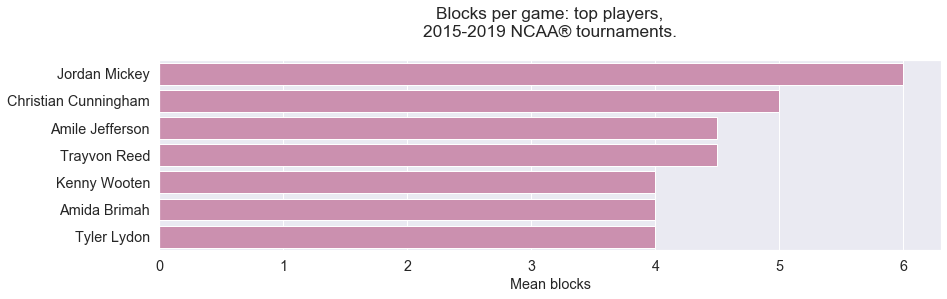

Jordan Mickey, team LSU
Christian Cunningham, team Jacksonville St
Amile Jefferson, team Duke
Trayvon Reed, team TX Southern
Kenny Wooten, team Oregon
Amida Brimah, team Connecticut
Tyler Lydon, team Syracuse


In [158]:
plt.figure(figsize=(14,3.5))

df = mean_per_game.sort_values('block', ascending=False)


sns.barplot(y=df["FirstName"][:7] + " " + df["LastName"][:7],
            x='block', data = df[:7], color=colors[0], orient='h')

plt.xlabel("Mean blocks")
plt.title("Blocks per game: top players,\n2015-2019 NCAA® tournaments.\n")

plt.show()

# Some players have equal names (e.g. Chris Harris Jr.) so we need to see the team list:   
for index, row in df[:7].iterrows():
    # from this df:
    player_id = df['EventPlayerID'][index]
    firstname = df['FirstName'][index]
    lastname = df['LastName'][index]
    
    # from external dfs:
    team_id = MPlayers.loc[MPlayers['EventPlayerID'] == player_id, 'EventTeamID'].values[0]
    team_name = MTeams.loc[MTeams['TeamID'] == team_id, 'TeamName'].values[0]
    
    print("{} {}, team {}".format(firstname,
                                  lastname,
                                  team_name))

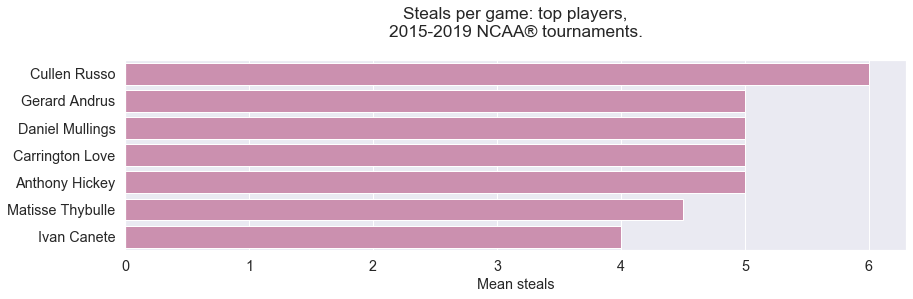

Cullen Russo, team Fresno St
Gerard Andrus, team Prairie View
Daniel Mullings, team New Mexico St
Carrington Love, team WI Green Bay
Anthony Hickey, team Oklahoma St


In [159]:
plt.figure(figsize=(14,3.5))

df = mean_per_game.sort_values('steal', ascending=False)


sns.barplot(y=df["FirstName"][:7] + " " + df["LastName"][:7],
            x='steal', data = df[:7], color=colors[0], orient='h')

plt.xlabel("Mean steals")
plt.title("Steals per game: top players,\n2015-2019 NCAA® tournaments.\n")

plt.show()

# Some players have equal names (e.g. Chris Harris Jr.) so we need to see the team list:   
for index, row in df[:5].iterrows():
    # from this df:
    player_id = df['EventPlayerID'][index]
    firstname = df['FirstName'][index]
    lastname = df['LastName'][index]
    
    # from external dfs:
    team_id = MPlayers.loc[MPlayers['EventPlayerID'] == player_id, 'EventTeamID'].values[0]
    team_name = MTeams.loc[MTeams['TeamID'] == team_id, 'TeamName'].values[0]
    
    print("{} {}, team {}".format(firstname,
                                  lastname,
                                  team_name))

---
#### Add team categories to our MEvents dataframe

In [160]:
# First add regular season and tournaments together:
labeled_CompactResults = pd.concat([labeled_MRegularSeasonCompactResults, labeled_MNCAATourneyCompactResults],
                                   ignore_index=True)

cols = ['Season', 'DayNum', 'WTeamID', 'LTeamID']
# Next, add this data to our MEvents:
labeled_MEvents = MEvents.join(labeled_CompactResults.set_index(cols),
                               on=cols,
                               how='inner')

labeled_MEvents

,EventID,Season,DayNum,WTeamID,LTeamID,WFinalScore,LFinalScore,WCurrentScore,LCurrentScore,ElapsedSeconds,...,WLoc,NumOT,Scoring margin,Cinderella,Top,LABEL,Round,NumRound,Seed,SeedNo
0,1,2015,11,1103,1420,74,57,0,0,19,...,H,0,17,0.0,0.0,Ordinary,NaN,NaN,NaN,NaN
1,2,2015,11,1103,1420,74,57,0,0,19,...,H,0,17,0.0,0.0,Ordinary,NaN,NaN,NaN,NaN
2,3,2015,11,1103,1420,74,57,0,2,27,...,H,0,17,0.0,0.0,Ordinary,NaN,NaN,NaN,NaN
3,4,2015,11,1103,1420,74,57,0,2,27,...,H,0,17,0.0,0.0,Ordinary,NaN,NaN,NaN,NaN
4,5,2015,11,1103,1420,74,57,2,2,59,...,H,0,17,0.0,0.0,Ordinary,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13154589,13154590,2019,154,1438,1403,85,77,9,3,424,...,N,1,8,0.0,1.0,Top,National Final,6.0,Z01,1.0
13154590,13154591,2019,154,1438,1403,85,77,9,3,424,...,N,1,8,0.0,1.0,Top,National Final,6.0,Z01,1.0
13154591,13154592,2019,154,1438,1403,85,77,9,3,424,...,N,1,8,0.0,1.0,Top,National Final,6.0,Z01,1.0
13154592,13154593,2019,154,1438,1403,85,77,9,3,424,...,N,1,8,0.0,1.0,Top,National Final,6.0,Z01,1.0


In [161]:
labeled_MEvents['EventSubType'] = labeled_MEvents['EventSubType'].fillna(labeled_MEvents['EventType'])
labeled_MEvents = labeled_MEvents[labeled_MEvents.EventSubType != "unk"]

labeled_MEvents['EventType'].replace({"made1": "free throw made",
                                      "miss1": "free throw missed"}, inplace=True) 

labeled_MEvents['EventSubType'].replace({"1of1": "1 of 1",
                                         "1of2": "1 of 2",
                                         "2of2": "2 of 2",
                                         "1of3": "1 of 3",
                                         "2of3": "2 of 3",
                                         "3of3": "3 of 3"}, inplace=True) 

labeled_MEvents.sample(3)

,EventID,Season,DayNum,WTeamID,LTeamID,WFinalScore,LFinalScore,WCurrentScore,LCurrentScore,ElapsedSeconds,...,WLoc,NumOT,Scoring margin,Cinderella,Top,LABEL,Round,NumRound,Seed,SeedNo
8523327,8523328,2018,39,1113,1385,82,70,71,67,2208,...,N,0,12,0.0,0.0,Ordinary,NaN,NaN,NaN,NaN
11967266,11967267,2019,79,1345,1326,79,67,64,58,1928,...,A,0,12,0.0,1.0,Top,NaN,NaN,NaN,NaN
9411492,9411493,2018,85,1328,1242,85,80,37,29,968,...,H,0,5,0.0,0.0,Ordinary,NaN,NaN,NaN,NaN


### What is the foul and turnover structure for Cinderella teams?

In [162]:
labeled_MEvents[labeled_MEvents.EventType.isin(['turnover', 'foul'])].LABEL.value_counts()

Ordinary      129182
Top            13454
Cinderella      1251
Name: LABEL, dtype: int64

In [163]:
fig = go.Figure()

parent_col = 'EventType'
child_col = 'EventSubType'
value_col = 'EventID'

i=0
for label in order:
    
    center_label = label
    
    df = labeled_MEvents[labeled_MEvents.LABEL == label]
    df = df[df.EventType.isin(['turnover', 'foul'])]
    df = df.groupby([parent_col, child_col], as_index=False).count()[[parent_col, child_col, value_col]]

    # We need unique ids for repeated labels:
    child_ids = list(df[parent_col] + " - " + df[child_col]) 
    
    # Calculate values for parents:
    parent_sums = [df[value_col].sum()] # first value is the sum of all rows
    for parent in list(df[parent_col].unique()): # for each parent
        parent_sums.append(df[df[parent_col] == parent][value_col].sum()) # add sum values 
    
    # Show final chart:
    fig.add_trace(go.Sunburst(
          ids = [center_label] + list(df[parent_col].unique()) + child_ids,
          labels = [center_label] + list(df[parent_col].unique()) + list(df[child_col]),
          parents = [""] + [center_label]*df[parent_col].nunique() + list(df[parent_col]),
          values = parent_sums + list(df[value_col]),
          textinfo='label+percent parent',
          branchvalues="total",
    domain=dict(column=i)))
    
    i+=1

fig.update_layout(
    grid= dict(columns=3, rows=1),
    margin = dict(t=0, l=0, r=0, b=0),
    uniformtext=dict(minsize=10, mode='hide')
)

fig.update_layout(
    annotations=[
        dict(
            x=0.5,
            y=0,
            showarrow=False,
            align="center",
            text="<b>pers</b> - personal foul | <b>off</b> - offensive foul<br>\
<b>bpass</b> - bad pass turnover | <b>lostb</b> - lost ball | <b>offen</b> - offensive turnover | \
<b>trav</b> - travelling | <b>other</b> - other type of turnover",
            xref="paper",
            yref="paper",
            font=dict(size=14),
        )
    ])


fig.update_layout(
    colorway=["#17344B","#D485AF"],
    title={
        'text': "Fouls and turnovers by subtype per team category,<br>2015-2019. Interactive graph.",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font=dict(
        family='sans-serif',
        color="#000")
)


fig.show(renderer="kaggle")
fig_9 = go.Figure(fig) # to show the same fig in the Results section

### What is the structure of free throw attempts for Cinderella teams?

In [164]:
labeled_MEvents[labeled_MEvents.EventType.isin(['free throw made', 'free throw missed'])].LABEL.value_counts()

Ordinary      70524
Top            7522
Cinderella      650
Name: LABEL, dtype: int64

In [165]:
fig = go.Figure()

parent_col = 'EventType'
child_col = 'EventSubType'
value_col = 'EventID'

i=0
for label in order:
    
    center_label = label
    
    df = labeled_MEvents[labeled_MEvents.LABEL == label]
    df = df[df.EventType.isin(['free throw made', 'free throw missed'])]
    df = df.groupby([parent_col, child_col], as_index=False).count()[[parent_col, child_col, value_col]]

    # We need unique ids for repeated labels:
    child_ids = list(df[parent_col] + " - " + df[child_col]) 
    
    # Calculate values for parents:
    parent_sums = [df[value_col].sum()] # first value is the sum of all rows
    for parent in list(df[parent_col].unique()): # for each parent
        parent_sums.append(df[df[parent_col] == parent][value_col].sum()) # add sum values 
    
    # Show final chart:
    fig.add_trace(go.Sunburst(
          ids = [center_label] + list(df[parent_col].unique()) + child_ids,
          labels = [center_label] + list(df[parent_col].unique()) + list(df[child_col]),
          parents = [""] + [center_label]*df[parent_col].nunique() + list(df[parent_col]),
          values = parent_sums + list(df[value_col]),
          textinfo='label+percent parent',
          branchvalues="total",
    domain=dict(column=i)))
    
    i+=1
    

fig.update_layout(
    grid= dict(columns=3, rows=1),
    margin = dict(t=0, l=0, r=0, b=0),
    uniformtext=dict(minsize=10, mode='hide')
)


fig.update_layout(
    colorway=["#0173B2","#DC143C"],
    title={
        'text': "Free throw attempts per team category,<br>2015-2019. Interactive graph.",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font=dict(
        family='sans-serif',
        color="#000")
)


fig.show(renderer="kaggle")
fig_4 = go.Figure(fig) # to show the same fig in the Results section


seasons = list(labeled_MEvents['Season'].unique())

df = labeled_double_MRegularSeasonDetailedResults[labeled_double_MRegularSeasonDetailedResults.Season.isin(seasons)]
cinderella_vs_ordinary(df, "played", "regular season of 2015-2019", "FTA")
cinderella_vs_ordinary(df, "played", "regular season of 2015-2019", "FTM")

df = labeled_double_MNCAATourneyDetailedResults[labeled_double_MNCAATourneyDetailedResults.Season.isin(seasons)]
cinderella_vs_ordinary(df, "played", "tournaments of 2015-2019", "FTA")
cinderella_vs_ordinary(df, "played", "tournaments of 2015-2019", "FTM")


In 56% of games played in tournaments of 2015-2019, Cinderella teams had less than 17.0 FTA (mean: 16.56, median: 16.0) vs. 47% of games for the Ordinary teams (mean: 17.93, median: 17.0).

In 56% of games played in tournaments of 2015-2019, Cinderella teams had less than 13.0 FTM (mean: 11.78, median: 12.0) vs. 49% of games for the Ordinary teams (mean: 12.89, median: 13.0).


---

## 2.6. Public Rankings, 2003-2020

**Data Section 4 file: MMasseyOrdinals.csv** - this file lists out rankings (e.g. 1, 2, 3, ..., N) of teams going back to the 2002-2003 season, under a large number of different ranking system methodologies. By convention, the final pre-tournament rankings are always expressed as RankingDayNum=133, even though sometimes the rankings for individual systems are not released until Tuesday (DayNum=134) or even Wednesday or Thursday [[1]](#References).

In [166]:
MMasseyOrdinals = None
MMasseyOrdinals = load_file(MMasseyOrdinals, 'MMasseyOrdinals')

File: MMasseyOrdinals
Num rows: 4120886
NaN values: 0
Duplicated rows: 0
         Season  RankingDayNum SystemName  TeamID  OrdinalRank
0          2003             35        SEL    1102          159
1          2003             35        SEL    1103          229
2          2003             35        SEL    1104           12
4120884    2020            128        WOL    1466          290
4120885    2020            128        WOL    1467          165


**Filter out tournament teams**

Only include rows if both season and team ID is present in the tourney data:

In [167]:
MMasseyOrdinals = MMasseyOrdinals[(MMasseyOrdinals['Season'].isin(MNCAATourneyCompactResults['Season']) & 
                                  (MMasseyOrdinals['TeamID'].isin(MNCAATourneyCompactResults['WTeamID'])))]
MMasseyOrdinals

,Season,RankingDayNum,SystemName,TeamID,OrdinalRank
2,2003,35,SEL,1104,12
5,2003,35,SEL,1107,249
9,2003,35,SEL,1112,26
10,2003,35,SEL,1113,89
11,2003,35,SEL,1114,110
...,...,...,...,...,...
3820910,2019,133,ZAM,1458,13
3820911,2019,133,ZAM,1459,21
3820913,2019,133,ZAM,1461,298
3820914,2019,133,ZAM,1462,70


**Add the labels - Ordinary, Cinderella and Top**

In [168]:
cols = ['Season', 'TeamID']

labeled_MMasseyOrdinals = MMasseyOrdinals.join(cinderellas.set_index(cols), on=cols)
labeled_MMasseyOrdinals = labeled_MMasseyOrdinals.join(top_seeded.set_index(cols), on=cols)

# Create a categorical LABEL column:
label = labeled_MMasseyOrdinals[['Cinderella', 'Top']]
label = pd.DataFrame(label.idxmax(1))
labeled_MMasseyOrdinals['LABEL'] = label

# Fill in the missing values:
labeled_MMasseyOrdinals['LABEL'] = labeled_MMasseyOrdinals['LABEL'].fillna("Ordinary")

# Fill in the missing values:
labeled_MMasseyOrdinals['Cinderella'] = labeled_MMasseyOrdinals['Cinderella'].fillna(0) # not a cinderella
labeled_MMasseyOrdinals['Top'] = labeled_MMasseyOrdinals['Top'].fillna(0) # not a top

assert len(labeled_MMasseyOrdinals) == len(MMasseyOrdinals)

labeled_MMasseyOrdinals

,Season,RankingDayNum,SystemName,TeamID,OrdinalRank,Cinderella,Top,LABEL
2,2003,35,SEL,1104,12,0.0,0.0,Ordinary
5,2003,35,SEL,1107,249,0.0,0.0,Ordinary
9,2003,35,SEL,1112,26,0.0,1.0,Top
10,2003,35,SEL,1113,89,0.0,0.0,Ordinary
11,2003,35,SEL,1114,110,0.0,0.0,Ordinary
...,...,...,...,...,...,...,...,...
3820910,2019,133,ZAM,1458,13,0.0,0.0,Ordinary
3820911,2019,133,ZAM,1459,21,0.0,0.0,Ordinary
3820913,2019,133,ZAM,1461,298,0.0,0.0,Ordinary
3820914,2019,133,ZAM,1462,70,0.0,0.0,Ordinary


How many rows per each category?

In [169]:
labeled_MMasseyOrdinals.LABEL.value_counts()

Ordinary      2099695
Top            123559
Cinderella      22784
Name: LABEL, dtype: int64

### What is the mean ranking for Cinderella teams?

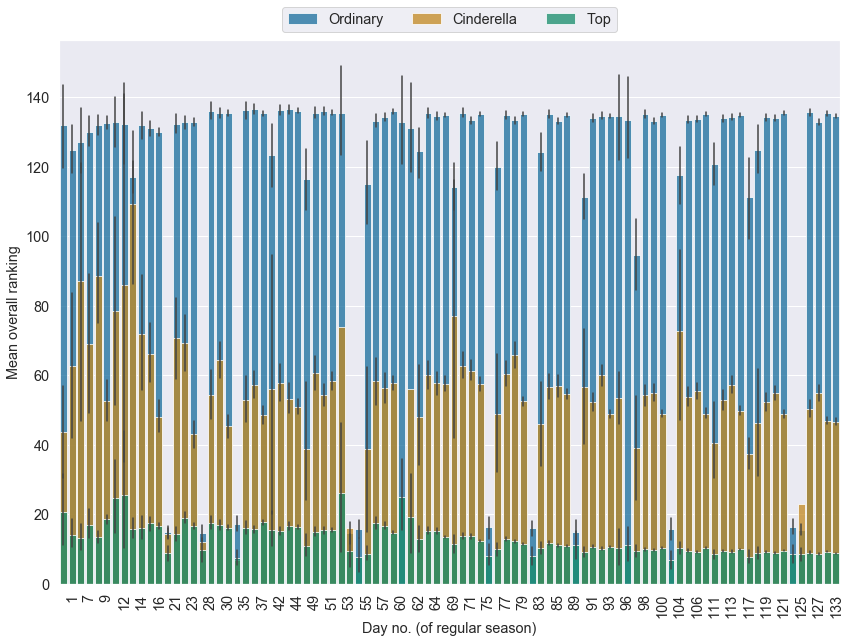

In [170]:
df = labeled_MMasseyOrdinals

# Make plot:
sns.barplot(df['RankingDayNum'], df['OrdinalRank'], hue=df['LABEL'],
            hue_order=order, dodge=False, errwidth=1.5, alpha=0.75)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.075), ncol=3, fancybox=True)

plt.xlabel("Day no. (of regular season)")
plt.ylabel("Mean overall ranking")

# Fewer x ticks:
for tick_label in plt.gca().xaxis.get_ticklabels()[::2]:
    tick_label.set_visible(False)
    
plt.xticks(rotation=90)

plt.show()

Some bars look odd, checking why:

In [171]:
print(labeled_MMasseyOrdinals[labeled_MMasseyOrdinals.RankingDayNum == 20].LABEL.value_counts())
print("\n")
print(labeled_MMasseyOrdinals[labeled_MMasseyOrdinals.RankingDayNum == 20].SystemName.value_counts())
print("\n")
print(labeled_MMasseyOrdinals[labeled_MMasseyOrdinals.RankingDayNum == 20].OrdinalRank.describe())

Ordinary      66
Top           32
Cinderella     2
Name: LABEL, dtype: int64


DES    100
Name: SystemName, dtype: int64


count    100.000000
mean      13.000000
std        7.247431
min        1.000000
25%        7.000000
50%       13.000000
75%       19.000000
max       25.000000
Name: OrdinalRank, dtype: float64


In [172]:
print(labeled_MMasseyOrdinals[labeled_MMasseyOrdinals.RankingDayNum == 96].LABEL.value_counts())
print("\n")
print(labeled_MMasseyOrdinals[labeled_MMasseyOrdinals.RankingDayNum == 96].SystemName.value_counts())
print("\n")
print(labeled_MMasseyOrdinals[labeled_MMasseyOrdinals.RankingDayNum == 96].OrdinalRank.describe())

Ordinary    190
Top          11
Name: LABEL, dtype: int64


BIH    201
Name: SystemName, dtype: int64


count    201.000000
mean     126.646766
std       87.230497
min        1.000000
25%       53.000000
50%      114.000000
75%      194.000000
max      328.000000
Name: OrdinalRank, dtype: float64


In [173]:
labeled_MMasseyOrdinals.SystemName.nunique()

174

In [174]:
def ranking_comparison(df, lower, upper):
    '''Compare Cinderella team rankings vs. other team categories'''

    df_top = df[df.LABEL == 'Top']
    df_cinderella = df[df.LABEL == 'Cinderella']
    df_ordinary = df[df.LABEL == 'Ordinary']

    total_top_games = len(df_top)
    total_cinderella_games = len(df_cinderella)
    total_ordinary_games = len(df_ordinary)


    between_medians_top = len(df_top[(df_top.OrdinalRank > lower) &
                                     (df_top.OrdinalRank < upper)])

    between_medians_cinderella = len(df_cinderella[(df_cinderella.OrdinalRank > lower) &
                                                   (df_cinderella.OrdinalRank < upper)])

    between_medians_ordinary = len(df_ordinary[(df_ordinary.OrdinalRank > lower) &
                                               (df_ordinary.OrdinalRank < upper)])

    share = between_medians_cinderella/total_cinderella_games
    share_top = between_medians_top/total_top_games
    share_ordinary = between_medians_ordinary/total_ordinary_games

    if share > 0.51:
        share_str = '{:.0%}'.format(share)
        share_top_str = '{:.0%}'.format(share_top)
        share_ordinary_str = '{:.0%}'.format(share_ordinary)

    return share_str, share_top_str, share_ordinary_str

Final figure to include in the [Results](#III.-Results):

2003-2019
File nr. 12


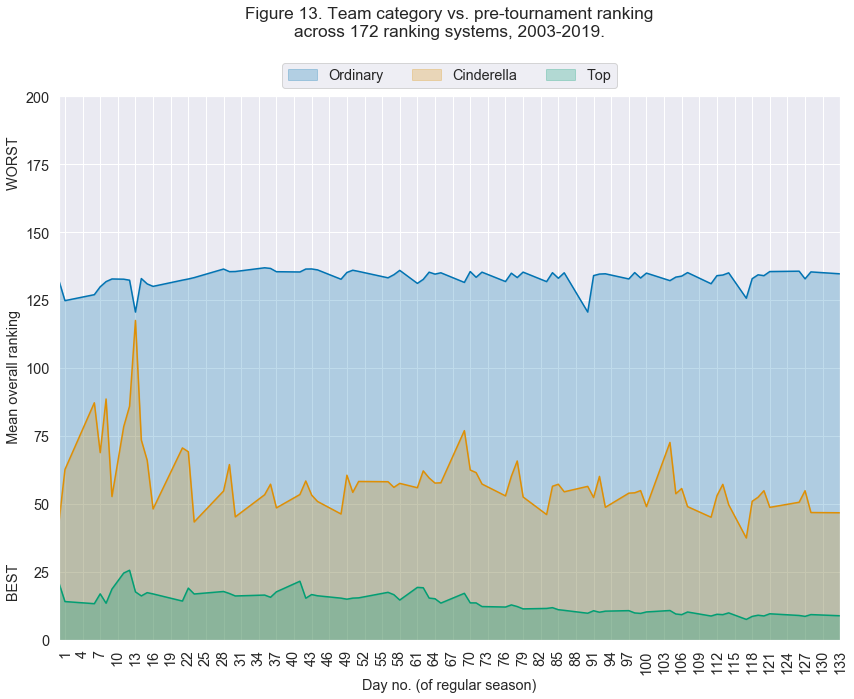

Descriptive statistics for file nr. 12:

Ordinary: median rank: 134, mean: 133.33.
Cinderella: median rank: 55, mean: 58.06.
Top: median rank: 13, mean: 13.78.

In 81% public rankings (of 172 ranking systems) in 2003-2019, Cinderella teams were ranked between 20 and 80 vs. 15% for the Top and 27% for Ordinary teams.


In [175]:
df = labeled_MMasseyOrdinals[~labeled_MMasseyOrdinals.SystemName.isin(["DES", "BIH"])]
print(f'{df.Season.min()}-{df.Season.max()}')

system_cnt = df.SystemName.nunique()

df = df.groupby(['LABEL', 'RankingDayNum'], as_index=False).mean()

i=0
for label in order:

    plot_df = df[df.LABEL == label].sort_values(by='RankingDayNum')

    plt.plot(plot_df['RankingDayNum'], plot_df['OrdinalRank'])
    plt.fill_between(plot_df['RankingDayNum'], plot_df['OrdinalRank'], color=label_colors[i],
                     alpha=0.25, label=label)
    i+=1

plt.ylim(0, 200)
plt.gca().margins(0)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.075), ncol=3, fancybox=True)

plt.xticks(np.arange(1, 134, 3))
plt.xticks(rotation=90)

plt.xlabel("Day no. (of regular season)")

plt.ylabel("BEST" + " "*30 + "Mean overall ranking" + " "*30 + "WORST")

plt.title("Figure 13. Team category vs. pre-tournament ranking\nacross {} ranking systems, 2003-2019.".format(system_cnt), y=1.1)

save_plot()
plt.show()


print("Descriptive statistics for file nr. {}:\n".format(str(file_nr-1)))
for label in order:
    print("{}: median rank: {}, mean: {}.".format(label, int(df[df.LABEL == label]['OrdinalRank'].median()),
                                                  round(df[df.LABEL == label]['OrdinalRank'].mean(), 2)))

share_str, share_top_str, share_ordinary_str = ranking_comparison(labeled_MMasseyOrdinals, 20, 80) 
print(f'\nIn {share_str} public rankings (of 172 ranking systems) in 2003-2019,'
      f' Cinderella teams were ranked between 20'
      f' and 80 vs. {share_top_str} for the Top and {share_ordinary_str} for Ordinary teams.')

---
**Narrow down to 5 popular rating systems** - Pomeroy (POM), Sagarin (SAG), RPI (RPI), ESPN BPI (EBP) and ESPN SOR (ESR)

The description of each system will be included in the [Results](#III.-Results) section.

In [176]:
labeled_MMasseyOrdinals_five = labeled_MMasseyOrdinals[labeled_MMasseyOrdinals['SystemName'].isin(['POM', 'SAG', 'RPI', 'EBP', 'ESR'])]
labeled_MMasseyOrdinals_five.SystemName.value_counts()

SAG    61791
POM    59770
RPI    36812
EBP    19993
ESR     4444
Name: SystemName, dtype: int64

### How are the rankings distributed per each rating system?

In [177]:
subplot_titles=['Pomeroy', 'RPI', 'Sagarin', 'ESPN BPI', 'ESPN SOR']

fig = make_subplots(rows=5, cols=1,
                    shared_xaxes=True, subplot_titles=subplot_titles, vertical_spacing = 0.05)

row = 1 # row nr. for subplot
for system_name in ['POM', 'SAG', 'RPI', 'EBP', 'ESR']: # Make plots for each rating system:

    i = 0
    for label in order: # 'Ordinary', 'Cinderella', 'Top'
        
        df = labeled_MMasseyOrdinals_five[labeled_MMasseyOrdinals_five.LABEL == label]
        print(f'{df.Season.min()}-{df.Season.max()}' + " "*100, end="\r", flush=True)
        df = df[df.SystemName == system_name]
                
        fig.add_trace(
            go.Box(x=df['OrdinalRank'],
                   name=label,
                   marker_color=sns.color_palette("colorblind").as_hex()[i],
                   boxmean=True, # represent mean
                   boxpoints="suspectedoutliers",
                   visible=True), 
            row=row, col=1)
               
        i+=1
    
    row+=1 # go to next subplot

        
fig.update_layout(showlegend=False, # hide ledend
                 width=plotly_width, height=800) # set size

# Set axis font:
fig.update_yaxes(tickfont=dict(size=14))

# Add titles:
fig.update_xaxes(title_text='Overall ranking from best to worst', row=5, col=1)


# Plot title:
fig.update_layout(
    title={
        'text': "Team category vs. pre-tournament ranking distribution,<br>2003-2019. Interactive graph.",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    font=dict(
        family='sans-serif',
        color="#000"),
    margin=dict(t=120), # margin between title and plot
    boxgap=0.35,
    boxgroupgap=0
)


fig.show(renderer="kaggle")
fig_11 = go.Figure(fig) # to show the same fig in the Results section


share_str, share_top_str, share_ordinary_str = ranking_comparison(labeled_MMasseyOrdinals_five, 20, 80) 

print(f'In {share_str} public rankings of Pomeroy, RPI, Sagarin, ESPN BPI and ESPN SOR in 2003-2019,'
      ' Cinderella teams were ranked between 20'
      f' and 80 vs. {share_top_str} for the Top and {share_ordinary_str} for Ordinary teams.')

In 83% public rankings of Pomeroy, RPI, Sagarin, ESPN BPI and ESPN SOR in 2003-2019, Cinderella teams were ranked between 20 and 80 vs. 17% for the Top and 27% for Ordinary teams.


### What is the average pre-tournament ranking per each season?

Filter out final pre-tournament rankings released before the play-in games:

2003-2019
File nr. 13


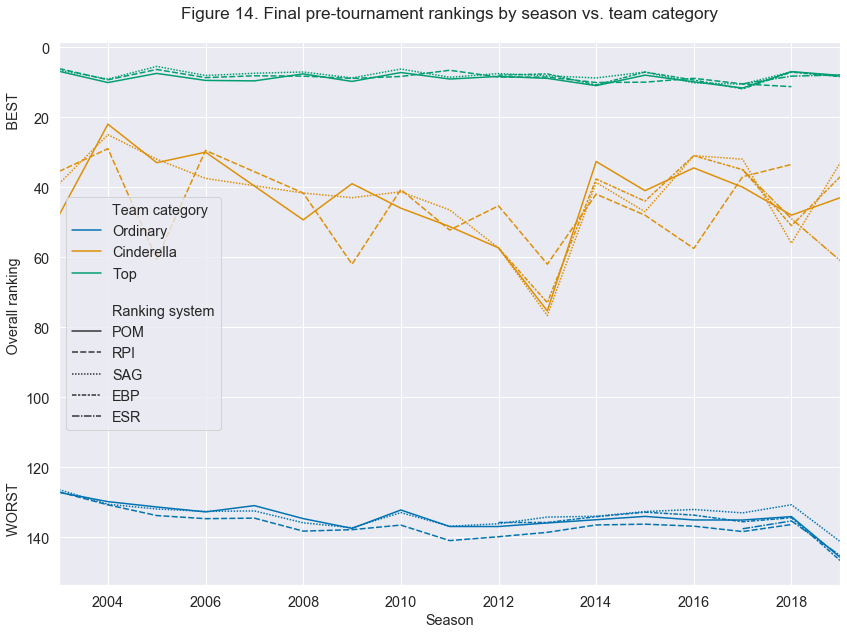

In 71% of final pre-tournament rankings in 2003-2019, Cinderella teams were ranked between 20 and 65 vs. 16% for the Top and 21% for Ordinary teams.


count       mean        std   min    25%   50%    75%  \
Season SystemName                                                          
2003   POM           2.0  48.000000   4.242641  45.0  46.50  48.0  49.50   
       RPI           2.0  35.500000   0.707107  35.0  35.25  35.5  35.75   
       SAG           2.0  39.000000   5.656854  35.0  37.00  39.0  41.00   
2004   POM           1.0  22.000000        NaN  22.0  22.00  22.0  22.00   
       RPI           1.0  29.000000        NaN  29.0  29.00  29.0  29.00   
       SAG           1.0  25.000000        NaN  25.0  25.00  25.0  25.00   
2005   POM           2.0  33.000000  12.727922  24.0  28.50  33.0  37.50   
       RPI           2.0  60.500000   3.535534  58.0  59.25  60.5  61.75   
       SAG           2.0  32.000000   5.656854  28.0  30.00  32.0  34.00   
2006   POM           2.0  30.000000   2.828427  28.0  29.00  30.0  31.00   
       RPI           2.0  29.500000   4.949747  26.0  27.75  29.5  31.25   
       SAG           2.0  37.500000   0.707107  37.0  37.25  37.5  37.75   
2008   POM           3.0  49.333333  15.567059  33.0  42.00  51.0  57.50   
       RPI           3.0  41.666667   8.326664  35.0  37.00  39.0  45.00   
       SAG           3.0  41.666667  14.011900  26.0  36.00  46.0  49.50   
2009   POM           1.0  39.000000        NaN  39.0  39.00  39.0  39.00   
       RPI           1.0  62.000000        NaN  62.0  62.00  62.0  62.00   
       SAG           1.0  43.000000        NaN  43.0  43.00  43.0  43.00   
2010   POM           3.0  46.000000  18.681542  29.0  36.00  43.0  54.50   
       RPI           3.0  40.666667   5.507571  35.0  38.00  41.0  43.50   
       SAG           3.0  41.333333  11.015141  30.0  36.00  42.0  47.00   
2011   POM           4.0  51.250000  22.500000  33.0  39.75  44.0  55.50   
       RPI           4.0  52.250000   9.708244  41.0  47.00  52.0  57.25   
       SAG           4.0  46.500000  21.236761  29.0  34.25  40.0  52.25   
2012   EBP           3.0  57.333333  14.977761  45.0  49.00  53.0  63.50   
       POM           3.0  57.333333  14.011900  43.0  50.50  58.0  64.50   
       RPI           3.0  45.333333   4.041452  41.0  43.50  46.0  47.50   
       SAG           3.0  57.333333  13.650397  45.0  50.00  55.0  63.50   
2013   EBP           3.0  73.000000  52.163205  33.0  43.50  54.0  93.00   
       POM           3.0  75.333333  44.433471  43.0  50.00  57.0  91.50   
       RPI           3.0  62.000000  26.851443  46.0  46.50  47.0  70.00   
       SAG           3.0  76.666667  43.015501  47.0  52.00  57.0  91.50   
2014   EBP           3.0  37.666667   7.637626  31.0  33.50  36.0  41.00   
       POM           3.0  32.666667  20.207259  11.0  23.50  36.0  43.50   
       RPI           3.0  42.000000   1.000000  41.0  41.50  42.0  42.50   
       SAG           3.0  38.666667  17.214335  25.0  29.00  33.0  45.50   
2015   EBP           1.0  44.000000        NaN  44.0  44.00  44.0  44.00   
       POM           1.0  41.000000        NaN  41.0  41.00  41.0  41.00   
       RPI           1.0  48.000000        NaN  48.0  48.00  48.0  48.00   
       SAG           1.0  47.000000        NaN  47.0  47.00  47.0  47.00   
2016   EBP           2.0  31.000000  11.313708  23.0  27.00  31.0  35.00   
       POM           2.0  34.500000   9.192388  28.0  31.25  34.5  37.75   
       RPI           2.0  57.500000  19.091883  44.0  50.75  57.5  64.25   
       SAG           2.0  31.000000  12.727922  22.0  26.50  31.0  35.50   
2017   EBP           1.0  35.000000        NaN  35.0  35.00  35.0  35.00   
       ESR           1.0  35.000000        NaN  35.0  35.00  35.0  35.00   
       POM           1.0  40.000000        NaN  40.0  40.00  40.0  40.00   
       RPI           1.0  37.000000        NaN  37.0  37.00  37.0  37.00   
       SAG           1.0  32.000000        NaN  32.0  32.00  32.0  32.00   
2018   EBP           2.0  51.000000   1.414214  50.0  50.50  51.0  51.50   
       ESR           2.0  49.000000   1.414214  48.0  48.50  49.0  

In [178]:
df = labeled_MMasseyOrdinals_five[labeled_MMasseyOrdinals_five['RankingDayNum'] == 133]
print(f'{df.Season.min()}-{df.Season.max()}')

# plt.figure(figsize=(14,14))
sns.lineplot(x="Season", y="OrdinalRank", data=df, hue='LABEL',
             style='SystemName', hue_order=order, ci=None).set(xlim=(2003, 2019))

ax = plt.gca()
legend = ax.legend()
legend.texts[0].set_text("Team category")
legend.texts[4].set_text("\nRanking system")

ax.invert_yaxis() # to show best rating on top

plt.xlabel("Season")
plt.ylabel("WORST" + " "*32 + "Overall ranking" + " "*32 + "BEST")

plt.title("Figure 14. Final pre-tournament rankings by season vs. team category\n")

save_plot()
plt.show()


share_str, share_top_str, share_ordinary_str = ranking_comparison(labeled_MMasseyOrdinals_five, 20, 65) 

print(f'In {share_str} of final pre-tournament rankings in 2003-2019,'
      ' Cinderella teams were ranked between 20'
      f' and 65 vs. {share_top_str} for the Top and {share_ordinary_str} for Ordinary teams.')

df[df.LABEL == 'Cinderella'].groupby(['Season', 'SystemName'])['OrdinalRank'].describe()

Note how in a season of 2013 rankings were more spread out from the average. In other words, this season has the biggest standard deviation from average (EBP: 52.16, POM: 44.43, RPI: 26.85, SAG: 43.02) of the pre-tournament rankings among 3 Cinderella teams - FL Gulf Coast, La Salle and Oregon.

---

## 2.7. Prediction Experiment

Considering the above analysis, we will try to predict which team could become a Cinderella if the 2020 tournament would not be canceled.

### Data preprocessing

We believe that rankings are important for "Cinderellaness", so we will build our input data based on available rankings. This will also mean that we will not use any data before season 2003.

In [179]:
MMasseyOrdinals = load_file(MMasseyOrdinals, 'MMasseyOrdinals')

MMasseyOrdinals.SystemName.value_counts().head()

File: MMasseyOrdinals
Num rows: 4120886
NaN values: 0
Duplicated rows: 0
         Season  RankingDayNum SystemName  TeamID  OrdinalRank
0          2003             35        SEL    1102          159
1          2003             35        SEL    1103          229
2          2003             35        SEL    1104           12
4120884    2020            128        WOL    1466          290
4120885    2020            128        WOL    1467          165


SAG    111701
MOR    110711
POM    108220
DOK     94974
WLK     90347
Name: SystemName, dtype: int64

It is important to have **as many data samples as possible**, so we will use 3 ranking systems that occur most frequently in a data:

In [180]:
ml_MMasseyOrdinals = MMasseyOrdinals[MMasseyOrdinals['SystemName'].isin(['SAG', 'MOR', 'POM'])]
ml_MMasseyOrdinals

,Season,RankingDayNum,SystemName,TeamID,OrdinalRank
2641,2003,37,MOR,1102,110
2642,2003,37,MOR,1103,179
2643,2003,37,MOR,1104,13
2644,2003,37,MOR,1105,262
2645,2003,37,MOR,1106,272
...,...,...,...,...,...
4115208,2020,128,SAG,1463,85
4115209,2020,128,SAG,1464,220
4115210,2020,128,SAG,1465,179
4115211,2020,128,SAG,1466,282


In [181]:
ml_MMasseyOrdinals.SystemName.value_counts()

SAG    111701
MOR    110711
POM    108220
Name: SystemName, dtype: int64

**Calculate mean ranking per each system**

In [182]:
ml_MMasseyOrdinals = ml_MMasseyOrdinals.groupby(['Season', 'TeamID', 'SystemName'], as_index=False).mean()
ml_MMasseyOrdinals = ml_MMasseyOrdinals.drop('RankingDayNum', 1)
ml_MMasseyOrdinals

,Season,TeamID,SystemName,OrdinalRank
0,2003,1102,MOR,128.200000
1,2003,1102,POM,140.266667
2,2003,1102,SAG,128.800000
3,2003,1103,MOR,155.000000
4,2003,1103,POM,179.333333
...,...,...,...,...
18523,2020,1466,POM,277.000000
18524,2020,1466,SAG,273.333333
18525,2020,1467,MOR,262.555556
18526,2020,1467,POM,256.777778


One-hot encode mean rankings:

In [183]:
dummies = pd.get_dummies(ml_MMasseyOrdinals['SystemName']) 

for col in dummies:
    ml_MMasseyOrdinals[col] = dummies[col]*ml_MMasseyOrdinals['OrdinalRank'] 

ml_MMasseyOrdinals = ml_MMasseyOrdinals.groupby(['Season', 'TeamID'], as_index=False).sum()
ml_MMasseyOrdinals = ml_MMasseyOrdinals.drop('OrdinalRank', 1)

ml_MMasseyOrdinals

,Season,TeamID,MOR,POM,SAG
0,2003,1102,128.200000,140.266667,128.800000
1,2003,1103,155.000000,179.333333,183.666667
2,2003,1104,22.800000,26.533333,28.000000
3,2003,1105,297.600000,311.666667,310.133333
4,2003,1106,270.600000,237.533333,254.733333
...,...,...,...,...,...
6172,2020,1463,59.722222,74.500000,75.111111
6173,2020,1464,235.444444,237.111111,231.833333
6174,2020,1465,177.611111,175.944444,153.944444
6175,2020,1466,269.277778,277.000000,273.333333


#### Prepare regular season data

Select the same seasons as we have in rankings:

In [184]:
seasons = list(ml_MMasseyOrdinals.Season.unique())
ml_double_MRegularSeason = double_MRegularSeasonDetailedResults[double_MRegularSeasonDetailedResults.Season.isin(seasons)]
ml_double_MRegularSeason

,Season,DayNum,WTeamID,Score,LTeamID,FGM,FGA,FGM3,FGA3,FTM,...,Stl,Blk,PF,OppOR,OppDR,TeamID,won,Round,FGA2,FGM2
0,2003,10,1104,68,1328,27,58,3,14,11,...,7,1,22,10,22,1104,1,Regular Season,44,24
1,2003,10,1272,70,1393,26,62,8,20,10,...,4,4,18,20,25,1272,1,Regular Season,42,18
2,2003,11,1266,73,1437,24,58,8,18,17,...,5,2,25,31,22,1266,1,Regular Season,40,16
3,2003,11,1296,56,1457,18,38,3,9,17,...,14,2,18,17,20,1296,1,Regular Season,29,15
4,2003,11,1400,77,1208,30,61,6,14,11,...,4,4,20,21,15,1400,1,Regular Season,47,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92827,2020,128,1389,54,1233,17,46,2,16,18,...,8,4,20,19,26,1233,0,Regular Season,30,15
92828,2020,128,1393,53,1314,20,60,2,16,11,...,0,1,18,10,29,1314,0,Regular Season,44,18
92829,2020,128,1402,68,1111,20,46,3,15,25,...,7,2,18,6,25,1111,0,Regular Season,31,17
92830,2020,128,1412,69,1427,26,67,10,27,7,...,4,2,18,8,29,1427,0,Regular Season,40,16


Calculate mean metrics:

In [185]:
ml_double_MRegularSeason = ml_double_MRegularSeason.groupby(['Season', 'TeamID'], as_index=False).mean()

**Add output label: Cinderella**

In [186]:
cols = ['Season', 'TeamID']
ml_double_MRegularSeason = ml_double_MRegularSeason.join(cinderellas.set_index(cols), on=cols)

# Fill in the missing values:
ml_double_MRegularSeason['Cinderella'] = ml_double_MRegularSeason['Cinderella'].fillna(0)

ml_double_MRegularSeason

,Season,TeamID,DayNum,WTeamID,Score,LTeamID,FGM,FGA,FGM3,FGA3,...,TO,Stl,Blk,PF,OppOR,OppDR,won,FGA2,FGM2,Cinderella
0,2003,1102,72.464286,1239.857143,57.250000,1181.071429,19.142857,39.785714,7.821429,20.821429,...,11.428571,5.964286,1.785714,18.750000,9.607143,20.142857,0.428571,18.964286,11.321429,0.0
1,2003,1103,76.962963,1187.888889,78.777778,1173.518519,27.148148,55.851852,5.444444,16.074074,...,12.629630,7.259259,2.333333,19.851852,12.037037,22.037037,0.481481,39.777778,21.703704,0.0
2,2003,1104,72.571429,1170.428571,69.285714,1216.214286,24.035714,57.178571,6.357143,19.857143,...,13.285714,6.607143,3.785714,18.035714,10.892857,22.642857,0.607143,37.321429,17.678571,0.0
3,2003,1105,78.307692,1229.307692,71.769231,1145.846154,24.384615,61.615385,7.576923,20.769231,...,18.653846,9.307692,2.076923,20.230769,13.192308,26.384615,0.269231,40.846154,16.807692,0.0
4,2003,1106,74.000000,1200.607143,63.607143,1150.642857,23.428571,55.285714,6.107143,17.642857,...,17.035714,8.357143,3.142857,18.178571,11.321429,22.357143,0.464286,37.642857,17.321429,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6182,2020,1463,65.500000,1422.607143,74.535714,1296.964286,26.392857,57.285714,8.892857,24.071429,...,13.000000,6.214286,3.285714,15.035714,7.964286,24.750000,0.750000,33.214286,17.500000,0.0
6183,2020,1464,66.838710,1391.419355,71.193548,1381.709677,25.580645,61.548387,7.193548,23.064516,...,12.225806,5.322581,2.516129,17.806452,10.483871,24.645161,0.516129,38.483871,18.387097,0.0
6184,2020,1465,64.740741,1401.370370,76.222222,1352.592593,25.296296,58.925926,9.259259,24.555556,...,12.518519,3.592593,3.518519,18.296296,9.777778,24.629630,0.629630,34.370370,16.037037,0.0
6185,2020,1466,63.892857,1366.607143,67.464286,1387.535714,22.892857,54.678571,6.642857,19.821429,...,15.035714,6.142857,2.250000,20.214286,9.178571,25.285714,0.392857,34.857143,16.250000,0.0


In [187]:
ml_double_MRegularSeason.Cinderella.value_counts()

0.0    6153
1.0      34
Name: Cinderella, dtype: int64

### Feature selection

We will manually select features that we believe contribute most to the "Cinderellaness".

We already chose 3 ranking systems and calculated mean rankings. Now we will select which columns to keep from the regular season data. Basically we would like remove metrics like field goals attempted (including two-point field goals and three-point field goals), opponent rebound columns and simply irrelevant columns like day number and winning / losing team IDs.

In [188]:
ml_double_MRegularSeason = ml_double_MRegularSeason.drop(['FGA', 'FGA2', 'FGA3',
                                                          'DayNum', 'WTeamID', 'LTeamID',
                                                          'OppOR', 'OppDR'], 1)

ml_double_MRegularSeason

,Season,TeamID,Score,FGM,FGM3,FTM,FTA,OR,DR,Ast,TO,Stl,Blk,PF,won,FGM2,Cinderella
0,2003,1102,57.250000,19.142857,7.821429,11.142857,17.107143,4.178571,16.821429,13.000000,11.428571,5.964286,1.785714,18.750000,0.428571,11.321429,0.0
1,2003,1103,78.777778,27.148148,5.444444,19.037037,25.851852,9.777778,19.925926,15.222222,12.629630,7.259259,2.333333,19.851852,0.481481,21.703704,0.0
2,2003,1104,69.285714,24.035714,6.357143,14.857143,20.928571,13.571429,23.928571,12.107143,13.285714,6.607143,3.785714,18.035714,0.607143,17.678571,0.0
3,2003,1105,71.769231,24.384615,7.576923,15.423077,21.846154,13.500000,23.115385,14.538462,18.653846,9.307692,2.076923,20.230769,0.269231,16.807692,0.0
4,2003,1106,63.607143,23.428571,6.107143,10.642857,16.464286,12.285714,23.857143,11.678571,17.035714,8.357143,3.142857,18.178571,0.464286,17.321429,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6182,2020,1463,74.535714,26.392857,8.892857,12.857143,17.892857,8.607143,29.357143,14.857143,13.000000,6.214286,3.285714,15.035714,0.750000,17.500000,0.0
6183,2020,1464,71.193548,25.580645,7.193548,12.838710,18.451613,13.709677,25.032258,11.967742,12.225806,5.322581,2.516129,17.806452,0.516129,18.387097,0.0
6184,2020,1465,76.222222,25.296296,9.259259,16.370370,20.777778,11.037037,28.481481,12.777778,12.518519,3.592593,3.518519,18.296296,0.629630,16.037037,0.0
6185,2020,1466,67.464286,22.892857,6.642857,15.035714,21.714286,9.785714,25.714286,10.392857,15.035714,6.142857,2.250000,20.214286,0.392857,16.250000,0.0


#### Join two data files together

In [189]:
cols = ['Season', 'TeamID']
ml_data = ml_double_MRegularSeason.join(ml_MMasseyOrdinals.set_index(cols),
                               on=cols,
                               how='inner').reset_index(drop=True)

ml_data

,Season,TeamID,Score,FGM,FGM3,FTM,FTA,OR,DR,Ast,TO,Stl,Blk,PF,won,FGM2,Cinderella,MOR,POM,SAG
0,2003,1102,57.250000,19.142857,7.821429,11.142857,17.107143,4.178571,16.821429,13.000000,11.428571,5.964286,1.785714,18.750000,0.428571,11.321429,0.0,128.200000,140.266667,128.800000
1,2003,1103,78.777778,27.148148,5.444444,19.037037,25.851852,9.777778,19.925926,15.222222,12.629630,7.259259,2.333333,19.851852,0.481481,21.703704,0.0,155.000000,179.333333,183.666667
2,2003,1104,69.285714,24.035714,6.357143,14.857143,20.928571,13.571429,23.928571,12.107143,13.285714,6.607143,3.785714,18.035714,0.607143,17.678571,0.0,22.800000,26.533333,28.000000
3,2003,1105,71.769231,24.384615,7.576923,15.423077,21.846154,13.500000,23.115385,14.538462,18.653846,9.307692,2.076923,20.230769,0.269231,16.807692,0.0,297.600000,311.666667,310.133333
4,2003,1106,63.607143,23.428571,6.107143,10.642857,16.464286,12.285714,23.857143,11.678571,17.035714,8.357143,3.142857,18.178571,0.464286,17.321429,0.0,270.600000,237.533333,254.733333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6172,2020,1463,74.535714,26.392857,8.892857,12.857143,17.892857,8.607143,29.357143,14.857143,13.000000,6.214286,3.285714,15.035714,0.750000,17.500000,0.0,59.722222,74.500000,75.111111
6173,2020,1464,71.193548,25.580645,7.193548,12.838710,18.451613,13.709677,25.032258,11.967742,12.225806,5.322581,2.516129,17.806452,0.516129,18.387097,0.0,235.444444,237.111111,231.833333
6174,2020,1465,76.222222,25.296296,9.259259,16.370370,20.777778,11.037037,28.481481,12.777778,12.518519,3.592593,3.518519,18.296296,0.629630,16.037037,0.0,177.611111,175.944444,153.944444
6175,2020,1466,67.464286,22.892857,6.642857,15.035714,21.714286,9.785714,25.714286,10.392857,15.035714,6.142857,2.250000,20.214286,0.392857,16.250000,0.0,269.277778,277.000000,273.333333


In [190]:
print(list(ml_data))

['Season', 'TeamID', 'Score', 'FGM', 'FGM3', 'FTM', 'FTA', 'OR', 'DR', 'Ast', 'TO', 'Stl', 'Blk', 'PF', 'won', 'FGM2', 'Cinderella', 'MOR', 'POM', 'SAG']


#### Move 2020 data to a separate dataframe

In [191]:
ml_data_2020 = ml_data[ml_data.Season == 2020]
ml_data_2020 = ml_data_2020.drop('Cinderella', 1)
ml_data_2020

,Season,TeamID,Score,FGM,FGM3,FTM,FTA,OR,DR,Ast,TO,Stl,Blk,PF,won,FGM2,MOR,POM,SAG
5833,2020,1101,72.777778,24.592593,6.481481,17.111111,23.037037,10.037037,21.814815,13.592593,14.740741,9.000000,2.666667,22.000000,0.592593,18.111111,201.388889,235.166667,222.777778
5834,2020,1102,72.225806,24.838710,8.580645,13.967742,19.290323,7.419355,24.741935,14.483871,12.451613,4.967742,1.225806,16.870968,0.354839,16.258065,164.444444,194.555556,214.222222
5835,2020,1103,74.724138,24.965517,9.172414,15.620690,20.344828,9.517241,27.620690,12.655172,12.586207,4.896552,2.862069,17.931034,0.758621,15.793103,116.111111,86.722222,102.111111
5836,2020,1104,82.000000,27.548387,10.774194,16.129032,23.258065,11.709677,27.645161,14.225806,14.903226,6.322581,4.387097,20.225806,0.516129,16.774194,66.333333,59.944444,61.777778
5837,2020,1105,61.500000,21.866667,5.133333,12.633333,18.833333,9.633333,24.833333,10.866667,13.133333,5.800000,2.100000,17.933333,0.266667,16.733333,344.833333,341.111111,336.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6172,2020,1463,74.535714,26.392857,8.892857,12.857143,17.892857,8.607143,29.357143,14.857143,13.000000,6.214286,3.285714,15.035714,0.750000,17.500000,59.722222,74.500000,75.111111
6173,2020,1464,71.193548,25.580645,7.193548,12.838710,18.451613,13.709677,25.032258,11.967742,12.225806,5.322581,2.516129,17.806452,0.516129,18.387097,235.444444,237.111111,231.833333
6174,2020,1465,76.222222,25.296296,9.259259,16.370370,20.777778,11.037037,28.481481,12.777778,12.518519,3.592593,3.518519,18.296296,0.629630,16.037037,177.611111,175.944444,153.944444
6175,2020,1466,67.464286,22.892857,6.642857,15.035714,21.714286,9.785714,25.714286,10.392857,15.035714,6.142857,2.250000,20.214286,0.392857,16.250000,269.277778,277.000000,273.333333


In [192]:
ml_data = ml_data[ml_data.Season != 2020]

In [193]:
ml_data.Cinderella.value_counts()

0.0    5799
1.0      34
Name: Cinderella, dtype: int64

Note that **our data is imbalanced - only 34 Cinderella cases vs. 5799 non-Cinderella cases**. This could be a potential problem for a classification model. We will address this later.

Prepare X (input), y (output) data for a machine learning:

In [194]:
X = ml_data.loc[:, ml_data.columns != 'Cinderella']
y = ml_data[['Cinderella']]

print(X.shape, y.shape)

(5833, 19) (5833, 1)


#### Split data into random train and test subsets

We will leave 25% of data as a test set that our model will not use for training.

In [195]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(4374, 19) (4374, 1)
(1459, 19) (1459, 1)


In [196]:
y_train.Cinderella.value_counts()

0.0    4348
1.0      26
Name: Cinderella, dtype: int64

In [197]:
y_test.Cinderella.value_counts()

0.0    1451
1.0       8
Name: Cinderella, dtype: int64

### Baseline model

Considering that our data is imbalanced, we will use a DummyClassifier model as a baseline. The model will simply use 'most_frequent' strategy and predict the most frequent label (non-Cinderella).

In [198]:
from sklearn.dummy import DummyClassifier
from sklearn.metrics import accuracy_score

clf_dummy = DummyClassifier(strategy='most_frequent', random_state=0).fit(X_train, y_train)
y_pred = clf_dummy.predict(X_test) 

print("Dummy model accuracy (most frequent label): %0.2f" % (accuracy_score(y_test, y_pred)))

Dummy model accuracy (most frequent label): 0.99


Note how we got 99% accuracy score on a dummy model, so in our case **it is not a good metric** to evaluate the real model. We will use metrics that are **more suitable for imbalanced datasets**: [balanced accuracy score](https://scikit-learn.org/stable/modules/model_evaluation.html#balanced-accuracy-score), [F1 score](https://scikit-learn.org/stable/modules/model_evaluation.html#precision-recall-f-measure-metrics) and [ROC AUC](https://scikit-learn.org/stable/modules/model_evaluation.html#roc-metrics).

In [199]:
from sklearn.model_selection import cross_validate

scoring = ['balanced_accuracy', 'f1_macro', 'roc_auc']

scores = cross_validate(clf_dummy, X_train, y_train, cv=5, scoring=scoring)
sorted(scores.keys())

['fit_time',
 'score_time',
 'test_balanced_accuracy',
 'test_f1_macro',
 'test_roc_auc']

In [200]:
scores['test_roc_auc']

array([0.5, 0.5, 0.5, 0.5, 0.5])

In [201]:
def print_scores(scores):
    '''Print out classification metrics'''
    
    print("Balanced accuracy: %0.2f (+/- %0.2f)" % (scores['test_balanced_accuracy'].mean(), scores['test_balanced_accuracy'].std() * 2))
    print("F1 score: %0.2f (+/- %0.2f)" % (scores['test_f1_macro'].mean(), scores['test_f1_macro'].std() * 2))
    print("ROC AUC: %0.2f (+/- %0.2f)" % (scores['test_roc_auc'].mean(), scores['test_roc_auc'].std() * 2))

print("Baseline model scores:\n")
print_scores(scores)

Baseline model scores:

Balanced accuracy: 0.50 (+/- 0.00)
F1 score: 0.50 (+/- 0.00)
ROC AUC: 0.50 (+/- 0.00)


### Benchmark

Now when we have our dummy baseline model, we will test out different models and check which one gives better results. Our goal is to train a model that will have at least **0.60 F1 score and 0.70 ROC AUC on a test data it had never seen**.

Considering historical data, we expect that **there could be 0 to 5 Cinderella teams in 2020** (if the tournament would not be canceled).

As a matter of fact, 1 to 3 Cinderella teams per season is what we would expect the most:

In [202]:
# Cinderellas per season:
season_team_cinderellas.groupby('Season').count()['Cinderella'].describe()

count    33.000000
mean      2.272727
std       1.008487
min       1.000000
25%       1.000000
50%       2.000000
75%       3.000000
max       5.000000
Name: Cinderella, dtype: float64

### Classifier comparison

We will train several models and evaluate the results. We will use **cross-validation instead of a train / test data**, because our dataset is small and we want to **maximize the number of samples** which can be used for learning the model. We will leave test dataset untouched for now and use only train dataset for both model training and cross-validation.

#### Support Vector Classification

Support vector machines (SVMs) are a set of supervised learning methods used for classification, regression and outliers detection [[27]](#References).

In [203]:
from sklearn import svm

clf = svm.SVC(kernel='rbf')

# Evaluating estimator performance:
scores = cross_validate(clf, X_train, y_train, cv=5, scoring=scoring)
print_scores(scores)

clf.fit(X_train, y_train) # training the model
pred = clf.predict(ml_data_2020) # predicting an output

print(f'\nCinderellas in 2020: {np.count_nonzero(pred == 1)}')

Balanced accuracy: 0.50 (+/- 0.00)
F1 score: 0.50 (+/- 0.00)
ROC AUC: 0.78 (+/- 0.15)

Cinderellas in 2020: 0


#### Support Vector Classification, Balanced

The "balanced" mode uses the values of y to automatically adjust weights inversely proportional to class frequencies in the input data [[27]](#References).

In [204]:
clf = svm.SVC(kernel='rbf', class_weight='balanced')

# Evaluating estimator performance:
scores = cross_validate(clf, X_train, y_train, cv=5, scoring=scoring)
print_scores(scores)

clf.fit(X_train, y_train) # training the model
pred = clf.predict(ml_data_2020) # predicting an output

print(f'\nCinderellas in 2020: {np.count_nonzero(pred == 1)}')

Balanced accuracy: 0.83 (+/- 0.08)
F1 score: 0.43 (+/- 0.01)
ROC AUC: 0.85 (+/- 0.07)

Cinderellas in 2020: 99


#### Random Forest Classification

A random forest is a meta estimator that fits a number of decision tree classifiers on various sub-samples of the dataset and uses averaging to improve the predictive accuracy and control over-fitting [[28]](#References).

In [205]:
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier()

# Evaluating estimator performance:
scores = cross_validate(clf, X_train, y_train, cv=5, scoring=scoring)
print_scores(scores)

clf.fit(X_train, y_train) # training the model
pred = clf.predict(ml_data_2020) # predicting an output

print(f'\nCinderellas in 2020: {np.count_nonzero(pred == 1)}')

Balanced accuracy: 0.50 (+/- 0.00)
F1 score: 0.50 (+/- 0.00)
ROC AUC: 0.81 (+/- 0.15)

Cinderellas in 2020: 0


#### XGBoost classification

XGBoost is an optimized distributed gradient boosting library designed to be highly efficient, flexible and portable. It implements machine learning algorithms under the Gradient Boosting framework. XGBoost provides a parallel tree boosting (also known as GBDT, GBM) that solve many data science problems in a fast and accurate way [[29]](#References).

In [206]:
from xgboost import XGBClassifier

clf = XGBClassifier()

# Evaluating estimator performance:
scores = cross_validate(clf, X_train, y_train, cv=5, scoring=scoring)
print_scores(scores)

clf.fit(X_train, y_train) # training the model
pred = clf.predict(ml_data_2020) # predicting an output

print(f'\nCinderellas in 2020: {np.count_nonzero(pred == 1)}')

Balanced accuracy: 0.50 (+/- 0.00)
F1 score: 0.50 (+/- 0.00)
ROC AUC: 0.87 (+/- 0.11)

Cinderellas in 2020: 0


#### Initial results

Out of 4 different models that we have trained, one (Support Vector Classification, Balanced) had a balanced accuracy (0.83) greater than our dummy baseline model (0.50). Unfortunately, the same model **had a lowest F1 score (0.43)** of all four and has predicted 97 teams to become a Cinderellas. 

A major source of limitation is due to imbalanced data. To address this issue, we will perform over-sampling using SMOTE - Synthetic Minority Over-sampling Technique.

### Refinement: over-sampling using SMOTE

Perform over-sampling using SMOTE:

In [207]:
from imblearn.over_sampling import SMOTE 

sm = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = sm.fit_resample(X_train, y_train)

In [208]:
y_train_resampled.Cinderella.value_counts()

1.0    4348
0.0    4348
Name: Cinderella, dtype: int64

After over-sampling is done, our **new data** has 4348 Cinderella cases and 4348 non-Cinderella cases.

#### Support Vector Classification

Note that we will not use the "balanced" model now, because we already improved data balance by over-sampling.

In [209]:
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score

clf = svm.SVC(kernel='rbf')

# Evaluating estimator performance:
scores = cross_validate(clf, X_train_resampled, y_train_resampled, cv=5, scoring=scoring)
print_scores(scores)

clf.fit(X_train_resampled, y_train_resampled) # training the model

y_pred = clf.predict(X_test) # using the model on a test set
pred = clf.predict(ml_data_2020) # predicting an output

# Evaluating performance on a new data:
print("\nF1 score (test data): %0.2f" % (f1_score(y_test, y_pred, average='macro')))
print("ROC AUC (test data): %0.2f" % (roc_auc_score(y_test, y_pred)))
      
print(f'\nCinderellas in 2020: {np.count_nonzero(pred == 1)}')

Balanced accuracy: 0.85 (+/- 0.02)
F1 score: 0.85 (+/- 0.02)
ROC AUC: 0.86 (+/- 0.01)

F1 score (test data): 0.45
ROC AUC (test data): 0.87

Cinderellas in 2020: 94


#### Random Forest Classification

In [210]:
clf = RandomForestClassifier()

# Evaluating estimator performance:
scores = cross_validate(clf, X_train_resampled, y_train_resampled, cv=5, scoring=scoring)
print_scores(scores)

clf.fit(X_train_resampled, y_train_resampled) # training the model

y_pred = clf.predict(X_test) # using the model on a test set
pred = clf.predict(ml_data_2020) # predicting an output

# Evaluating performance on a new data:
print("\nF1 score (test data): %0.2f" % (f1_score(y_test, y_pred, average='macro')))
print("ROC AUC (test data): %0.2f" % (roc_auc_score(y_test, y_pred)))
      
print(f'\nCinderellas in 2020: {np.count_nonzero(pred == 1)}')

Balanced accuracy: 0.99 (+/- 0.01)
F1 score: 0.99 (+/- 0.01)
ROC AUC: 1.00 (+/- 0.00)

F1 score (test data): 0.56
ROC AUC (test data): 0.62

Cinderellas in 2020: 0


#### XGBoost classification

In [211]:
clf = XGBClassifier()

# Evaluating estimator performance:
scores = cross_validate(clf, X_train_resampled, y_train_resampled, cv=5, scoring=scoring)
print_scores(scores)

clf.fit(X_train_resampled, y_train_resampled) # training the model

y_pred_XGB = clf.predict(X_test) # using the model on a test set
pred = clf.predict(ml_data_2020) # predicting an output

# Evaluating performance on a new data:
print("\nF1 score (test data): %0.2f" % (f1_score(y_test, y_pred_XGB, average='macro')))
print("ROC AUC (test data): %0.2f" % (roc_auc_score(y_test, y_pred_XGB)))

print(f'\nCinderellas in 2020: {np.count_nonzero(pred == 1)}')

Balanced accuracy: 0.99 (+/- 0.00)
F1 score: 0.99 (+/- 0.00)
ROC AUC: 1.00 (+/- 0.00)

F1 score (test data): 0.61
ROC AUC (test data): 0.68

Cinderellas in 2020: 4


#### Refinement results

After over-sampling, all three models have improved results on a new training data.

SVC model resulted with average balanced accuracy of 0.85, F1 score of 0.85 and ROC AUC of 0.86, but didn't perform well on a test data, having a low F1 score of 0.45.

Random Forest model had balanced accuracy and F1 score of 0.99 and ROC AUC of 1.00 in cross validation. On a test data, it showed F1 score of 0.56 and ROC AUC of 0.62.

**XGBoost model performed best** and showed the same cross validation metrics as Random Forest model, but **better results with the test data** - 0.61 F1 score and 0.68 ROC AUC.

### Selected model hyperparameter tuning

We will try to improve the XGBoost model performance by changing some hyperparameters (parameter descriptions are from [[30]](#References)).

In [212]:
clf.get_params() # current model parameters

{'objective': 'binary:logistic',
 'base_score': 0.5,
 'booster': None,
 'colsample_bylevel': 1,
 'colsample_bynode': 1,
 'colsample_bytree': 1,
 'gamma': 0,
 'gpu_id': -1,
 'importance_type': 'gain',
 'interaction_constraints': None,
 'learning_rate': 0.300000012,
 'max_delta_step': 0,
 'max_depth': 6,
 'min_child_weight': 1,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 100,
 'n_jobs': 0,
 'num_parallel_tree': 1,
 'random_state': 0,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'scale_pos_weight': 1,
 'subsample': 1,
 'tree_method': None,
 'validate_parameters': False,
 'verbosity': None}

**'eta'** - Step size shrinkage used in update to prevents overfitting. After each boosting step, we can directly get the weights of new features, and eta shrinks the feature weights to make the boosting process more conservative.

eta: 0.00 / F1 score (test data): 0.50
eta: 0.15 / F1 score (test data): 0.60
eta: 0.30 / F1 score (test data): 0.61
eta: 0.45 / F1 score (test data): 0.60
eta: 0.60 / F1 score (test data): 0.50
eta: 0.75 / F1 score (test data): 0.54
eta: 0.90 / F1 score (test data): 0.49


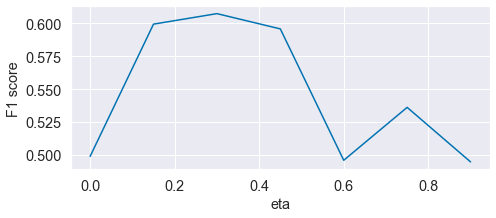

In [213]:
scores = []
for eta in np.arange(0, 1, 0.15):
    clf = XGBClassifier(eta=eta).fit(X_train_resampled, y_train_resampled)
    y_pred = clf.predict(X_test) # using the model on a test set
    score = f1_score(y_test, y_pred, average='macro')
    scores.append(score)
    print("eta: {:.2f} / ".format(eta) + "F1 score (test data): %0.2f" % (score))

plt.figure(figsize = (7.5,3))
plt.xlabel('eta')
plt.ylabel('F1 score')
plt.plot(np.arange(0, 1, 0.15), scores)

**'max_depth'** - Maximum depth of a tree. Increasing this value will make the model more complex and more likely to overfit. 0 is only accepted in lossguided growing policy when tree_method is set as hist and it indicates no limit on depth.

max_depth: 1.00 / F1 score (test data): 0.52
max_depth: 2.00 / F1 score (test data): 0.53
max_depth: 3.00 / F1 score (test data): 0.55
max_depth: 4.00 / F1 score (test data): 0.53
max_depth: 5.00 / F1 score (test data): 0.59
max_depth: 6.00 / F1 score (test data): 0.61
max_depth: 7.00 / F1 score (test data): 0.57
max_depth: 8.00 / F1 score (test data): 0.53
max_depth: 9.00 / F1 score (test data): 0.53


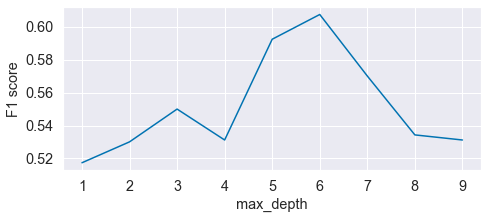

In [214]:
scores = []
for max_depth in range(1, 10):
    clf = XGBClassifier(max_depth=max_depth).fit(X_train_resampled, y_train_resampled)
    y_pred = clf.predict(X_test) # using the model on a test set
    score = f1_score(y_test, y_pred, average='macro')
    scores.append(score)
    print("max_depth: {:.2f} / ".format(max_depth) + "F1 score (test data): %0.2f" % (score))

plt.figure(figsize = (7.5,3))
plt.xlabel('max_depth')
plt.ylabel('F1 score')
plt.plot(range(1, 10), scores)

**'subsample'** - Subsample ratio of the training instances. Setting it to 0.5 means that XGBoost would randomly sample half of the training data prior to growing trees. and this will prevent overfitting. Subsampling will occur once in every boosting iteration.

subsample: 0.00 / F1 score (test data): 0.50
subsample: 0.10 / F1 score (test data): 0.58
subsample: 0.20 / F1 score (test data): 0.62
subsample: 0.30 / F1 score (test data): 0.56
subsample: 0.40 / F1 score (test data): 0.55
subsample: 0.50 / F1 score (test data): 0.59
subsample: 0.60 / F1 score (test data): 0.56
subsample: 0.70 / F1 score (test data): 0.54
subsample: 0.80 / F1 score (test data): 0.49
subsample: 0.90 / F1 score (test data): 0.57


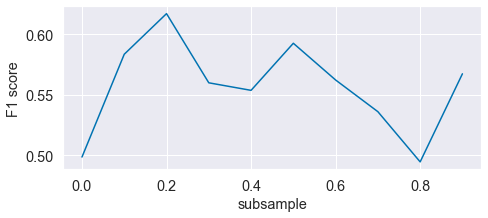

In [215]:
scores = []
for subsample in np.arange(0, 1, 0.10):
    clf = XGBClassifier(subsample=subsample).fit(X_train_resampled, y_train_resampled)
    y_pred = clf.predict(X_test) # using the model on a test set
    score = f1_score(y_test, y_pred, average='macro')
    scores.append(score)
    print("subsample: {:.2f} / ".format(subsample) + "F1 score (test data): %0.2f" % (score))

plt.figure(figsize = (7.5,3))
plt.xlabel('subsample')
plt.ylabel('F1 score')
plt.plot(np.arange(0, 1, 0.10), scores)

**'n_estimators'** – Number of gradient boosted trees. Equivalent to number of boosting rounds.

n_estimators: 50.00 / F1 score (test data): 0.58
n_estimators: 100.00 / F1 score (test data): 0.61
n_estimators: 200.00 / F1 score (test data): 0.62
n_estimators: 250.00 / F1 score (test data): 0.62
n_estimators: 500.00 / F1 score (test data): 0.62


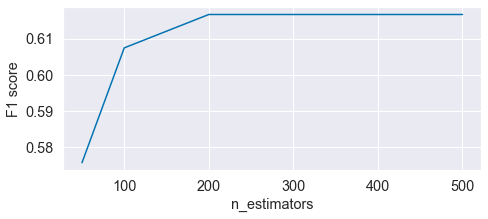

In [216]:
scores = []
for n_estimators in [50, 100, 200, 250, 500]:
    clf = XGBClassifier(n_estimators=n_estimators).fit(X_train_resampled, y_train_resampled)
    y_pred = clf.predict(X_test) # using the model on a test set
    score = f1_score(y_test, y_pred, average='macro')
    scores.append(score)
    print("n_estimators: {:.2f} / ".format(n_estimators) + "F1 score (test data): %0.2f" % (score))

plt.figure(figsize = (7.5,3))
plt.xlabel('n_estimators')
plt.ylabel('F1 score')
plt.plot([50, 100, 200, 250, 500], scores)

### Using the final model

Train the best model and make final predictions:

In [217]:
model = XGBClassifier(subsample = 0.2, n_estimators = 200)

model.fit(X_train_resampled, y_train_resampled) # training the model

y_pred = model.predict(X_test) # using the model on a test set


# Evaluating performance on a new data:
print("ROC AUC (test data): %0.2f\n" % (roc_auc_score(y_test, y_pred)))
      
pred = model.predict(ml_data_2020) # predicting an output
print(f'Cinderellas in 2020: {np.count_nonzero(pred == 1)}')

pred_proba = model.predict_proba(ml_data_2020) # also get probabilities

ROC AUC (test data): 0.74

Cinderellas in 2020: 6


**Compare updated model with the previous one:**

In [218]:
from sklearn.metrics import classification_report
print("\nXGBoost:")
print(classification_report(y_test, y_pred_XGB))
print("\nXGBoost (tuned parameters):")
print(classification_report(y_test, y_pred))


XGBoost:
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1451
         1.0       0.16      0.38      0.22         8

    accuracy                           0.99      1459
   macro avg       0.58      0.68      0.61      1459
weighted avg       0.99      0.99      0.99      1459


XGBoost (tuned parameters):
              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99      1451
         1.0       0.17      0.50      0.26         8

    accuracy                           0.98      1459
   macro avg       0.59      0.74      0.63      1459
weighted avg       0.99      0.98      0.99      1459



#### Show a confusion matrix

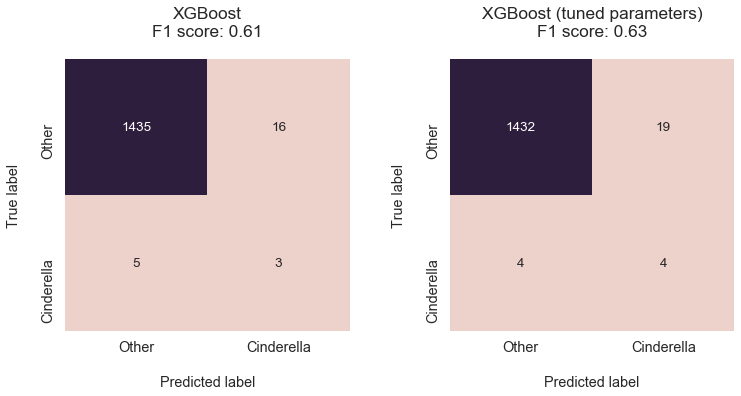

In [219]:
from sklearn.metrics import confusion_matrix

fig, ax = plt.subplots(1,2, figsize = (12,5))

cm = confusion_matrix(y_test, y_pred_XGB)

cm_labels = ['Other', 'Cinderella']

sns.heatmap(cm,
            cmap=sns.cubehelix_palette(),
            cbar=False,
            annot=True, annot_kws={"size": 13.5}, fmt='g',
            xticklabels=cm_labels,
            yticklabels=cm_labels, ax=ax[0])

ax[0].set_title("XGBoost\nF1 score: 0.61\n")

ax[0].set_xlabel("\nPredicted label")
ax[0].set_ylabel("True label\n")


cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm,
            cmap=sns.cubehelix_palette(),
            cbar=False,
            annot=True, annot_kws={"size": 13.5}, fmt='g',
            xticklabels=cm_labels,
            yticklabels=cm_labels, ax=ax[1])

ax[1].set_title("XGBoost (tuned parameters)\nF1 score: 0.63\n")

ax[1].set_xlabel("\nPredicted label")
ax[1].set_ylabel("True label\n")

plt.subplots_adjust(wspace=0.35)
plt.show()

In [220]:
# Determine the way floating point numbers, arrays and other NumPy objects are displayed:
np.set_printoptions(formatter={'float_kind':'{:f}'.format})

# Each probability will be formatted as so:
pred_proba[0]

array([0.999998, 0.000002], dtype=float32)

**Find out which teams are predicted to become a Cinderellas**

In [221]:
ml_data_2020['Cinderella'] = pred
ml_data_2020['Probability'] = np.split(pred_proba, 2, 1)[1]
pred_cinderellas = ml_data_2020[ml_data_2020.Cinderella == 1][['Season', 'TeamID', 'Probability']]
pred_cinderellas

,Season,TeamID,Probability
5844,2020,1113,0.524389
5913,2020,1190,0.995709
5919,2020,1196,0.980080
5948,2020,1228,0.662879
5951,2020,1231,0.789226
6060,2020,1344,0.836006


Team names:

In [222]:
MTeams[MTeams.TeamID.isin(pred_cinderellas.TeamID)]

,TeamID,TeamName,FirstD1Season,LastD1Season
12,1113,Arizona St,1985,2020
89,1190,ETSU,1985,2020
95,1196,Florida,1985,2020
127,1228,Illinois,1985,2020
130,1231,Indiana,1985,2020
243,1344,Providence,1985,2020


Seed numbers from previous seasons, just an additional check:

In [223]:
for team in pred_cinderellas.TeamID:
    print(f'Team: {MTeams.loc[MTeams.TeamID == team, "TeamName"].values[0]}')
    print(MNCAATourneySeeds[MNCAATourneySeeds.TeamID == team].sort_values('Season', ascending=False).head())
    print('\n')

Team: Arizona St
      Season  Seed  TeamID  SeedNo
2246    2019  X11a    1113      11
2178    2018  X11a    1113      11
1920    2014   Y10    1113      10
1565    2009   X06    1113       6
1212    2003   Z10    1113      10


Team: ETSU
      Season Seed  TeamID  SeedNo
2095    2017  W13    1190      13
1624    2010  W16    1190      16
1559    2009  W16    1190      16
1231    2004  W13    1190      13
1168    2003  W15    1190      15


Team: Florida
      Season Seed  TeamID  SeedNo
2245    2019  X10    1196      10
2155    2018  W06    1196       6
2085    2017  W04    1196       4
1894    2014  X01    1196       1
1829    2013  X03    1196       3


Team: Illinois
      Season Seed  TeamID  SeedNo
1816    2013  W07    1228       7
1733    2011  Z09    1228       9
1564    2009  X05    1228       5
1473    2007  Z12    1228      12
1401    2006  Z04    1228       4


Team: Indiana
      Season Seed  TeamID  SeedNo
2018    2016  W05    1231       5
1989    2015  Y10    1231      

Based on our experiment, 6 teams were the potential candidates to become a Cinderellas: **Arizona St, ETSU, Florida, Illinois, Indiana and Providence**.

In [224]:
# Show saved images in the "Results" section:

output_dir = '/kaggle/working/'

if sys.executable != '/opt/conda/bin/python':
    # remove the forward slash if running this notebook locally:
    output_dir = output_dir[1:]

def display_img(filename):
    if os.path.isfile(output_dir + filename):
        display(Image(output_dir + filename))
    else:
        print("Image not found. Re-run this cell when the Implementation section is executed!")

fig_error = "Graph not found. Re-run this cell when the Implementation section is executed!"
def display_fig(fig):
    fig.show(renderer="kaggle")

# III. Results

## 3.1. General Findings

This section summarises general findings about men's NCAA® basketball across different seasons from 1985 to 2020. 

All **calculations** for the numbers mentioned in our findings are available in the [Implementation](#II.-Implementation) section.

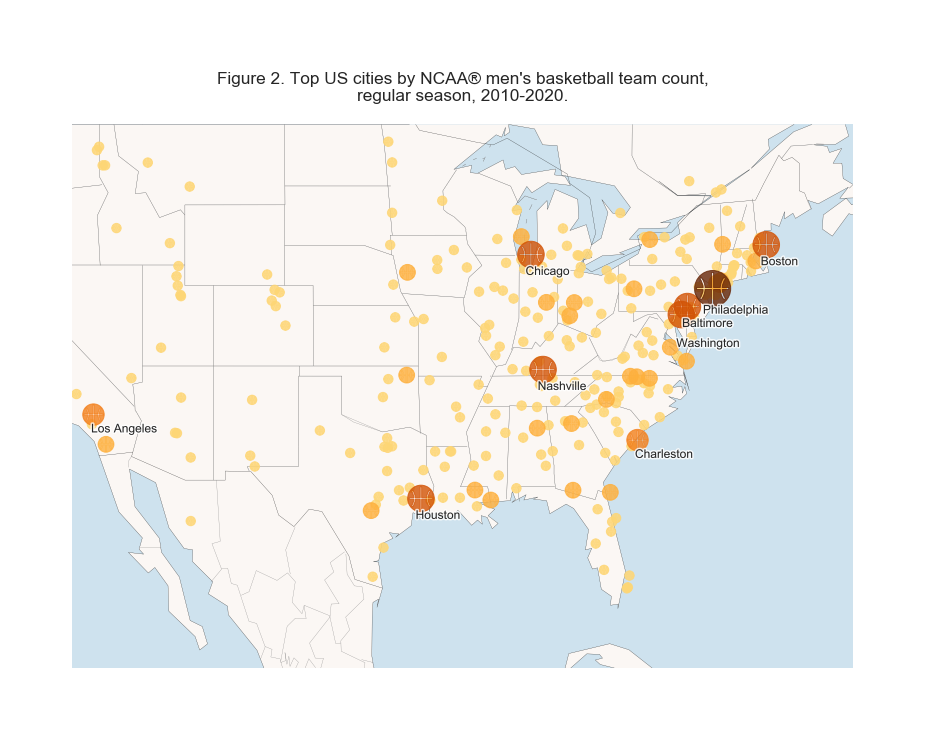

In [225]:
display_img("07.png")

- Based on a 2010-2020 geo data, Philadelphia is the "capital" of men's NCAA® basketball, being a home city of 6 tournament participant teams - Drexel, La Salle, Pennsylvania, St Joseph's, Temple and Villanova. Upon further research, we have verified that 5 of these teams (La Salle, Pennsylvania, St. Joseph’s, Temple and Villanova) form a [Philadelphia Big 5](http://www.philadelphiabig5.org/) - an informal association of college athletic programs.

In [226]:
try:
    display_fig(fig_1)
except NameError:
    print(fig_error)

- Most field goals are scored in the first 5 minutes of the second half, in all seasons from 2015 to 2019. Our interpretation is that probably after the first half is over, a team knows an opponent's moves and can adjust game tactics accordingly. Another reason for this could be that players can have more energy after a rest time, pumped up and motivated to continue a competitive game.

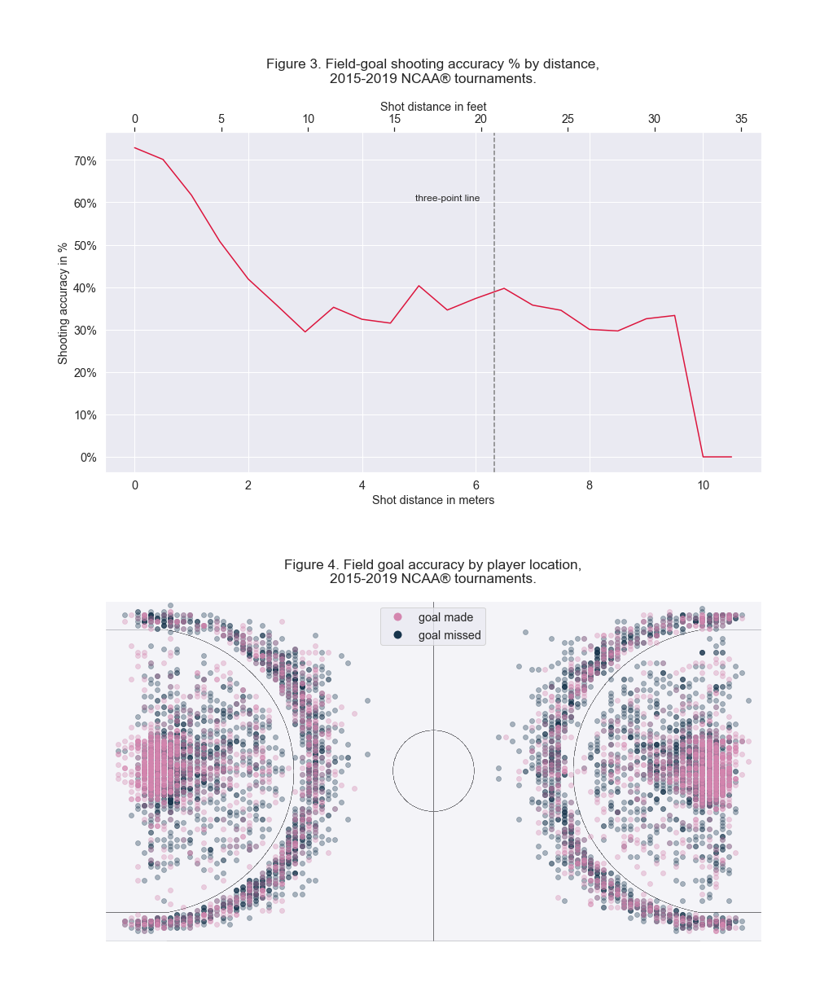

In [227]:
display_img("09.png")

Based on a 2015-2019 data:

- Highest 2-point shot accuracy is achieved in the basket area. Accuracy is lowest at about 3 meters from the basket for two-point goals and there is an interesting peak at about 5 meters where the accuracy improves a little bit.

- For the best 3-point shot accuracy player should make a shot from just behind the three-point line. Shots made from about 9.5-meter distance are more accurate comparing to those made from 8-meter distance.

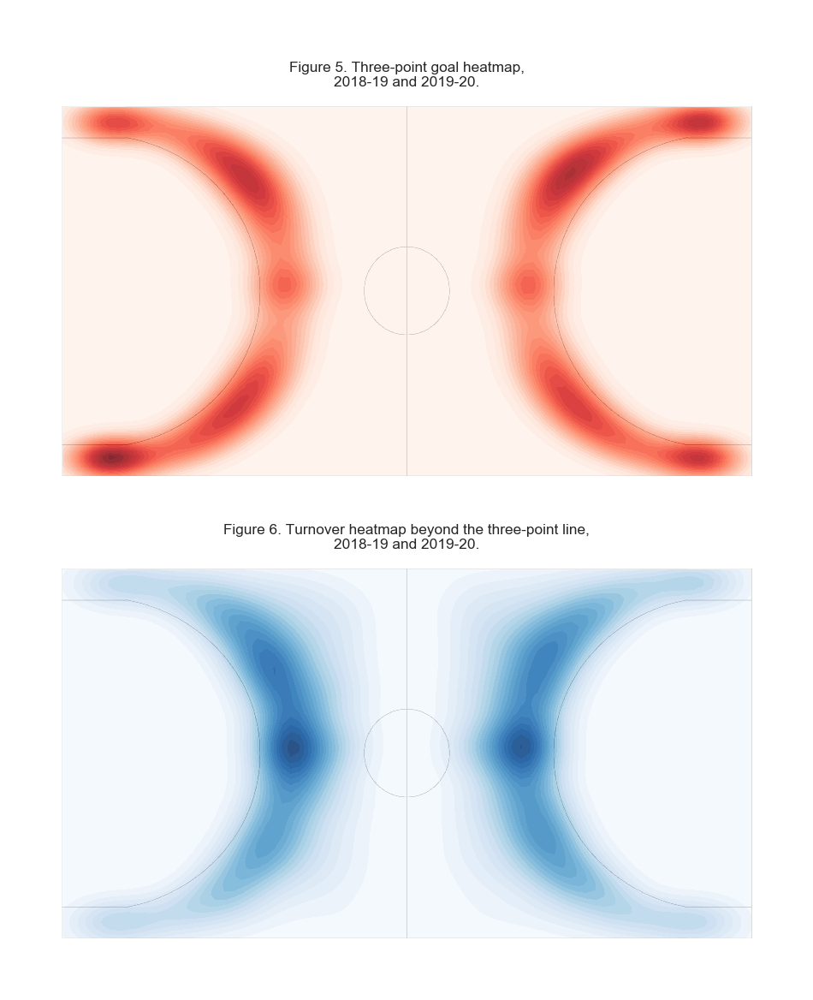

In [228]:
display_img("08.png")

- For the data available with court coordinates (2019-2020), about 69% of the three-point goals were made from either "outside right" or "outside left" area, and only 21% were made from the "outside center" area.

- Could it be because of a possibly stronger defense in the center area? While our data is lacking X, Y coordinates for defensive events like rebounds, blocks and steals, we can see on the second figure that 41% of the turnovers beyond the three-point line happened just about there in the center. There are many actions that can result in a turnover, including: ball stolen by opposing team, throwing a bad pass, throwing the ball out of bounds, stepping out of bounds, committing a double-dribble, palming or traveling violation, committing a backcourt violation, shot clock violation, three-second violation, five-second violation or an offensive foul (charge or illegal screen) [[5]](#References).

- In addition, we assume that if more data would be available, the goals could be distributed more evenly along the three-point line.

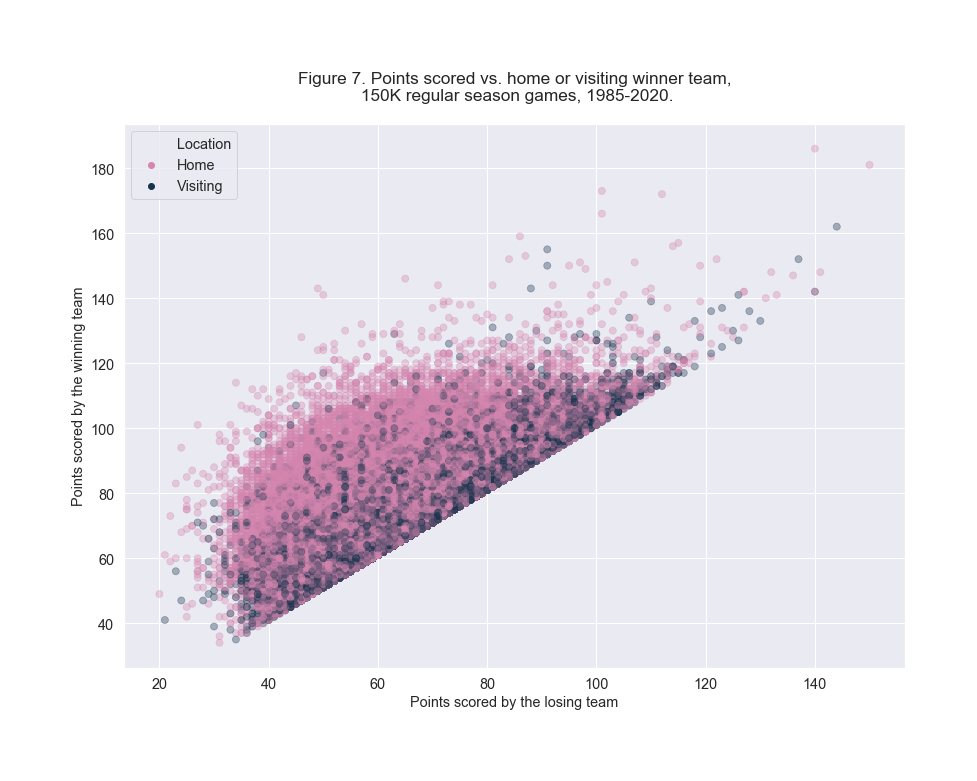

In [229]:
display_img("01.png")

*Note.* Each point in a scatter plot represents an observation in the dataset. In this figure we are looking at a relationship between game location (for the winner team) and points scored. We see that dark points (opponent floor games) are lower and tend a little bit towards the right side (less points for visitor, more points for home team) and pink points (home games) are higher and tend slightly towards left (again, more points for home team, less points for visitor).

Based on a 1985-2020 data:

- Number of points scored by the winning team (a scoring margin, also called "margin of victory") will be higher at home games and lower in road.
- Opponent floor games are more competitive and will end with a lower scoring margin if a visiting team manages to win. A popular explanation is that it might be hard to dominate the opponent on his territory.

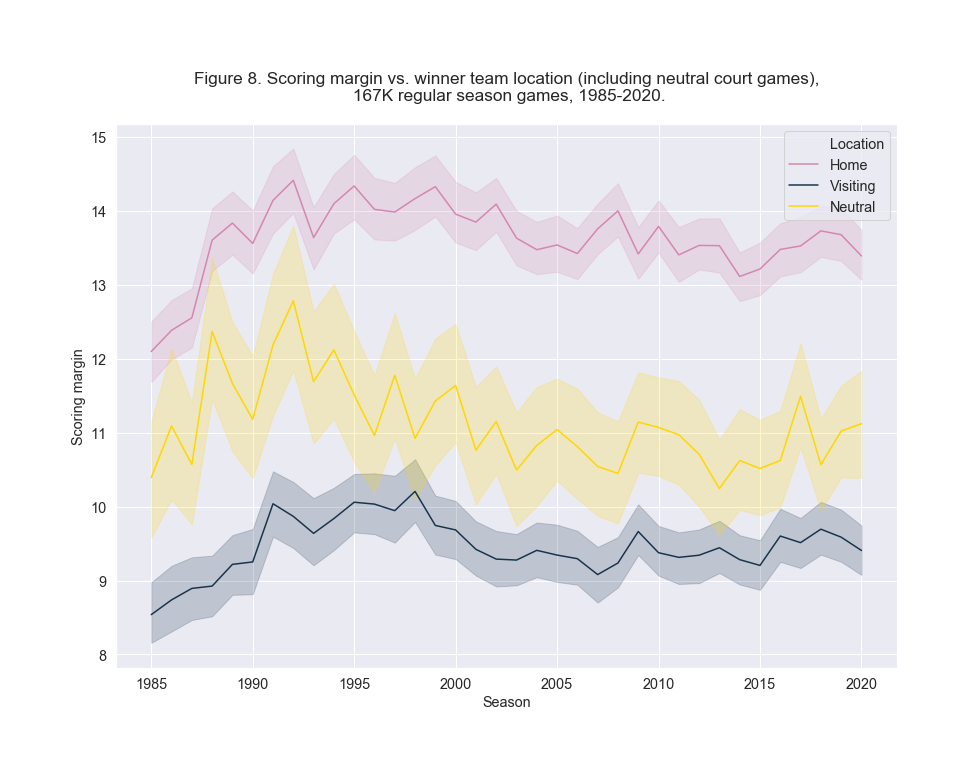

In [230]:
display_img("02.png")

*Note.* In this graph we plot mean scoring margin along with a 95% confidence interval for that mean (a range of values that we can be 95% certain contains the mean). 

Based on a 1985-2020 data:

- The common pattern that we can observe in all seasons from 1985 to 2020 is that, as we saw before, home games are won with highest scoring margin (all season mean 13.63), opponent floor games - with lowest scoring margin (all season mean 9.46), and neutral court games are somewhere in between (all season mean 11.09). It is also worth mentioning that game location is important when evaluating team selection for participation in the tourney - starting with the 2018 season, a team's schedule and results are broken down in four quadrants that place greater emphasis on games played on neutral courts and in true road environments [[6]](#References).

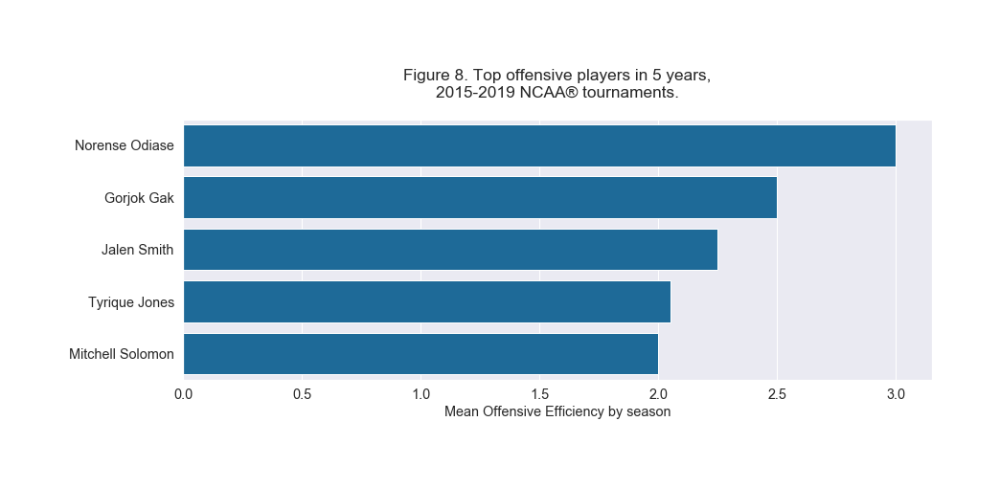

In [231]:
display_img("11.png")

*Note.* To calculate Offensive Efficiency we used the following formula: (FGM + A) / (FGA - OREB + A + TO) [[7]](#References)

Based on a 2015-2019 data, top 5 offensive players in five years using Offensive Efficiency metric by season would be:

1. **Norense Odiase, team Texas Tech**. Odiase completed his Texas Tech career as the winningest player in program history having been a part of teams that compiled 108 victories [[8]](#References).
2. **Gorjok Gak, team Florida**. Rated a three-star prospect by ESPN, Rivals and 247 Sports. Scored 86 points and grabbed 96 rebounds in 46 career appearances [[9]](#References).
3. **Jalen Smith, team Maryland**. Jalen Smith was named a third-team all-American by the Associated Press, adding to his list of end-of-season accolades. Smith also earned third-team honors from CBS Sports, Sports Illustrated and Sporting News [[10]](#References).
4. **Tyrique Jones, team Xavier**. Jones is third in the nation with 20 double-doubles in latest season. He leads the Big East in rebounding (11.1) and he's Xavier's second-leading scorer (13.7). His field goal percentage (54.5) is the best on the team and fifth in the league [[11]](#References).
5. **Mitchell Solomon, team Oklahoma St**. Earned honorable mention All-Big 12 Conference honors from the Associated Press. In Senior Season (2018), led the Oklahoma State Cowboys in field goal percentage (minimum 50 attempts), making 54.5 percent of his shots. Also led the Cowboys in rebounds per game with 6.5 rebounds per game with nearly half of those coming as offensive rebounds [[12]](#References).

## 3.2. Uncovering Cinderellaness

In this section we demonstrate our findings about a key features that define a Cinderella team compared to other team categories. 

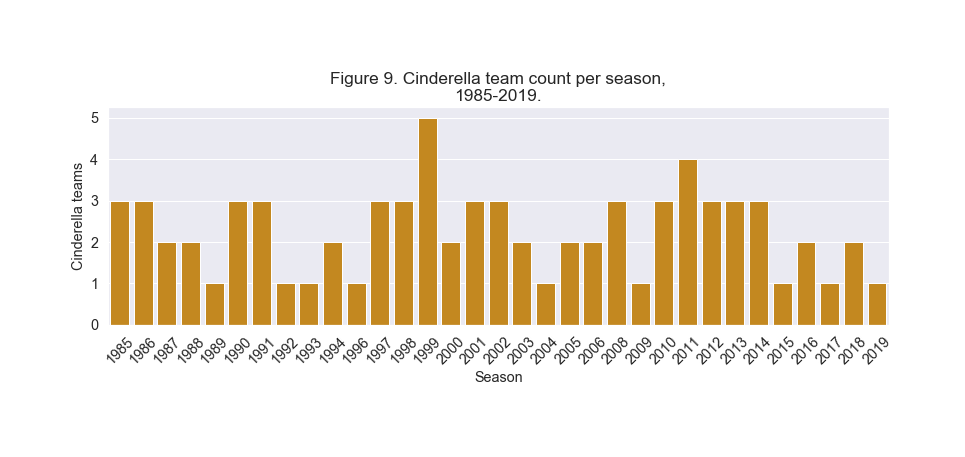

In [232]:
display_img("03.png")

- A season of 1999 had the most <span style="border: 1px dotted #000; background: lightyellow;" title="Any basketball team seeded 10th or worse that has advanced to the Round 3 in NCAA® tournament">Cinderella</span>
 teams. As we saw before in the [Implementation](#II.-Implementation) section, these teams are: Gonzaga, Miami OH, Missouri St, Oklahoma and Purdue.
- The only season when there were no Cinderella teams is a season of 1995.

In [233]:
try:
    display_fig(fig_2)
except NameError:
    print(fig_error)

Based on a 1985-2019 data:

- No. 1 seeds have won the most championships and most games in any particular round.
- None of the teams seeded Nos. 9 through 16 have won the national semifinals nor the national final (metaphorically speaking, this phenomenon is referred to as Cinderella's chariot turning back into a pumpkin).
- None of No. 16 seeds have ever become a Cinderella or even won in a Round 2.
- No. 11 seed Cinderella teams have actually performed better in Elite 8 comparing to No. 10 seeds, having won 4 games vs. only 1 for the 10 seed Cinderella.

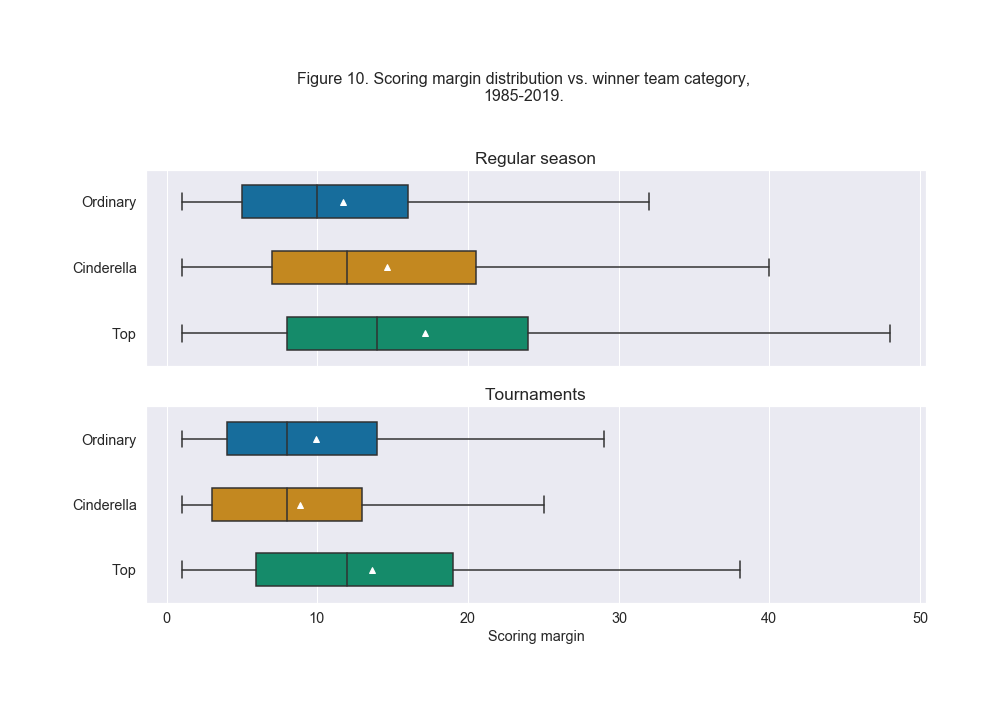

In [234]:
display_img("04.png")

*Note.* A box plot (or box-and-whisker plot) shows the distribution of quantitative data in a way that facilitates comparisons between variables or across levels of a categorical variable. The box shows the quartiles of the dataset while the whiskers extend to show the rest of the distribution, except for points that are determined to be outliers [[13]](#References).

Based on a 1985-2019 data:

- Our results demonstrated that in 58% of games won in regular season, Cinderella teams had a scoring margin above 10 (mean: 14.62, median: 12.0) vs. 47% of games for the Ordinary teams (mean: 11.76, median: 10.0).
- With more competition in the NCAA® tournaments, it is harder for a Cinderella team to keep up the high scoring margin, so the mean value in tournaments is even lower than for the Ordinary teams (Cinderella: 8.89, Ordinary: 9.91). If we look at the median values of this metric they are actually the same (Cinderella: 8, Ordinary: 8).
- In both regular season and tournaments, Top teams match expectations and keep higher scoring margin that both previously mentioned categories. As discussed before, we expect to see the same pattern in all similar plots.

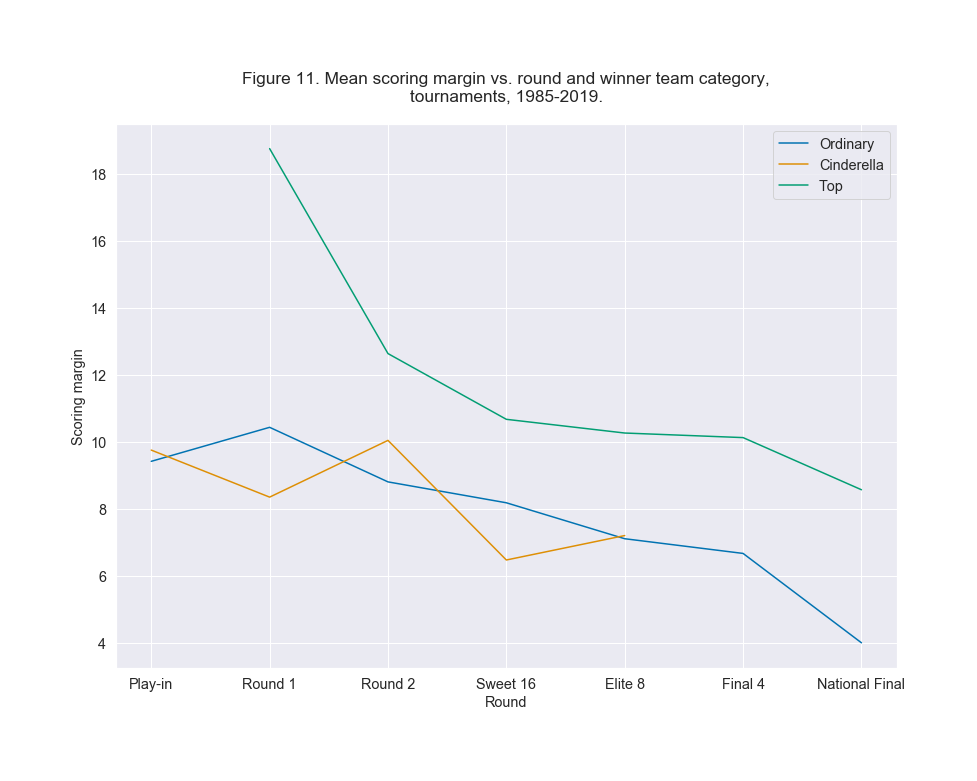

In [235]:
display_img("05.png")

Based on a 1985-2019 data:

- A scoring margin tend to decrease from round to round for both <span style="border: 1px dotted #000; background: lightyellow;" title="Either a 5-9 seed or any seed that has not advanced to the Round 3">Ordinary</span>
 and <span style="border: 1px dotted #000; background: lightyellow;" title="Nos. 1 through 4 seeds who have advanced to the Round 3">Top</span>
 category winner teams. In our interpretation, the scoring margin shows how much power and influence a winner team has over a losing team. With competitiveness increasing as the national final is getting closer, such an influence gets weaker.
- For <span style="border: 1px dotted #000; background: lightyellow;" title="Any basketball team seeded 10th or worse that has advanced to the Round 3 in NCAA® tournament">Cinderella</span>
 teams though, mean scoring margin is on it's highest level (10.04) in Round 2. We speculate that this might be due to the teams being more motivated and engaged after a successful Round 1, but it gets a lot harder to score points in the Sweet 16 against stronger opponents.

In [236]:
try:
    display_fig(fig_3)
except NameError:
    print(fig_error)

*Note.* In this graph and all similar graphs, use dropdown menu and / or buttons to switch between different states. 

Based on a 2003-2019 data:

- Cinderellas are good at shooting 2-pointers in regular season, but not so much in the tournaments (compared to other teams). The opposite is true for the three-point goals.


- In 61% of games played in regular season, Cinderella teams had more than 17 two-point field goals per game, with the mean of 18.91 vs. 17.69 2-pointers for Ordinary teams. In NCAA® tournaments the median score (19 goals) decreased to an Ordinary team level (17 goals).
- If we look at only winning games, in regular season Cinderella teams didn't show much difference in performance compared to Ordinary (median 19 two-point field goals for both categories). As for the tournaments, in 58% of games won in tournaments, Cinderella teams had less than 19 2-point field goals, with the mean of 17.67 vs. 18.85 goals for the Ordinary teams.


- In 56% of games played in tournaments, Cinderella teams had more than 6 three-point goals per game (mean: 6.83, median: 7.0) vs. 47% of games for the Ordinary teams (mean: 6.54, median: 6.0).
- For games won in the tournaments, mean three-point goals per game for Cinderellas (7.31) is even higher than the same for the Top category teams (6.89). You need to make more points per game in order to win against a stronger opponent, and the three-point goal is a perfect tool for accomplishing that.

In [237]:
try:
    display_fig(fig_4)
except NameError:
    print(fig_error)

Based on a 2015-2019 data:

- Cinderella teams have the biggest share of missed free throws (32% missed vs. 68% made) among all team categories.

- Cinderellas have missed the "first of two" free throw attempts in 37% of attempts and have made a successful "first of two" shot in 42% of shots. 

- In 56% of games played in tournaments of 2015-2019, Cinderella teams had less than 13 free throws made (mean: 11.78, median: 12) vs. 49% of games for the Ordinary teams (mean: 12.89, median: 13).

- Despite imbalanced labels (70524 free throw events for Ordinary, 650 for Cinderella and 7522 for Top teams), the structure of free throw attempts looks very similar for all three categories.

In [238]:
try:
    display_fig(fig_5)
except NameError:
    print(fig_error)

Based on a 2003-2019 data:

- Three-point field goal ratio is lower than two-point field goal ratio for all team categories.
- <span style="border: 1px dotted #000; background: lightyellow;" title="Any basketball team seeded 10th or worse that has advanced to the Round 3 in NCAA® tournament">Cinderella</span>
 teams have highest three-point field goal ratio in NCAA® tournaments of all team categories for both games played (37.7%) and games won (41.2%).
- Cinderella teams have a little bit higher two-point field goal ratio than <span style="border: 1px dotted #000; background: lightyellow;" title="Either a 5-9 seed or any seed that has not advanced to the Round 3">Ordinary</span>
 teams in both regular season (50.5% vs. 48.2%) and NCAA® tournaments (48.1% vs. 46.9% for Ordinary).
- In 57% of games won in regular season, Cinderella teams had more than 36 two-point field goal attempts (which is a median value for Ordinary teams).

In [239]:
try:
    display_fig(fig_6)
except NameError:
    print(fig_error)

- Based on a 2003-2019 data, Cinderella teams had higher Assist to Turnover Ratio than Ordinary teams in both regular season (1.11) and NCAA® tournaments (1.06). The same is true for the games won - Assist to Turnover of 1.23 in regular season and 1.17 in the tournaments. Assist to Turnover Ratio is a way to determine how often a player turns the ball over when trying to distribute. This metric reveals a lot about a team's ability to play point guard efficiently [[14]](#References).

In [240]:
try:
    display_fig(fig_7)
except NameError:
    print(fig_error)

Based on a 2003-2019 data:

- In 54% of games played in regular season, Cinderella teams had more than 23 defensive rebounds per game, with the mean value of 24.21 vs. 23.65 defensive rebounds for the Ordinary teams.
- Similar pattern is true for the tournaments - in 56% games, Cinderellas had more than 22 defensive rebounds, which is a median value for the Ordinary.
- The situation changes if we filter out only games won - in 53% of games (won) in regular season and in 54% of NCAA® tournament games Cinderella teams had less defensive rebounds than Ordinary teams.


- In 55% of games played in regular season, Cinderella teams had more than 6 steals per game (mean: 7.18, median: 7) vs. 46% of games for the Ordinary teams (mean: 6.47, median: 6.0).


- Cinderella teams had more than 3 blocks per game in 55% of games won in regular season, with the mean value of 4.04 vs. 3.78 blocks for the Ordinary (median: 3 blocks).

In [241]:
try:
    display_fig(fig_8)
except NameError:
    print(fig_error)

Based on a 2015-2019 data:

- <span style="border: 1px dotted #000; background: lightyellow;" title="Any basketball team seeded 10th or worse that has advanced to the Round 3 in NCAA® tournament">Cinderellas</span>
 might be able to defend without fouling - they had better blocks per personal fouls ratio than <span style="border: 1px dotted #000; background: lightyellow;" title="Either a 5-9 seed or any seed that has not advanced to the Round 3">Ordinary</span>
 teams in both regular season (21.4% vs. 17.8%) and NCAA® tournaments (21.2% vs. 16.7%).

- In 59% of games played in tournaments, Cinderella teams had less than 18 personal fouls (mean: 16.72, median: 16.0) vs. 45% of games for the Ordinary teams (mean: 18.21, median: 18.0).

In [242]:
try:
    display_fig(fig_9)
except NameError:
    print(fig_error)

Based on a 2015-2019 data:

- Foul share of total "foul plus turnover" events for Cinderella (53%) is greater than the same for Ordinary teams (51%) but less than the same for Top teams (55%).

- Cinderellas have almost identical turnover structure as Ordinary teams, both having equal share of bad pass turnover (14%), lost ball turnover (13%), offensive turnover (5%) and travelling turnover (4%).

- Top teams have smaller personal foul share (45% vs. 48%) and greater offensive foul share (6% vs. 5%) than Cinderella teams.

In [243]:
try:
    display_fig(fig_10)
except NameError:
    print(fig_error)

*Note*. To calculate Rebound Margin we used the following formula: RPG - OPP RPG [[15]](#References).

Based on a 2003-2019 data:

- In 60% of games played in regular season, Cinderella teams had a positive Rebound Margin (mean: 2.44, median: 2.0) vs. 47% of games for the Ordinary teams (mean: -0.17, median: 0.0).

- Cinderella teams had a Rebound Margin greater than -2.0 (mean: -0.97, median: 0.0) in 54% of games played in tournaments vs. 49% of games for the Ordinary teams (mean: -1.71, median: -2.0).

- If we look at the games won only, Cinderella teams have lowest Rebound Margin among all team categories (mean: 1.48, median: 2.0), so we should not credit rebounding for a Cinderella's success in game. We also have to be mindful of the fact that this metric does not take into account defensive vs. offensive rebounds.

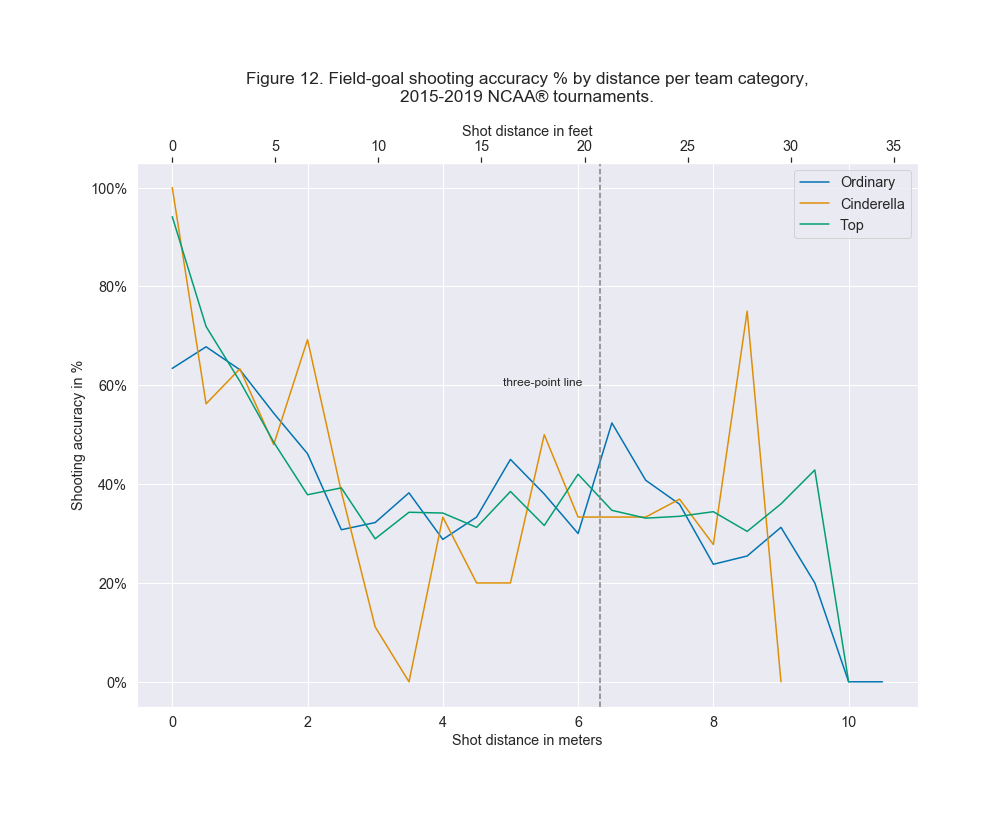

In [244]:
display_img("10.png")

Based on a 2015-2019 data:
- <span style="border: 1px dotted #000; background: lightyellow;" title="Any basketball team seeded 10th or worse that has advanced to the Round 3 in NCAA® tournament">Cinderella</span>
 teams were not so good at shooting 2-pointers from about 3.5 meters from basket, but they were more accurate compared to other team categories when a shot from 2-meter distance was made.
- For the three-point goals, Cinderella teams were most successful in shooting from about 8.5-meter distance.
- Although these findings apply to our data, we believe that if more data would be available, we would not see much difference among the three team categories.

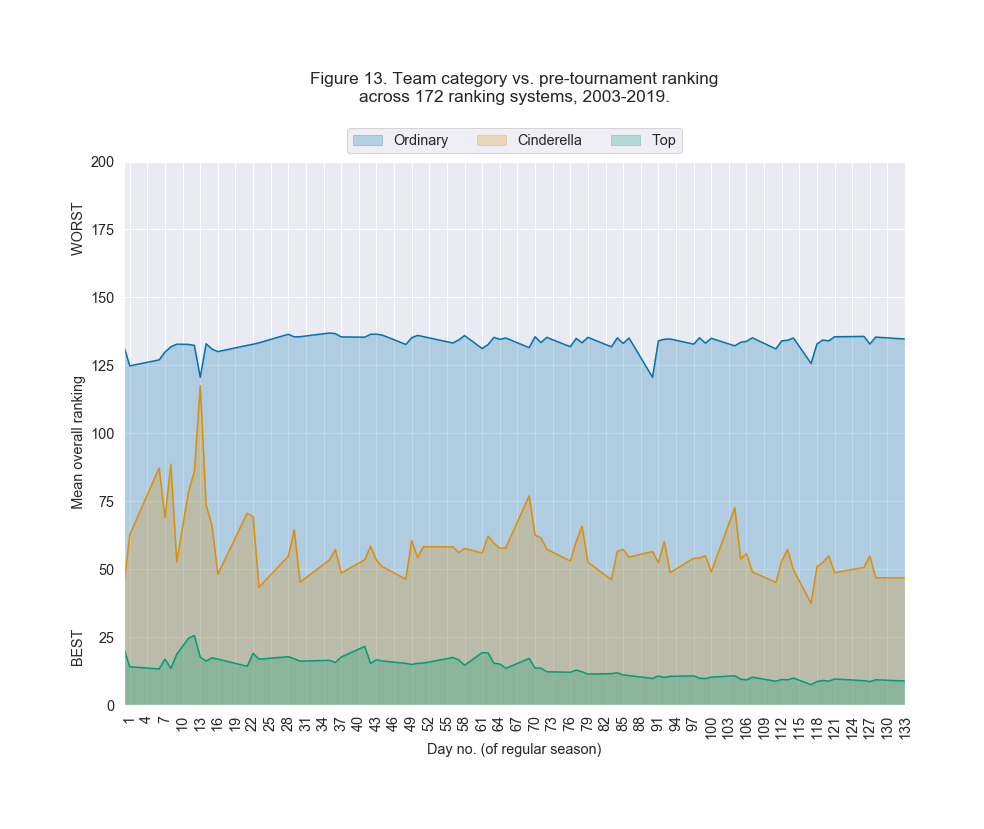

In [245]:
display_img("12.png")

- In 81% public rankings (of 172 ranking systems) in 2003-2019, Cinderella teams were ranked between 20 and 80 (median rank: 49, mean: 53.81.) vs. 15% for the Top (median: 9, mean: 11.95) and 27% for Ordinary teams (median: 119, mean: 134.79). Public rankings could play an effective role in predicting which team is a potential Cinderella of the upcoming season.

In [246]:
try:
    display_fig(fig_11)
except NameError:
    print(fig_error)

Based on a 2003-2019 data:

- The plots look very similar for each of the five different ranking systems. If we look closely at the mean and median rankings for Cinderella teams, we can note that RPI (mean rank 52.91, median: 47) and ESPN SOR (mean: 49.76, median: 48) ranking would be the best  and Sagarin the worst (mean: 56.95, median: 52).
- In 83% public rankings of Pomeroy, RPI, Sagarin, ESPN BPI and ESPN SOR in 2003-2019, Cinderella teams were ranked between 20 and 80 vs. 17% for the Top and 27% for Ordinary teams.

<br />
What is the difference between Pomeroy, RPI, Sagarin, ESPN BPI and ESPN SOR?

**Pomeroy** - Ken Pomeroy ranking system that incorporates statistics like shooting percentage, margin of victory, and strength of schedule, ultimately calculating offensive, defensive, and overall "efficiency" numbers for all teams in Division I. Higher-ranked teams are predicted to beat lower-ranked teams on a neutral court [[16]](#References).

**RPI** - the Rating Percentage Index (RPI) has been used by the NCAA men's basketball committee since 1981, as supplemental data to help select at-large teams and seed all teams for the men's and women's NCAA basketball tournaments. The three component factors which make up the RPI are as follows: (25%) the team's Division I winning percentage, (50%) team's opponents' Division I winning percentage, (25%) team's opponents' opponents' Division I winning percentage [[17]](#References).

**Sagarin** - Jeff Sagarin rankings that aim to do the same thing as the Pomeroy ratings, but use a different formula, one that doesn't (appear to) factor in stats like shooting percentage (though the algorithm is proprietary and, thus, not entirely transparent) [[16]](#References). The overall rating is a synthesis of the three different score-based methods: PREDICTOR, GOLDEN_MEAN, and RECENT [[18]](#References).

**ESPN BPI** - a predictive rating system for college basketball that's designed to measure team strength and project performance going forward. In the simplest sense, BPI (College Basketball Power Index) is a power rating that can be used to determine how much better one team is than another [[19]](#References). 

**ESPN SOR** - ESPN's Strength of Record takes strength of schedule a step further by accounting for how a team actually did against its schedule. Unlike BPI, which accounts for how the game was won, Strength of Record simply cares about the difficulty of a team’s schedule and the result (win or loss) [[19]](#References).

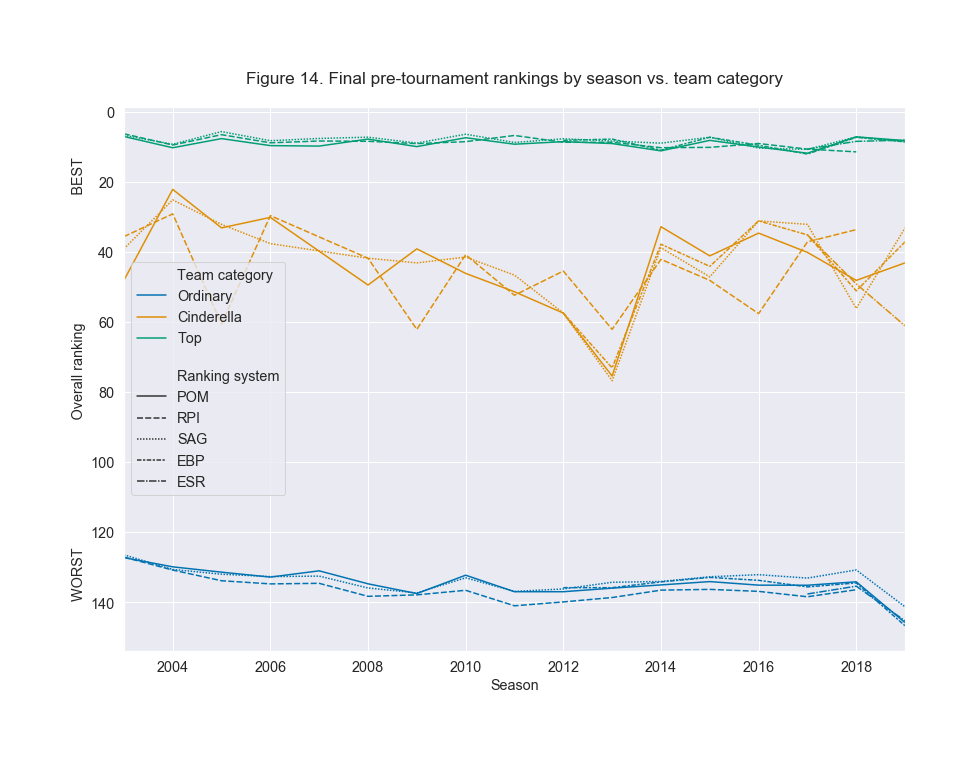

In [247]:
display_img("13.png")

- In 71% of final pre-tournament rankings in 2003-2019, <span style="border: 1px dotted #000; background: lightyellow;" title="Any basketball team seeded 10th or worse that has advanced to the Round 3 in NCAA® tournament">Cinderella</span>
 teams were ranked between 20 and 65 vs. 16% for the <span style="border: 1px dotted #000; background: lightyellow;" title="Nos. 1 through 4 seeds who have advanced to the Round 3">Top</span>
 and 21% for <span style="border: 1px dotted #000; background: lightyellow;" title="Either a 5-9 seed or any seed that has not advanced to the Round 3">Ordinary</span>
 teams. This is consistent with what has been found in previous graphs.
- It is notable that the ranking range for each category stays quite consistent from season to season despite that each season has it's own, different Cinderella teams.

## 3.3. Predicting Cinderellas

We have trained a machine learning model to predict which teams could become a Cinderellas in season 2020 if the tournament would not be canceled. 

Our final model used XGBoost classifier. It was **able to predict whether or not a team will be a Cinderella with a 0.98 accuracy** on a data it had never seen. Considering that input data was heavily imbalanced (only 34 Cinderella cases vs. 5799 non-Cinderella cases), we used **F1 score and ROC AUC** (area under the ROC curve) metrics to evaluate final results. 

We acknowledge that "Cinderellaness" is a tricky feature that is not straightforward to predict, so we appreciated achieving a macro average F1 score of 0.63 and ROC AUC of 0.74 on a test dataset.

According to our results, **top 3 potential Cinderella teams of 2020** could be:

- ETSU (99.6% probability)
- Florida (98.0% probability)
- Providence (83.6% probability)

<br />
<div style="width:200px;height:60px;background-color:#041E42;text-align: center;font-size:12pt;color:#fff;display: inline-block;">
	<br>BUCCANEERS</div><div style="width:200px;height:60px;background-color:#003087;text-align: center;font-size:12pt;color:#fff;display: inline-block;">
	<br>GATORS</div><div style="width:200px;height:60px;background-color:#010101;text-align: center;font-size:12pt;color:#fff;display: inline-block;">
	<br>FRIARS</div>

<br />

Although we do not have a ground truth data to check our predictions, we have verified that a similar assumption about **ETSU Cinderella potential** was discussed in SPORTS ILLUSTRATED [[20]](#References), NBC Sports [[21]](#References) and USA TODAY [[22]](#References).

Please refer to [Implementation](#II.-Implementation) section to see all 6 Cinderella candidates that our model has predicted.

---
# References

[1] Kaggle. (2020). Google Cloud & NCAA® March Madness Analytics. Data Description. [Online]. Available: https://www.kaggle.com/c/march-madness-analytics-2020/data
<br />[2] NCAA. (2020). NCAA cancels remaining winter and spring championships. [Online]. Available: https://www.ncaa.org/about/resources/media-center/news/ncaa-cancels-remaining-winter-and-spring-championships
<br />[3] J. Boozell. (2019). The 11 greatest March Madness Cinderella stories. [Online]. Available: https://www.ncaa.com/news/basketball-men/2019-02-21/11-greatest-march-madness-cinderella-stories
<br />[4] K. Bonsor and D. Roos. (2003). How March Madness Works. [Online]. Available: https://entertainment.howstuffworks.com/march-madness.htm
<br />[5] Jr NBA. (n.d.). Turnover. [Online]. Available: https://jr.nba.com/turnover/
<br />[6] NCAA. (ca. 2020). Selection Criteria. [Online]. Available: http://www.ncaa.org/about/resources/media-center/mens-basketball-selections-101-selections
<br />[7] Thunder StatLab. (n.d.). OFFENSIVE EFFICIENCY. [Online]. Available: https://www.nba.com/resources/static/team/v2/thunder/statlab-OE-191201.pdf
<br />[8] Texas Tech University. (ca. 2020). NORENSE ODIASE. [Online]. Available: https://texastech.com/sports/mens-basketball/roster/norense-odiase/6580
<br />[9] University Athletic Assoc., Inc., FOX Sports Sun & IMG College. (ca. 2019). GORJOK GAK. [Online]. Available: https://floridagators.com/sports/mens-basketball/roster/gorjok-gak/11067
<br />[10] E. Giambalvo. (2020). Maryland basketball’s Jalen Smith earns third-team all-American honors. [Online]. Available: https://www.washingtonpost.com/sports/2020/03/20/maryland-basketballs-jalen-smith-earns-third-team-all-american-honors/
<br />[11] R. Wilson. (2020). Can 'unbreakable' Tyrique Jones carry Xavier into NCAA Tournament? [Online]. Available: https://www.wcpo.com/sports/college-sports/xavier-university-sports/can-unbreakable-tyrique-jones-carry-xavier-into-ncaa-tournament
<br />[12] Oklahoma State University Athletics. (ca. 2020). MITCHELL SOLOMON. [Online]. Available: https://okstate.com/sports/mens-basketball/roster/mitchell-solomon/4051
<br />[13] Seaborn. (n.d.). seaborn.boxplot. [Online]. Available: https://seaborn.pydata.org/generated/seaborn.boxplot.html
<br />[14] M. Badger. (ca. 2014). Stat Central: Understanding Strengths, Shortcomings Of Assist Rate Metrics. [Online]. Available: https://hoopshabit.com/2013/08/18/stat-central-understanding-strengths-shortcomings-of-assist-rate-metrics/
<br />[15] NCAA. (2020). Men's Basketball. TEAM STATISTICS. REBOUND MARGIN. [Online]. Available: https://www.ncaa.com/stats/basketball-men/d1/current/team/151
<br />[16] S. Paruk. (2020). Which Advanced Metric Should Bettors Use: KenPom or Sagarin? [Online]. Available: https://www.sportsbettingdime.com/guides/strategy/kenpom-vs-sagarin/
<br />[17] Collegiate Basketball News Company. (n.d.). What is the RPI? [Online]. Available: http://rpiratings.com/WhatisRPI.php
<br />[18] J. Sagarin. (2020). Jeff Sagarin's College Basketball Ratings. [Online]. Available: http://sagarin.com/sports/cbsend.htm
<br />[19] ESPN Sports Analytics Team. (2016). BPI and Strength of Record: What are they and how are they derived? [Online]. Available: https://www.espn.com/blog/statsinfo/post/_/id/125994/bpi-and-strength-of-record-what-are-they-and-how-are-they-derived
<br />[20] K. Sweeney. (2020). Cinderella Spotlight: Steve Forbes Has Built a Mid-Major Force at East Tennessee State. [Online]. Available: https://www.si.com/college/2020/03/11/march-madness-cinderellas-etsu-basketball
<br />[21] R. Dauster. (2020). Introducing Cinderella: East Tennessee State doesn’t need an at-large bid anymore. [Online]. Available: https://collegebasketball.nbcsports.com/2020/03/09/introducing-cinderella-east-tennessee-state-doesnt-need-an-at-large-bid-anymore/
<br />[22] S. Gleeson. (2020). Six mid-major teams that had potential to be Cinderella before coronavirus canceled March Madness. [Online]. Available: https://eu.usatoday.com/story/sports/ncaab/2020/03/16/coronavirus-march-madness-ncaa-tournament-cinderella-potential/5012987002/
<br />[23] D. Wilco. (2020). What is March Madness: The NCAA tournament explained. [Online]. Available: https://www.ncaa.com/news/basketball-men/bracketiq/2020-04-20/what-march-madness-ncaa-tournament-explained
<br />[24] City location coordinates obtained via [GeoPy Nominatim](https://geopy.readthedocs.io/en/stable/#nominatim) geocoder for OpenStreetMap data. (The MIT License). [Online]. Available: https://www.kaggle.com/evanca/ncaageocities
<br />[25] Court outline image (Figures 4-6) courtesy of author.
<br />[26] K. Bonsor. (2003). How Basketball Works. Scoring. [Online]. Available: https://entertainment.howstuffworks.com/basketball4.htm
<br />[27] Scikit-learn. (n.d.). Support Vector Machines. [Online]. Available: https://scikit-learn.org/stable/modules/svm.html
<br />[28] Scikit-learn. (n.d.). 3.2.4.3.1. sklearn.ensemble.RandomForestClassifier. [Online]. Available: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
<br />[29] Xgboost developers. (n.d.). XGBoost Documentation. [Online]. Available: https://xgboost.readthedocs.io/en/latest/
<br />[30] Xgboost developers. (n.d.). XGBoost Parameters. [Online]. Available: https://xgboost.readthedocs.io/en/latest/parameter.html


<br />Use of external Open Source packages:
<br />https://github.com/Phlya/adjustText (The MIT License)
<br />https://github.com/nvictus/svgpath2mpl (The 3-Clause BSD License)



---

#### Web Accessibility Statement
We aimed for a visually friendly designs and used **color schemes** that should be easily identified by people with all types of color vision. We ensured that default **fonts** are no smaller than 9 points/pixels in all of our plots. Your feedback and suggestions are welcome about how we can continue to improve the accessibility.
